In [1]:
import dpkt
import os
import pandas as pd
from utils.util import create_directory_if_not_exists, find_files_with_extension
from utils.plotter import plot_siftr_graph


# Convert bytes to Mbit/s
def bytes_to_mbits(bytes):
    return (bytes * 8) / 1_000_000

# Read pcap file and get throughput per second for specific ports
def read_pcap(file_path):
    throughput_per_second = {5101: {}, 5102: {}, 5103: {}}
    total_throughput = {5101: 0, 5102: 0, 5103: 0}
    start_time = None

    with open(file_path, 'rb') as f:
        pcap = dpkt.pcap.Reader(f)

        for timestamp, buf in pcap:
            eth = dpkt.ethernet.Ethernet(buf)
            if not isinstance(eth.data, dpkt.ip.IP):
                continue

            ip = eth.data
            if not isinstance(ip.data, dpkt.tcp.TCP):
                continue

            tcp = ip.data
            dest_port = tcp.dport
            if dest_port not in throughput_per_second:
                continue

            pkt_length = len(buf)

            if start_time is None:
                start_time = timestamp

            # Normalize the timestamp to start from 0
            normalized_time = int(timestamp - start_time)

            if normalized_time not in throughput_per_second[dest_port]:
                throughput_per_second[dest_port][normalized_time] = pkt_length
            else:
                throughput_per_second[dest_port][normalized_time] += pkt_length
            total_throughput[dest_port] += pkt_length

    return throughput_per_second , total_throughput

# Plot throughput using plot_siftr_graph
def plot_throughput_with_siftr(file_path, ycolumn, title, xlabel, ylabel, filename, graph_directory):
    throughput, total_thrpt = read_pcap(file_path)
    paths = {}
    print(f"Total throughput for {filename}: {total_thrpt}")

    for port, data in throughput.items():
        # Sort throughput dictionary by time
        sorted_throughput = sorted(data.items())

        # Prepare time and throughput values
        times = [item[0] for item in sorted_throughput]
        mbits_transferred = [bytes_to_mbits(item[1]) for item in sorted_throughput]
        

        # Create a DataFrame for each port
        path_df = pd.DataFrame({'Time': times, ycolumn: mbits_transferred})
        path_label = f"Port {port}"
        if port == 5101:
            path_label = "Cubic"
        elif port == 5102: 
            path_label = "New Reno"
        elif port == 5103:
            path_label = "DCTCP"
        # Store the DataFrame in the paths dictionary
        paths[path_label] = path_df

    # Ensure the output directory exists
    create_directory_if_not_exists(graph_directory)

    # Call the plot_siftr_graph function to plot the graph
    plot_siftr_graph(paths, ycolumn, title, xlabel, ylabel, filename, graph_directory)

# Main execution
mainpth = "./Data"
graph_directory = os.path.join(mainpth, "Graphs")
create_directory_if_not_exists(graph_directory)

folderpath = os.path.join(mainpth, "server_data")

# Use the new find_files_with_extension function
filenames, filepaths, file_dict = find_files_with_extension(paths=[folderpath], extension='.em1.pcap')

from utils.thrpt_util import analysis_pcap_tcp

Directory already exists: ./Data\Graphs


In [2]:
# # Plot throughput for each pcap file
# for filename, filepath in zip(filenames, filepaths):
#     print(filename)
#     analysis_pcap_tcp(filepath)

Total throughput for 1_fq_codel_10Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 12483898, 5102: 11386658, 5103: 13547045}
Directory already exists: ./Data\Graphs


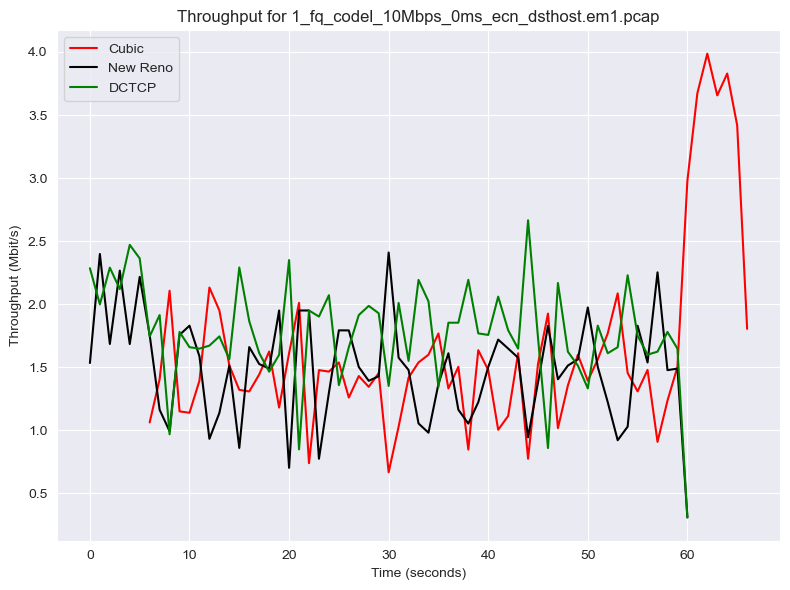

Total throughput for 1_fq_codel_10Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 10009215, 5102: 8825411, 5103: 20850572}
Directory already exists: ./Data\Graphs


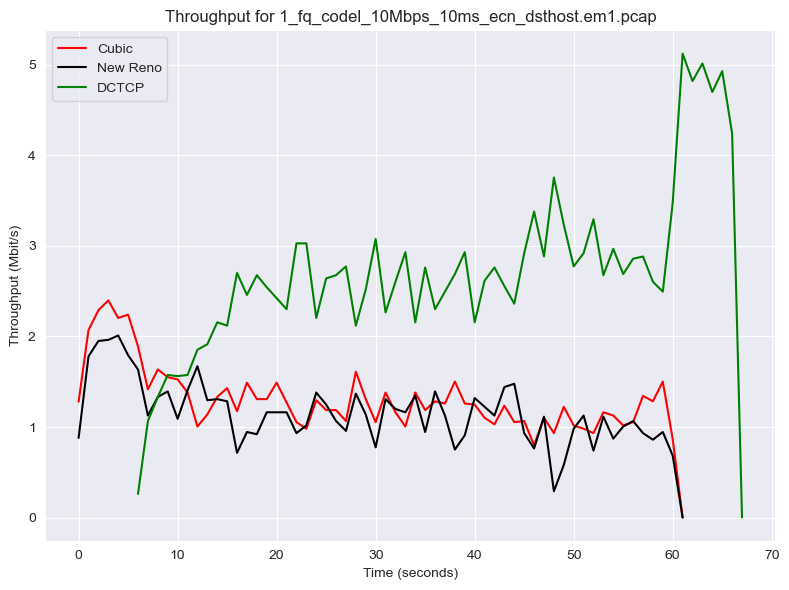

Total throughput for 1_fq_codel_10Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 11780665, 5102: 11047520, 5103: 14162458}
Directory already exists: ./Data\Graphs


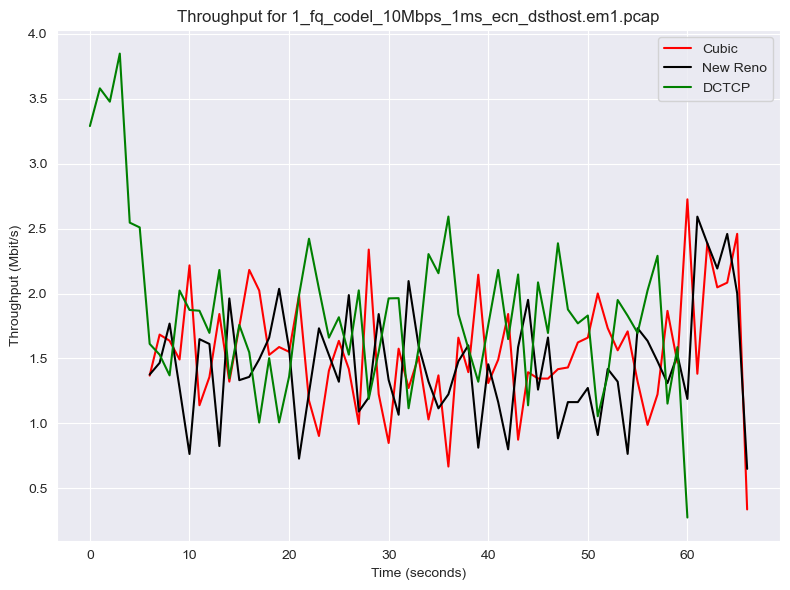

Total throughput for 1_fq_codel_10Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 13689324, 5102: 8970834, 5103: 16566217}
Directory already exists: ./Data\Graphs


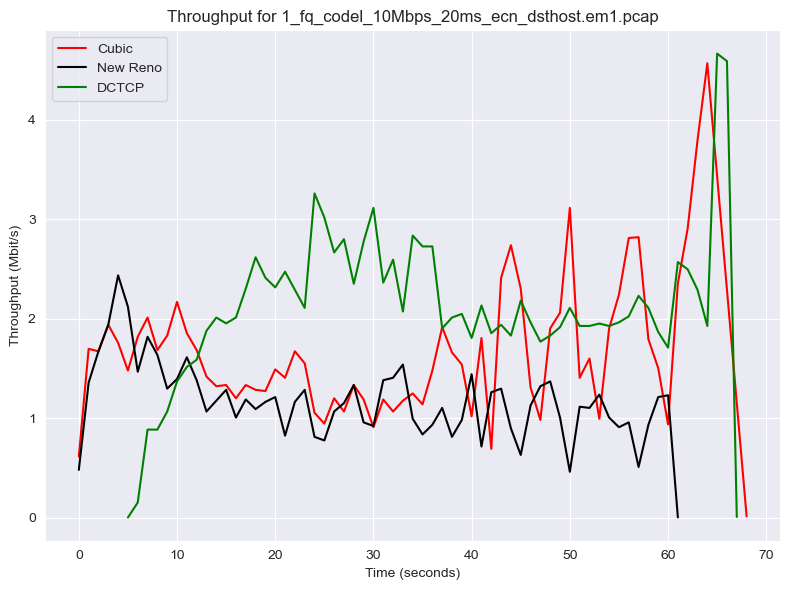

Total throughput for 1_fq_codel_10Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 11435886, 5102: 11296964, 5103: 12056010}
Directory already exists: ./Data\Graphs


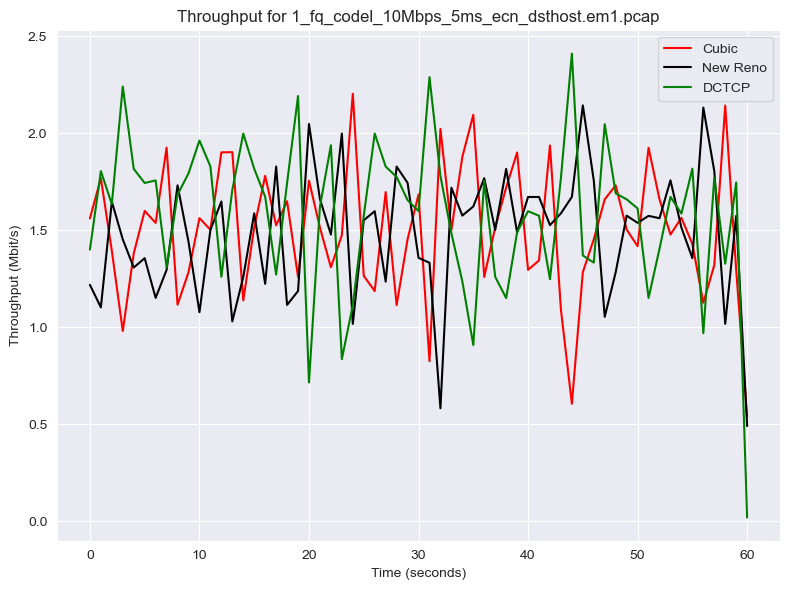

Total throughput for 1_fq_codel_10Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 11675787, 5102: 10541893, 5103: 12607212}
Directory already exists: ./Data\Graphs


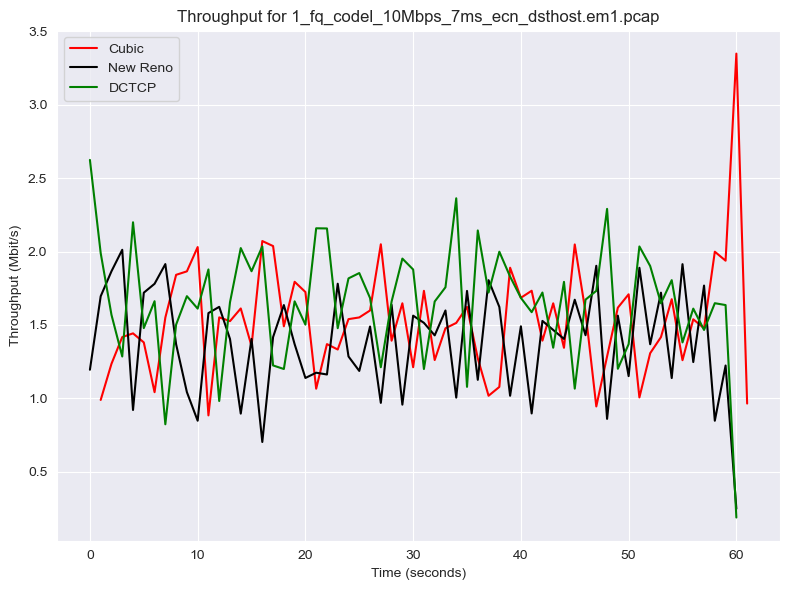

Total throughput for 1_fq_codel_20Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 18051368, 5102: 18781791, 5103: 20828679}
Directory already exists: ./Data\Graphs


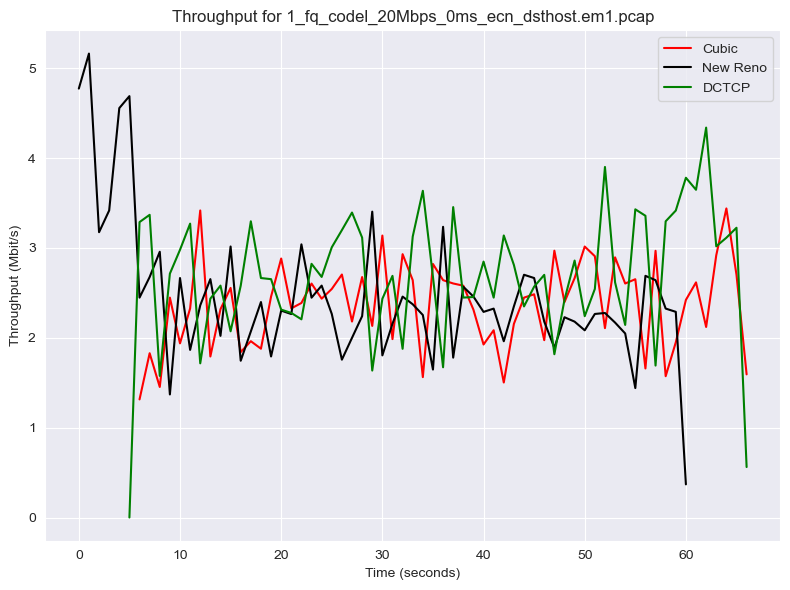

Total throughput for 1_fq_codel_20Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 11553304, 5102: 8584606, 5103: 18800549}
Directory already exists: ./Data\Graphs


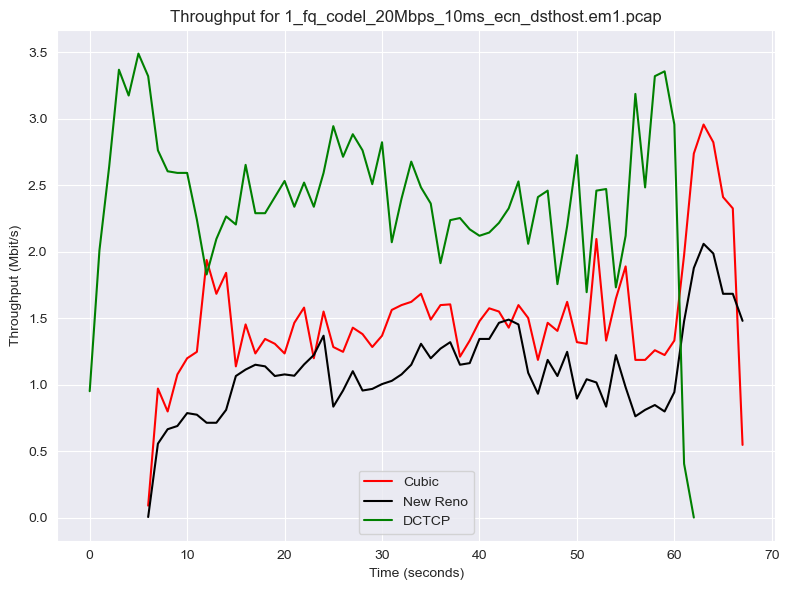

Total throughput for 1_fq_codel_20Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 16746942, 5102: 16634894, 5103: 19548397}
Directory already exists: ./Data\Graphs


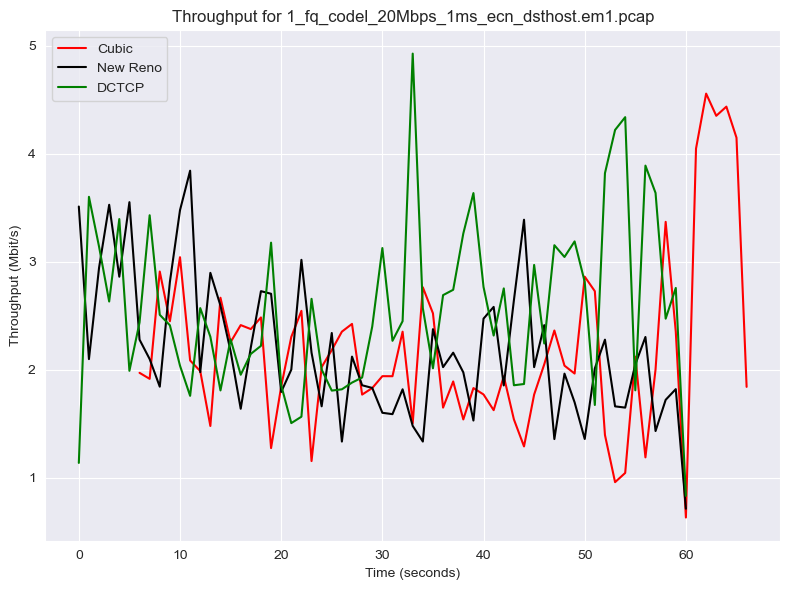

Total throughput for 1_fq_codel_20Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 14679651, 5102: 8822750, 5103: 17027151}
Directory already exists: ./Data\Graphs


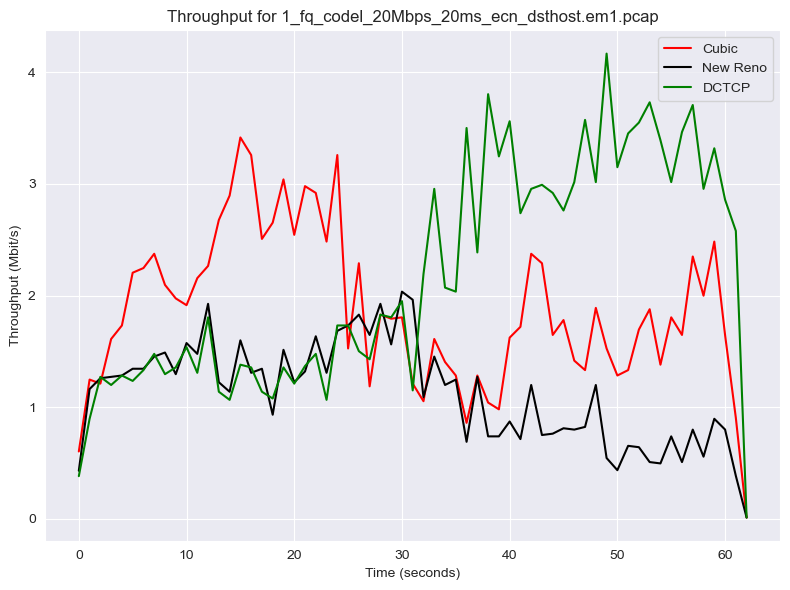

Total throughput for 1_fq_codel_20Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 17875017, 5102: 16164522, 5103: 22611338}
Directory already exists: ./Data\Graphs


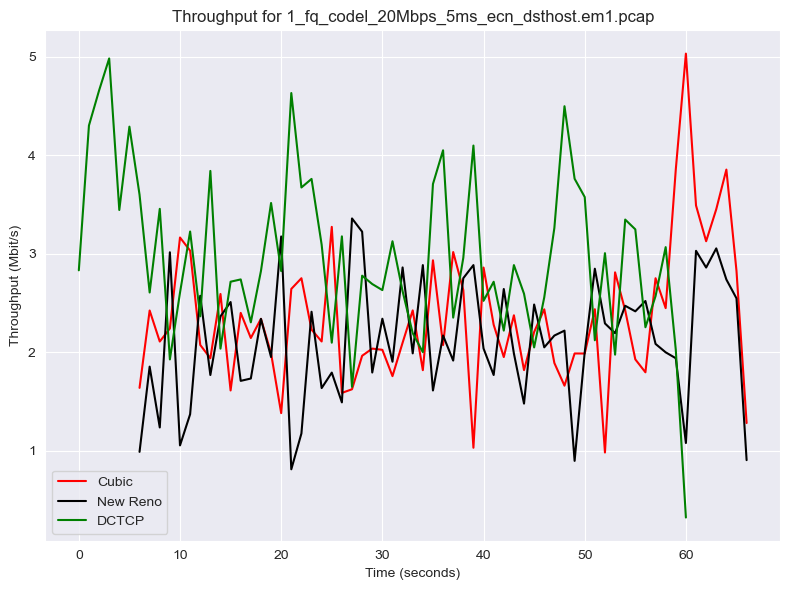

Total throughput for 1_fq_codel_20Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 15661680, 5102: 15363201, 5103: 19373805}
Directory already exists: ./Data\Graphs


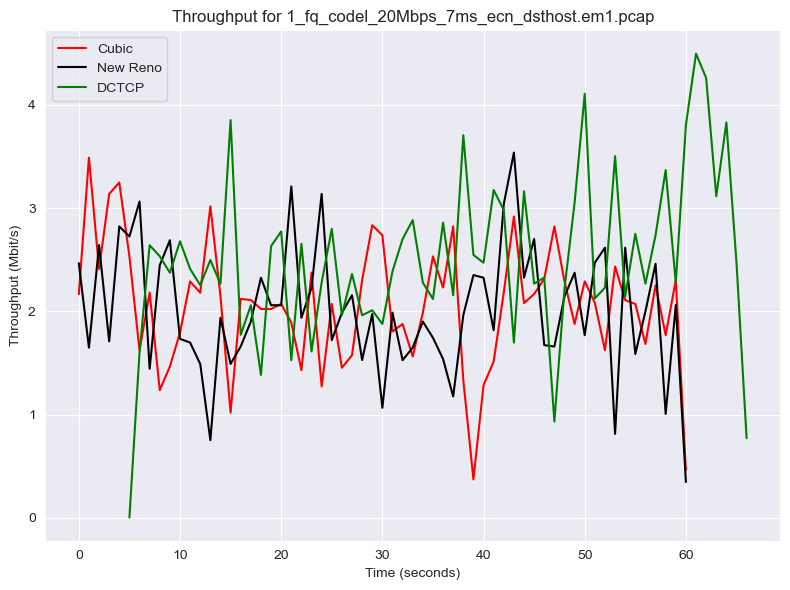

Total throughput for 1_fq_codel_5Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 6016881, 5102: 6680056, 5103: 6359026}
Directory already exists: ./Data\Graphs


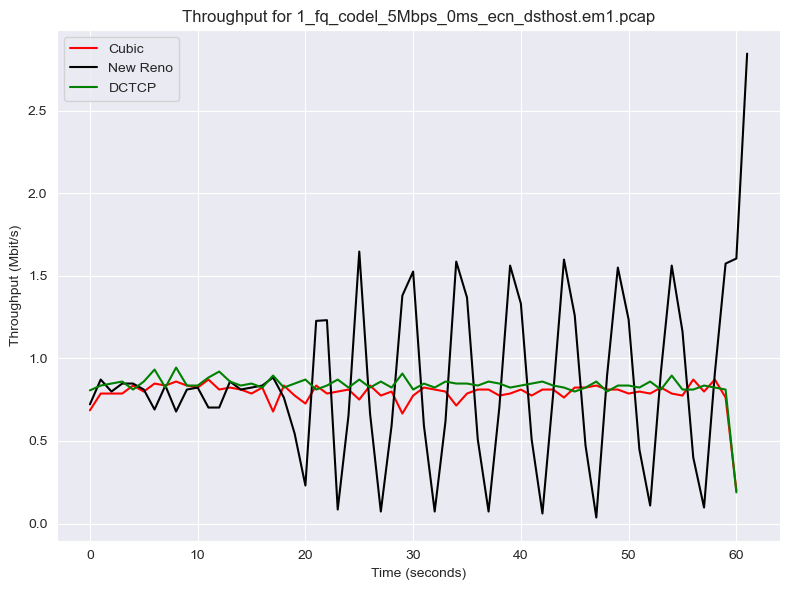

Total throughput for 1_fq_codel_5Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 5880867, 5102: 6410630, 5103: 8081872}
Directory already exists: ./Data\Graphs


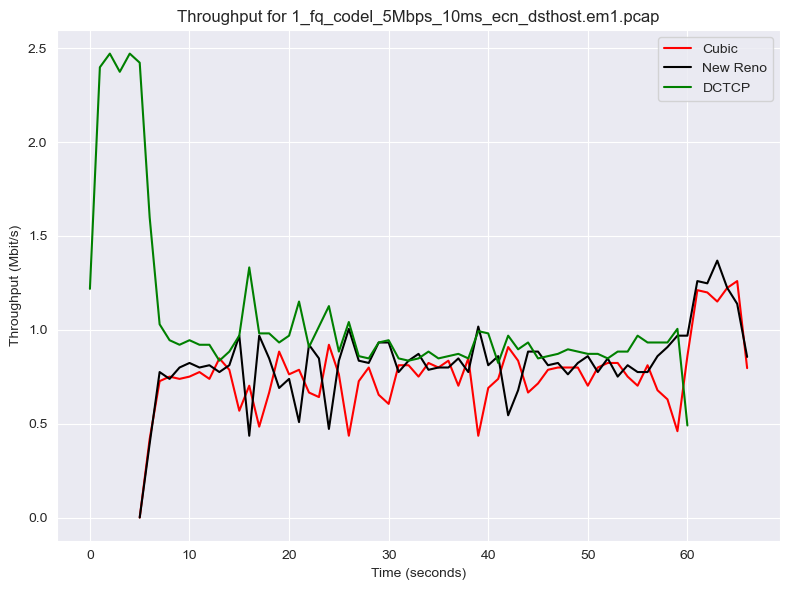

Total throughput for 1_fq_codel_5Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 8212184, 5102: 5812449, 5103: 6459088}
Directory already exists: ./Data\Graphs


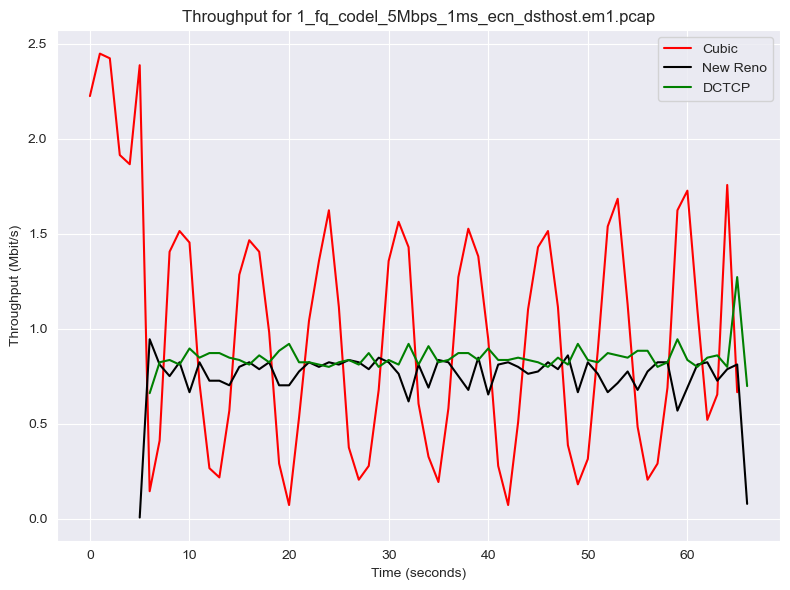

Total throughput for 1_fq_codel_5Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 6074415, 5102: 6213761, 5103: 7812709}
Directory already exists: ./Data\Graphs


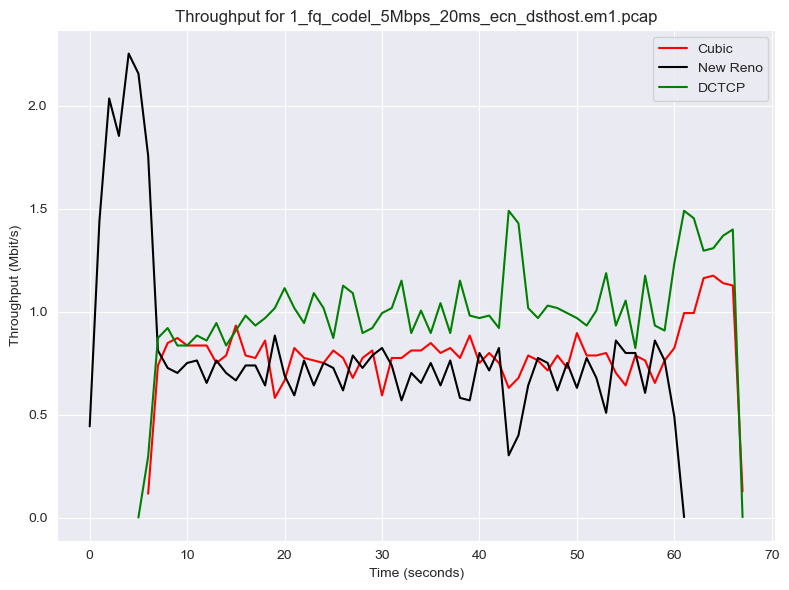

Total throughput for 1_fq_codel_5Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 6222875, 5102: 7830637, 5103: 6522537}
Directory already exists: ./Data\Graphs


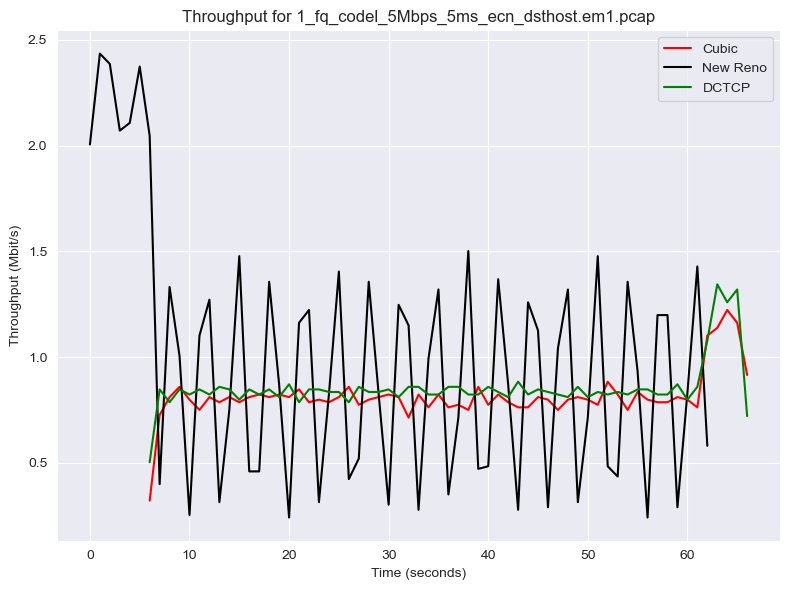

Total throughput for 1_fq_codel_5Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 6102433, 5102: 5985069, 5103: 6590714}
Directory already exists: ./Data\Graphs


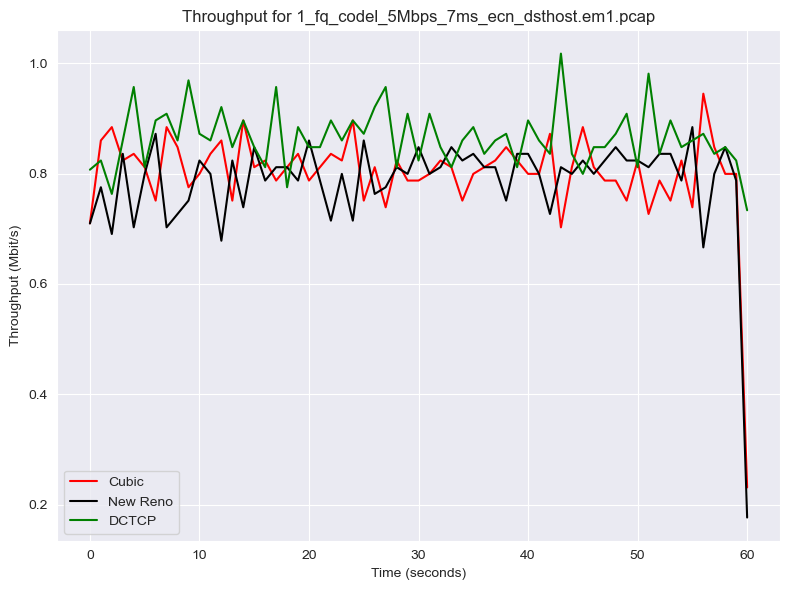

Total throughput for 1_fq_codel_8Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 10539660, 5102: 10455320, 5103: 11118040}
Directory already exists: ./Data\Graphs


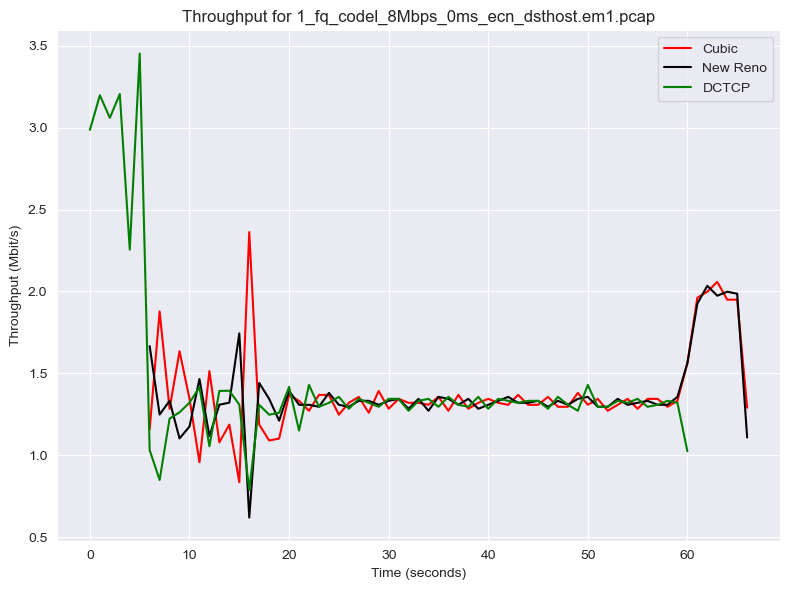

Total throughput for 1_fq_codel_8Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 9729802, 5102: 8786053, 5103: 11662566}
Directory already exists: ./Data\Graphs


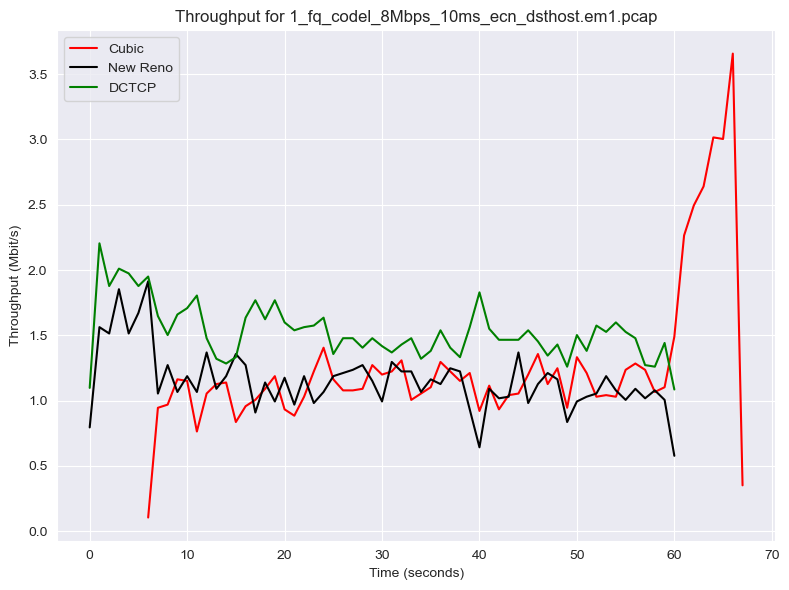

Total throughput for 1_fq_codel_8Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 10484022, 5102: 11345404, 5103: 10462342}
Directory already exists: ./Data\Graphs


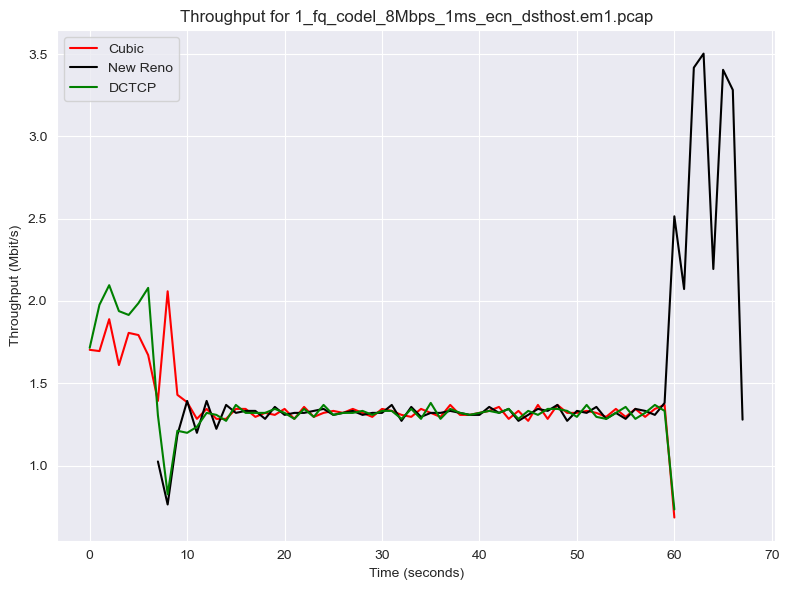

Total throughput for 1_fq_codel_8Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 8323303, 5102: 8047303, 5103: 12625570}
Directory already exists: ./Data\Graphs


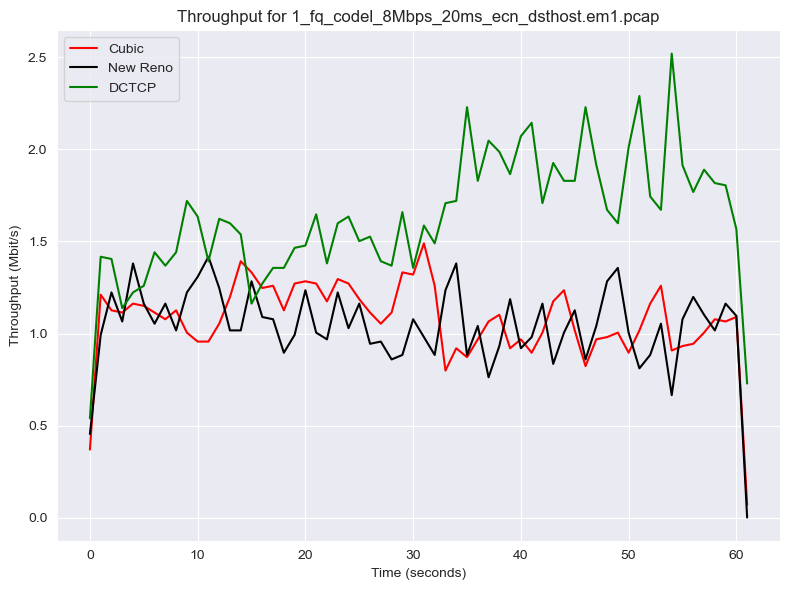

Total throughput for 1_fq_codel_8Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 11963188, 5102: 6438800, 5103: 13049387}
Directory already exists: ./Data\Graphs


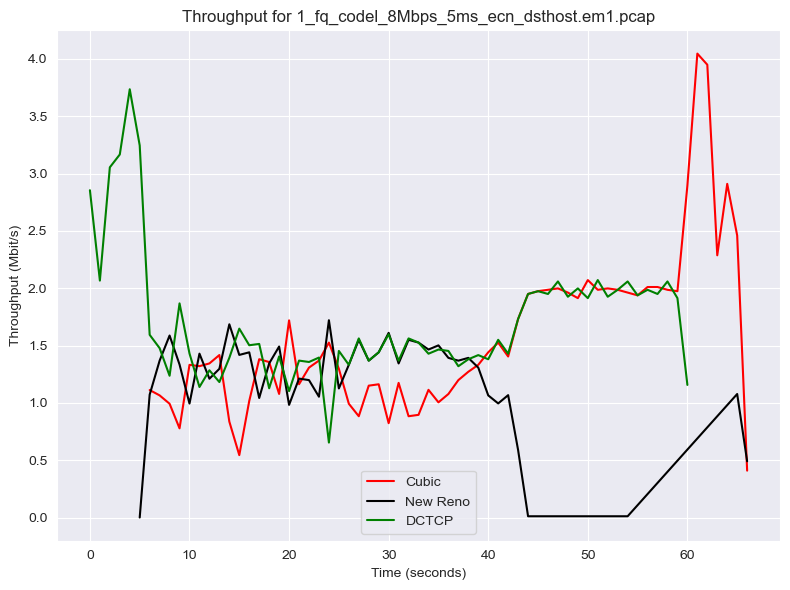

Total throughput for 1_fq_codel_8Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 11176204, 5102: 9916669, 5103: 11249970}
Directory already exists: ./Data\Graphs


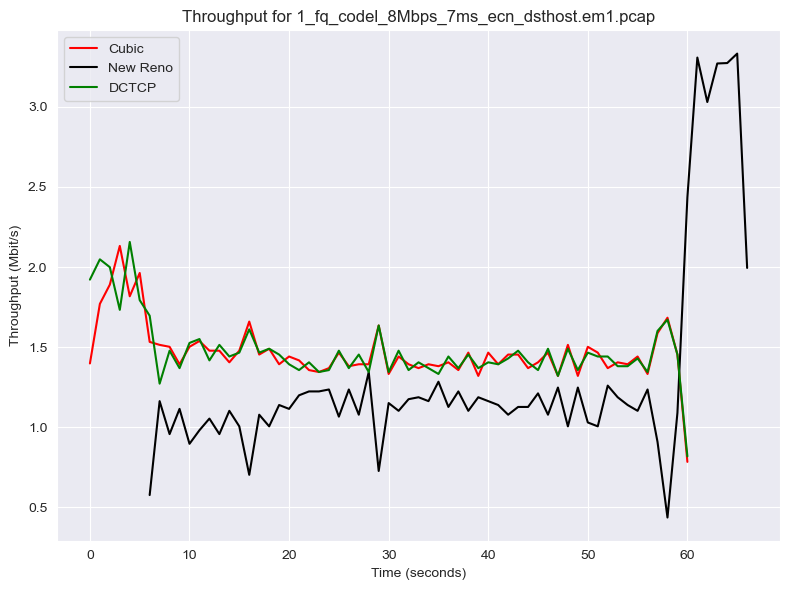

Total throughput for 1_fq_pie_10Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 6662686, 5102: 6458244, 5103: 6751059}
Directory already exists: ./Data\Graphs


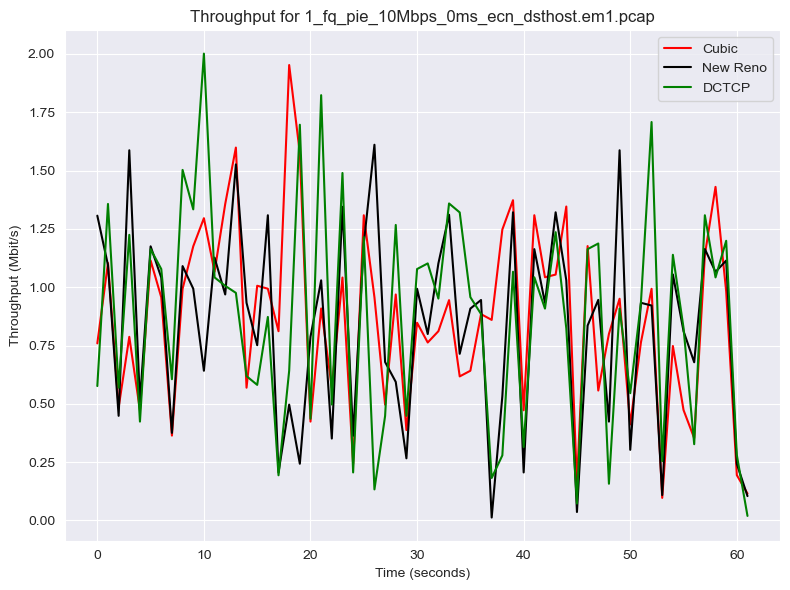

Total throughput for 1_fq_pie_10Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 12735860, 5102: 7200423, 5103: 6219734}
Directory already exists: ./Data\Graphs


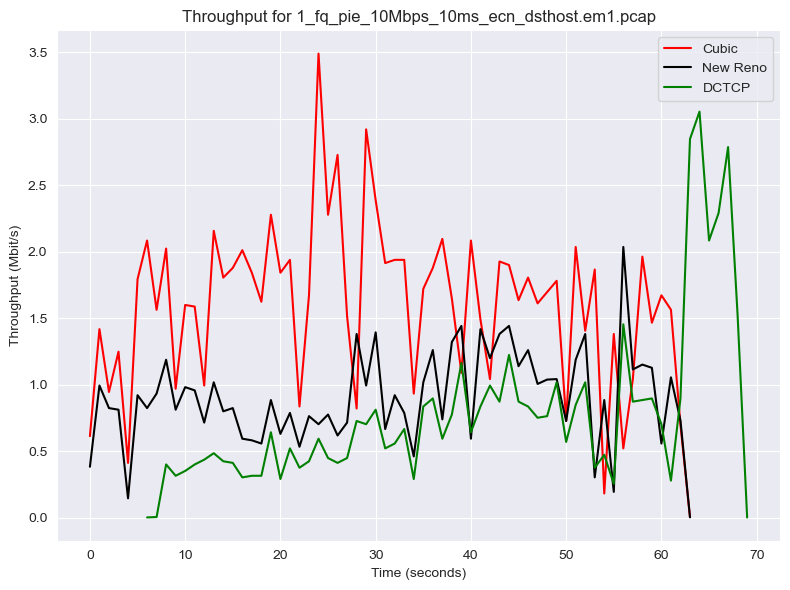

Total throughput for 1_fq_pie_10Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 6784244, 5102: 6639685, 5103: 8161984}
Directory already exists: ./Data\Graphs


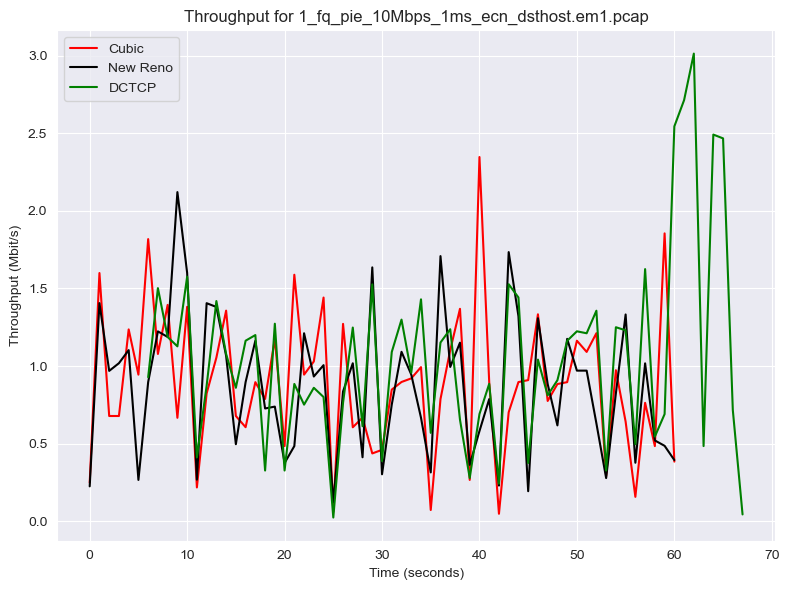

Total throughput for 1_fq_pie_10Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 9954283, 5102: 5635758, 5103: 5147505}
Directory already exists: ./Data\Graphs


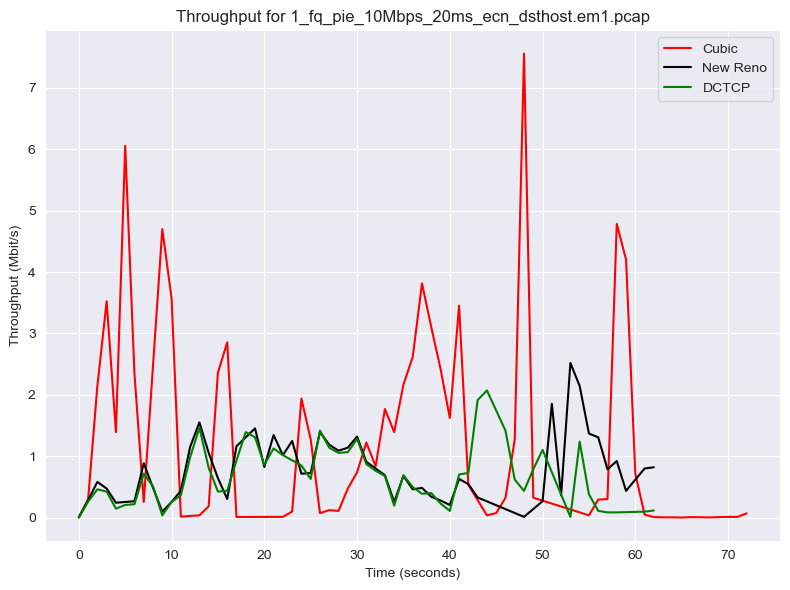

Total throughput for 1_fq_pie_10Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 8334250, 5102: 6937519, 5103: 8176149}
Directory already exists: ./Data\Graphs


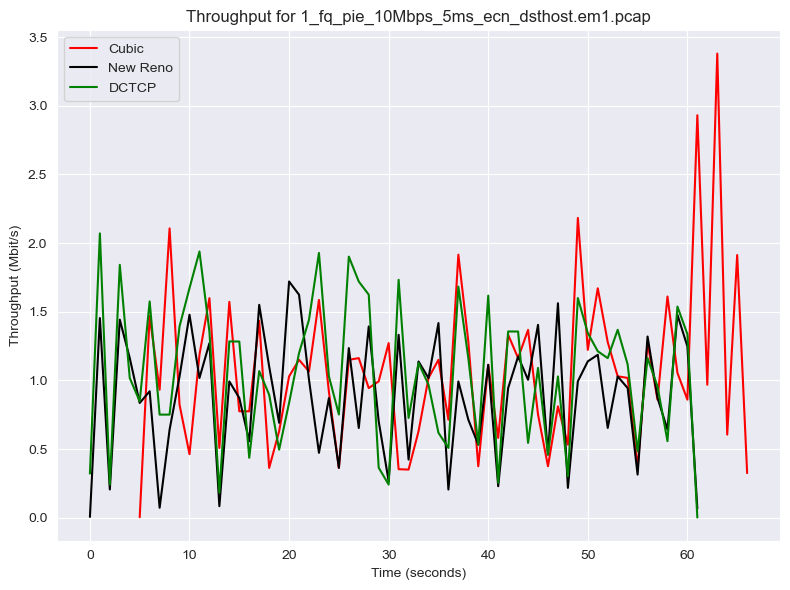

Total throughput for 1_fq_pie_10Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 7510055, 5102: 6569629, 5103: 7235005}
Directory already exists: ./Data\Graphs


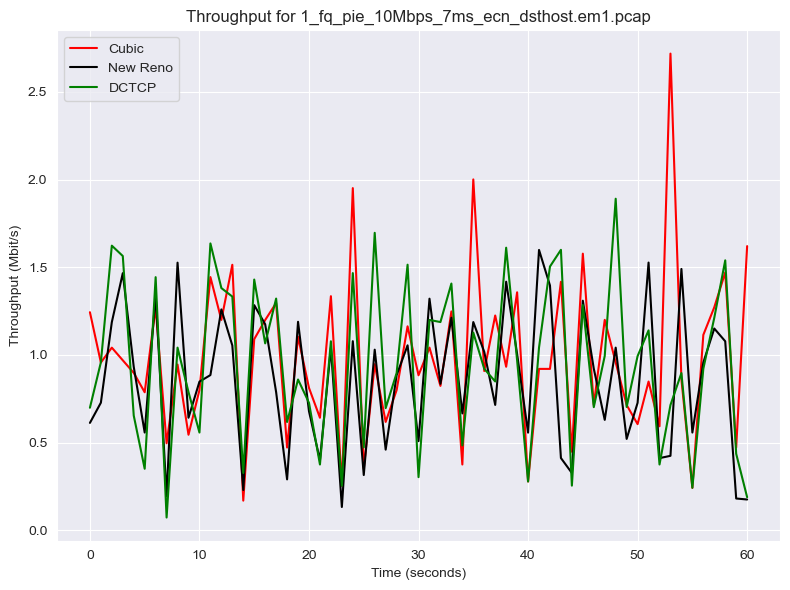

Total throughput for 1_fq_pie_20Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 8232472, 5102: 7908824, 5103: 8803835}
Directory already exists: ./Data\Graphs


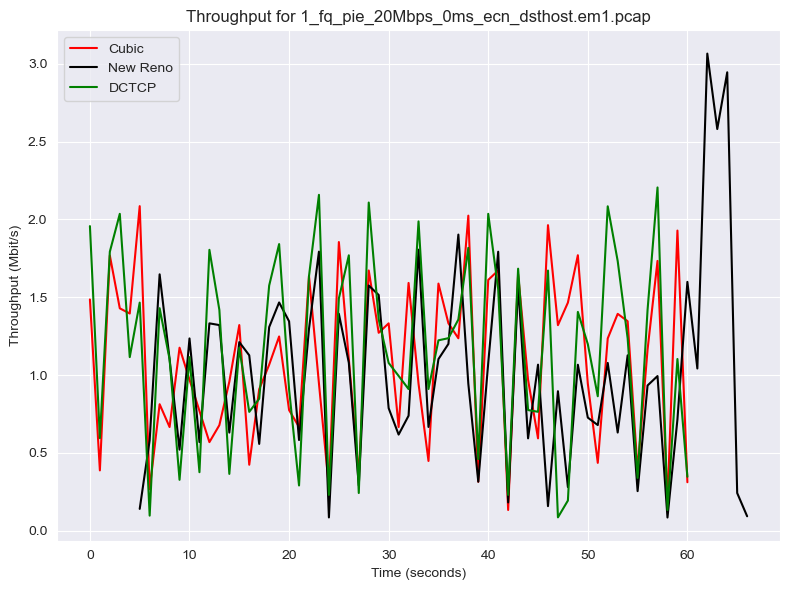

Total throughput for 1_fq_pie_20Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 5836003, 5102: 6653468, 5103: 8295361}
Directory already exists: ./Data\Graphs


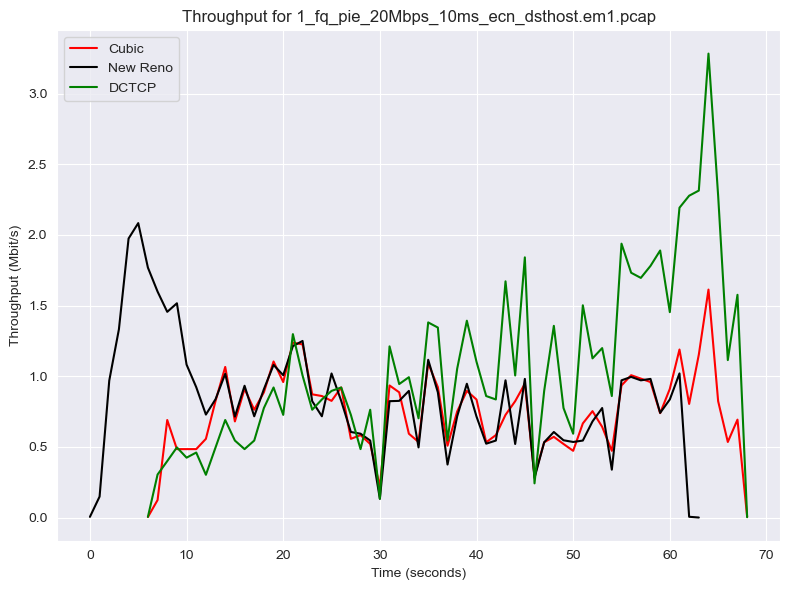

Total throughput for 1_fq_pie_20Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 7897964, 5102: 6930231, 5103: 8512012}
Directory already exists: ./Data\Graphs


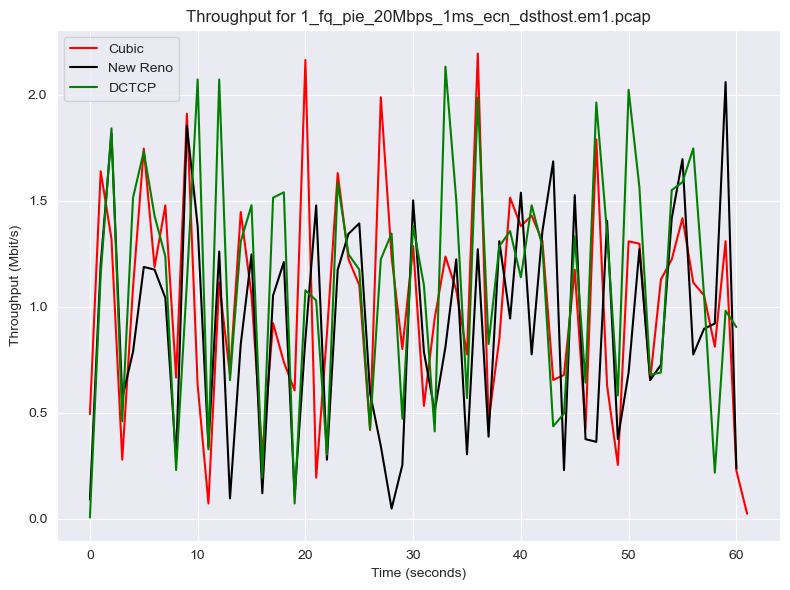

Total throughput for 1_fq_pie_20Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 5637569, 5102: 4435023, 5103: 6352418}
Directory already exists: ./Data\Graphs


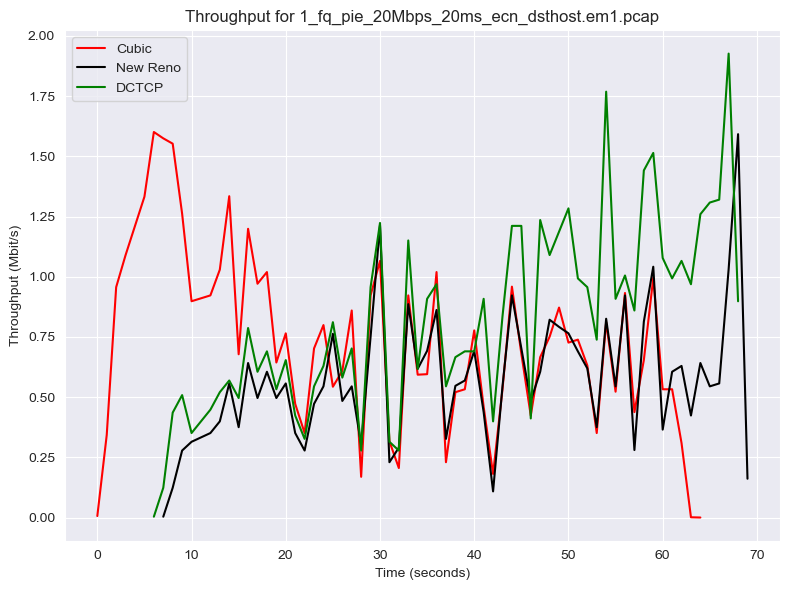

Total throughput for 1_fq_pie_20Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 8430738, 5102: 7378446, 5103: 8579386}
Directory already exists: ./Data\Graphs


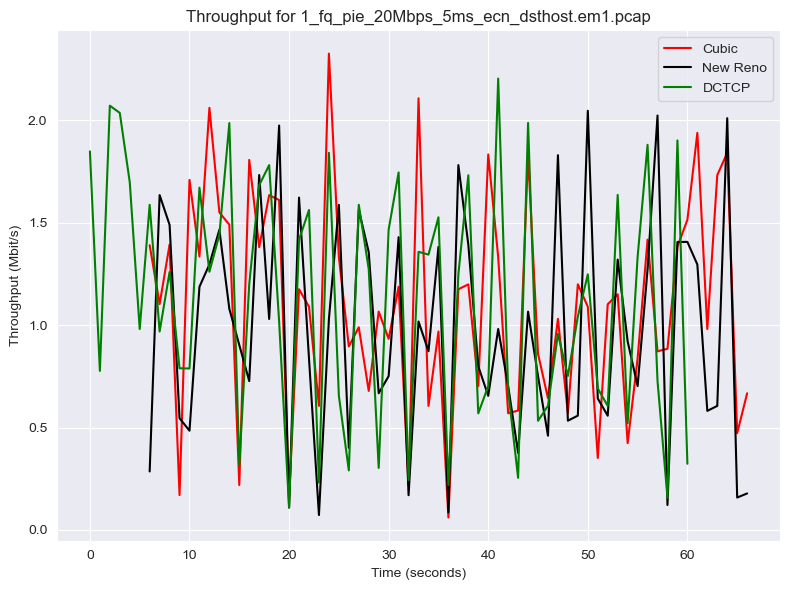

Total throughput for 1_fq_pie_20Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 7632128, 5102: 7251745, 5103: 7824094}
Directory already exists: ./Data\Graphs


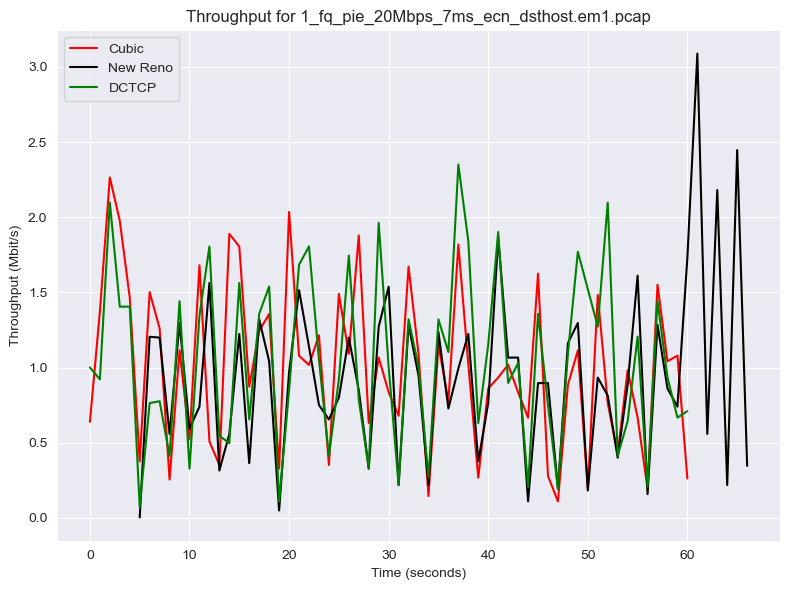

Total throughput for 1_fq_pie_5Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 5372748, 5102: 5298879, 5103: 5245399}
Directory already exists: ./Data\Graphs


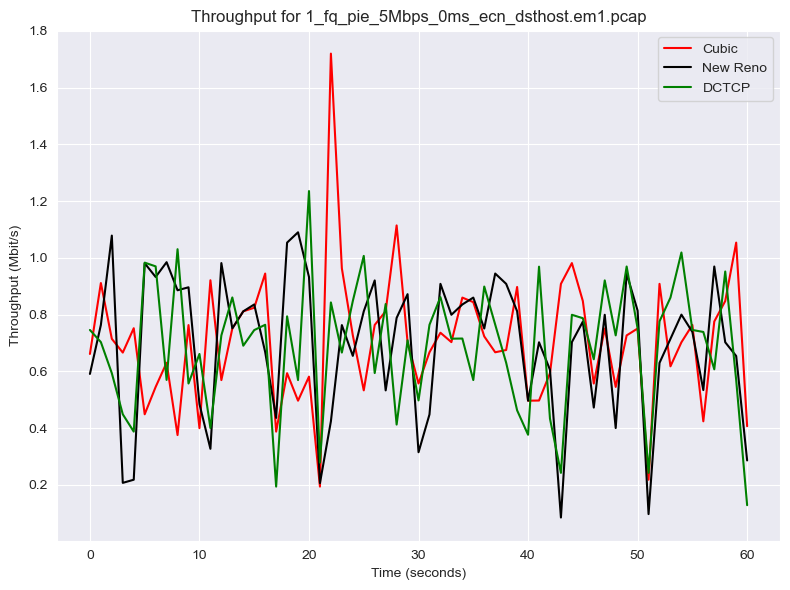

Total throughput for 1_fq_pie_5Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 6917628, 5102: 5189849, 5103: 5133363}
Directory already exists: ./Data\Graphs


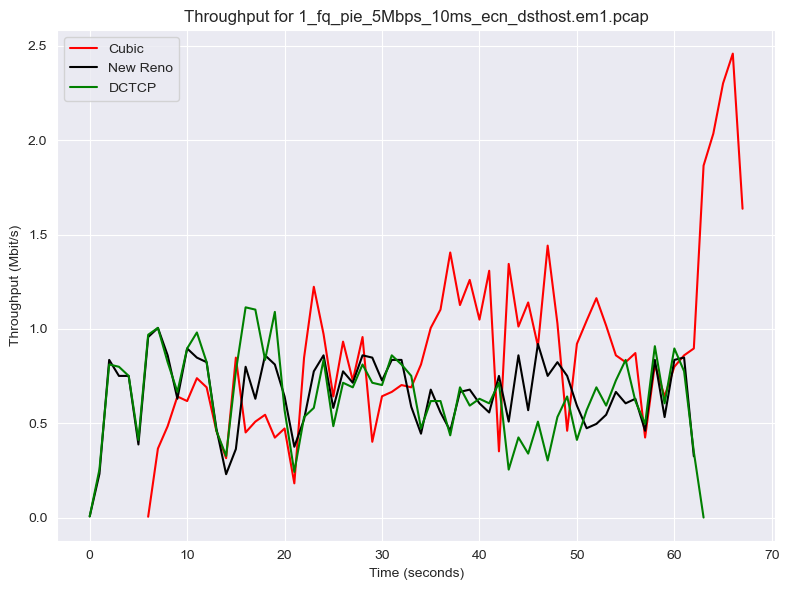

Total throughput for 1_fq_pie_5Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 5887520, 5102: 5136726, 5103: 4881683}
Directory already exists: ./Data\Graphs


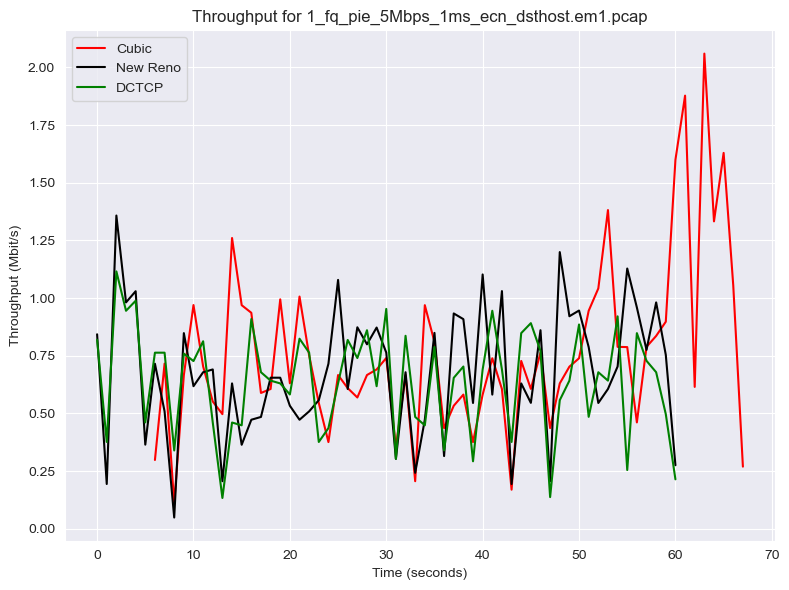

Total throughput for 1_fq_pie_5Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 6263227, 5102: 4676456, 5103: 4850074}
Directory already exists: ./Data\Graphs


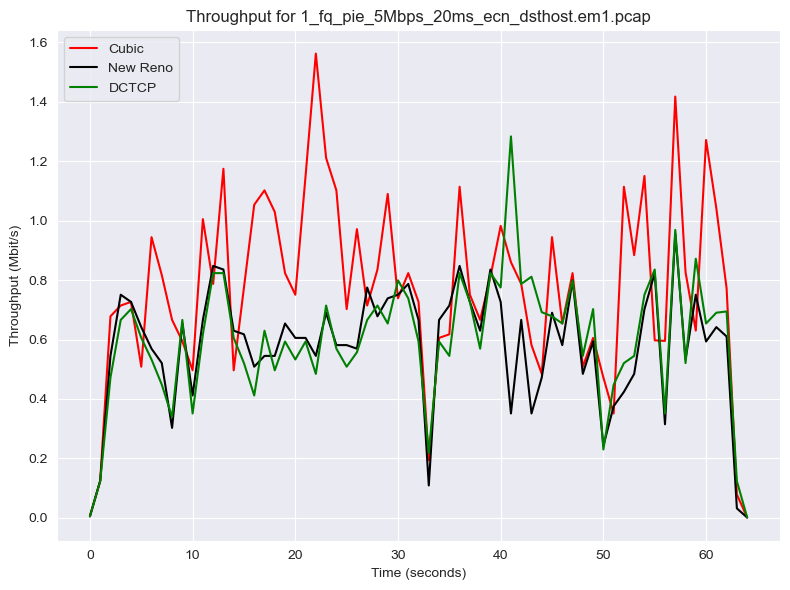

Total throughput for 1_fq_pie_5Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 4859289, 5102: 4046274, 5103: 4860263}
Directory already exists: ./Data\Graphs


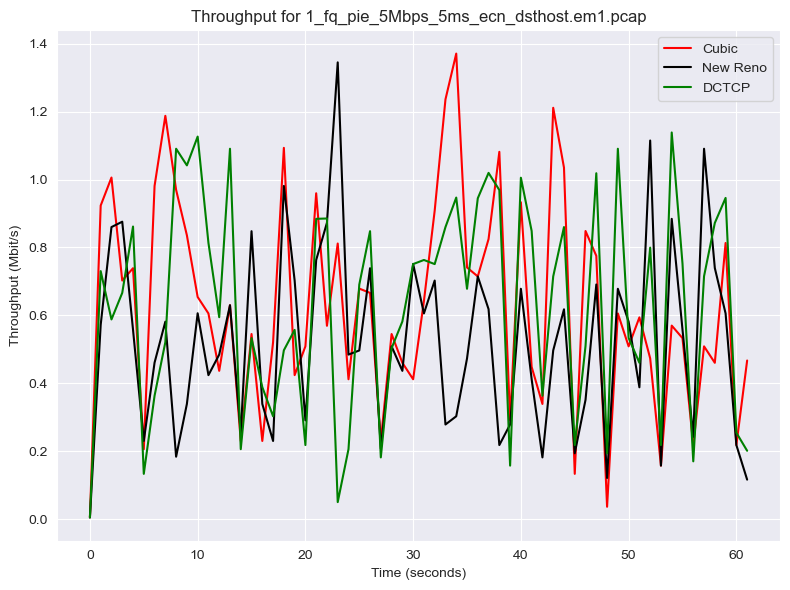

Total throughput for 1_fq_pie_5Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 5437881, 5102: 5015070, 5103: 5540817}
Directory already exists: ./Data\Graphs


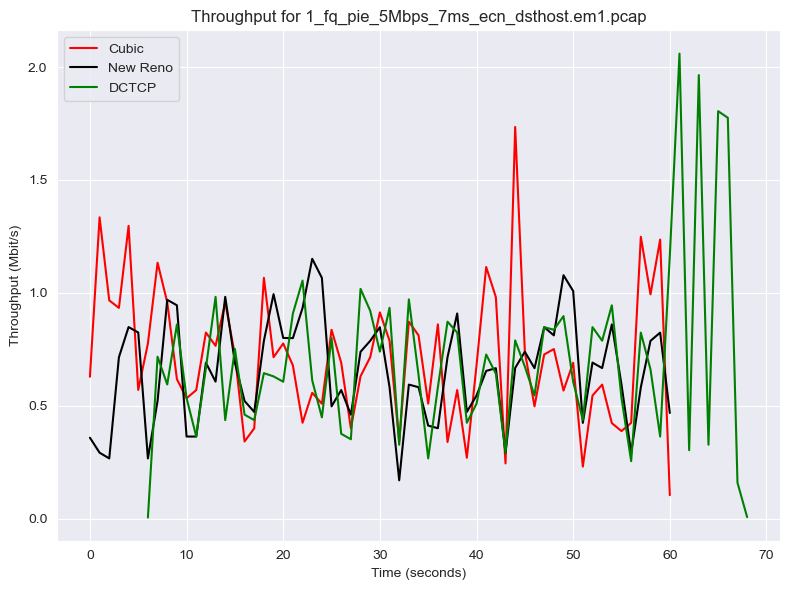

Total throughput for 1_fq_pie_8Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 7017805, 5102: 6272183, 5103: 7335399}
Directory already exists: ./Data\Graphs


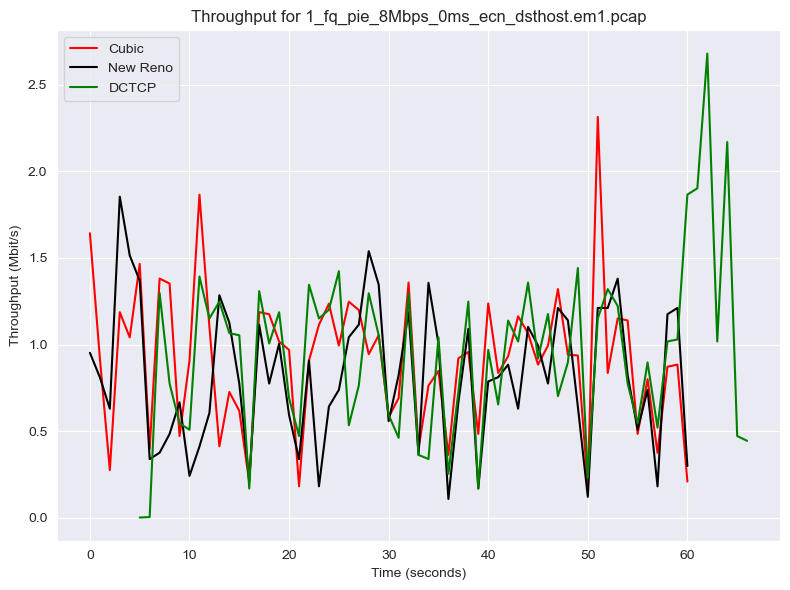

Total throughput for 1_fq_pie_8Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 8620724, 5102: 5101913, 5103: 4687199}
Directory already exists: ./Data\Graphs


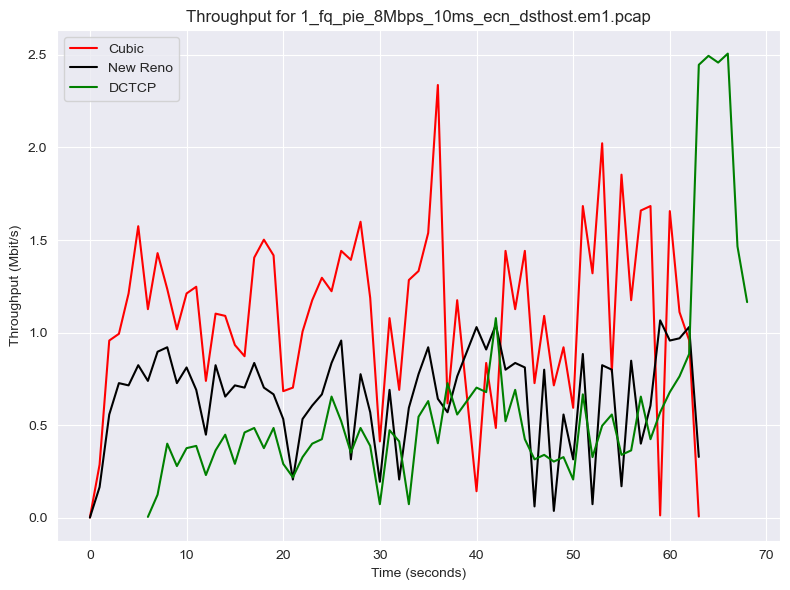

Total throughput for 1_fq_pie_8Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 5973289, 5102: 5533069, 5103: 6129506}
Directory already exists: ./Data\Graphs


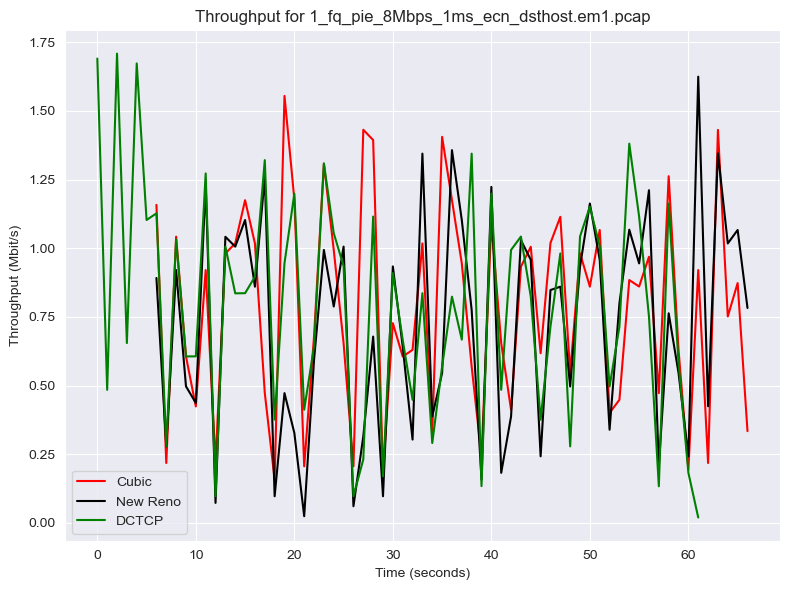

Total throughput for 1_fq_pie_8Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 10149121, 5102: 6139079, 5103: 4692151}
Directory already exists: ./Data\Graphs


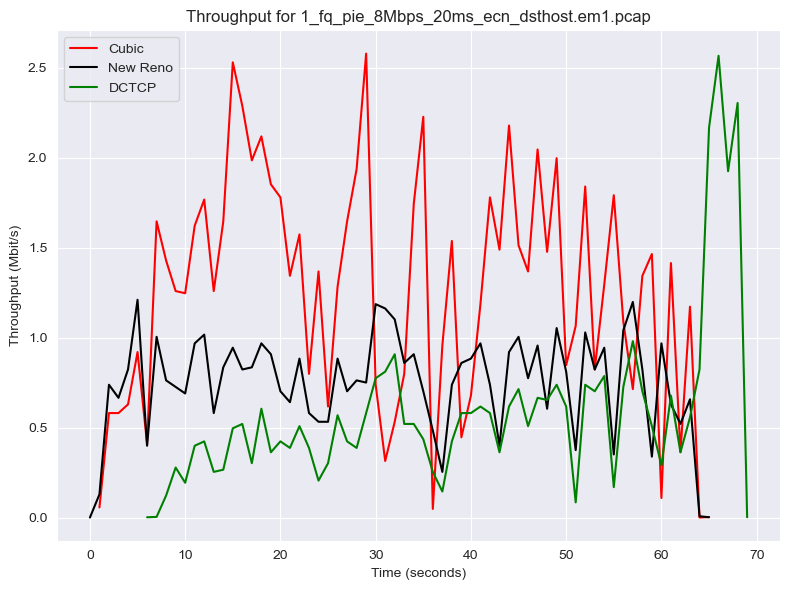

Total throughput for 1_fq_pie_8Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 6197959, 5102: 5550876, 5103: 6615910}
Directory already exists: ./Data\Graphs


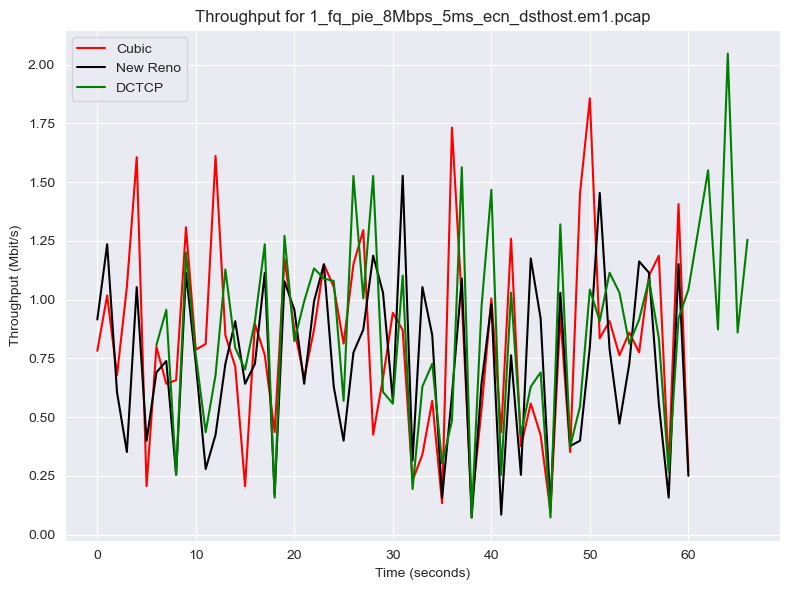

Total throughput for 1_fq_pie_8Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 5730510, 5102: 6363335, 5103: 6115700}
Directory already exists: ./Data\Graphs


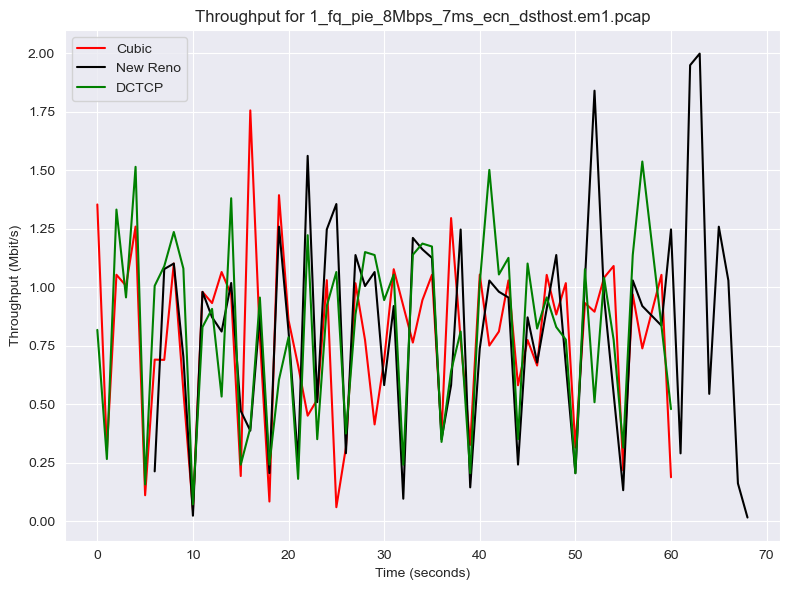

Total throughput for 1_l4s_10Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 5582897, 5102: 5341290, 5103: 9082922}
Directory already exists: ./Data\Graphs


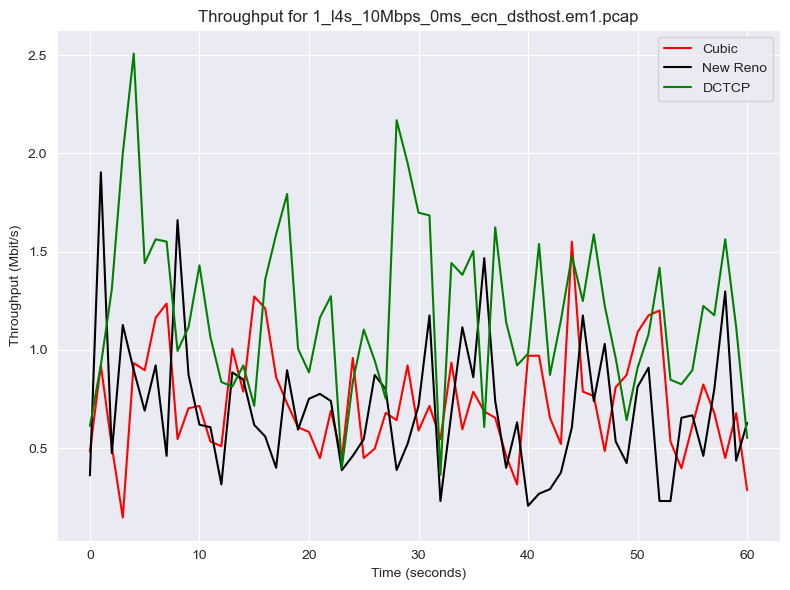

Total throughput for 1_l4s_10Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 12043623, 5102: 4082940, 5103: 4825425}
Directory already exists: ./Data\Graphs


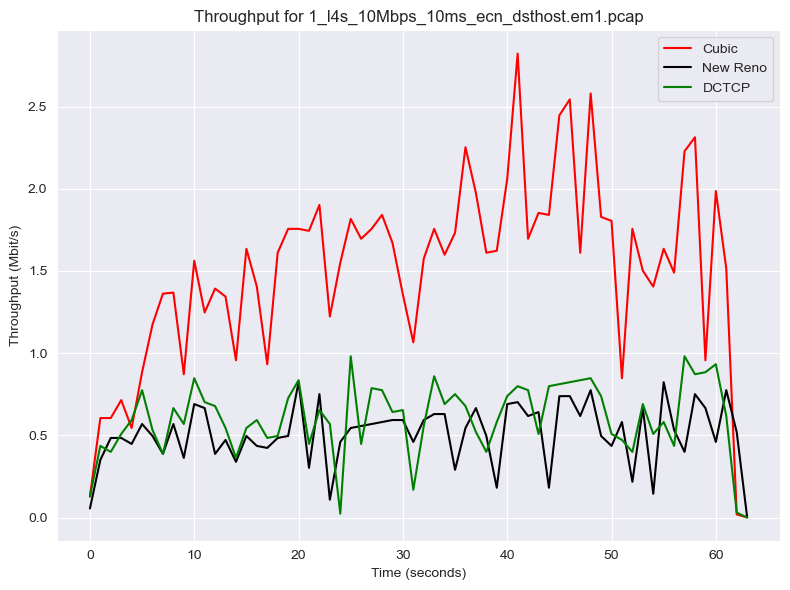

Total throughput for 1_l4s_10Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 5980400, 5102: 5522474, 5103: 9009526}
Directory already exists: ./Data\Graphs


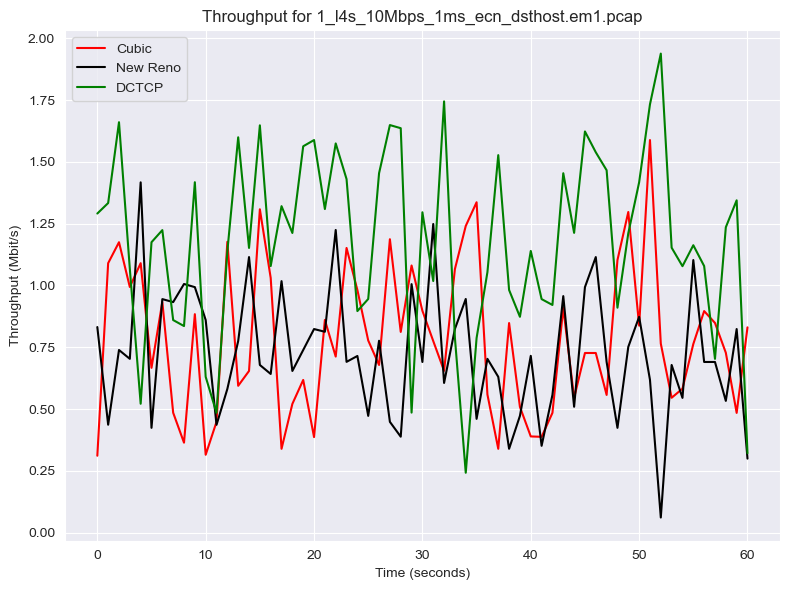

Total throughput for 1_l4s_10Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 12126032, 5102: 3652208, 5103: 5640457}
Directory already exists: ./Data\Graphs


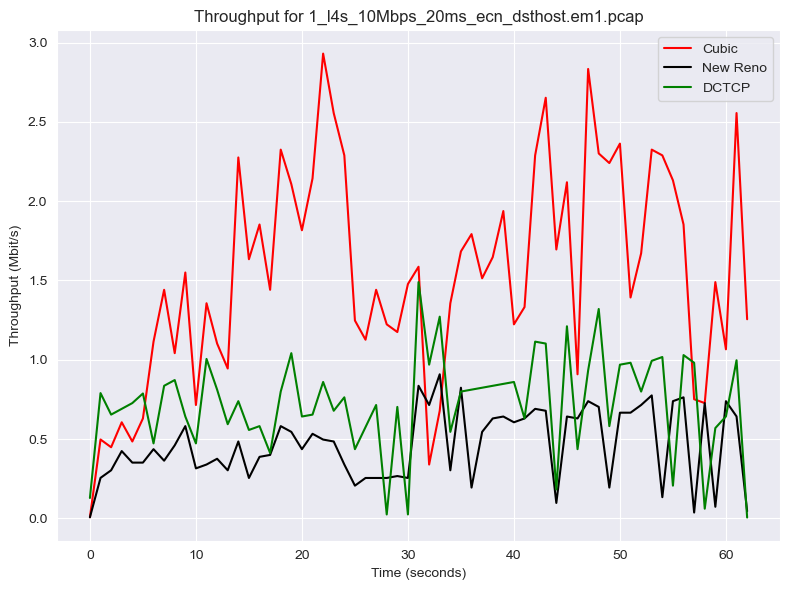

Total throughput for 1_l4s_10Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 5511135, 5102: 6754985, 5103: 8446380}
Directory already exists: ./Data\Graphs


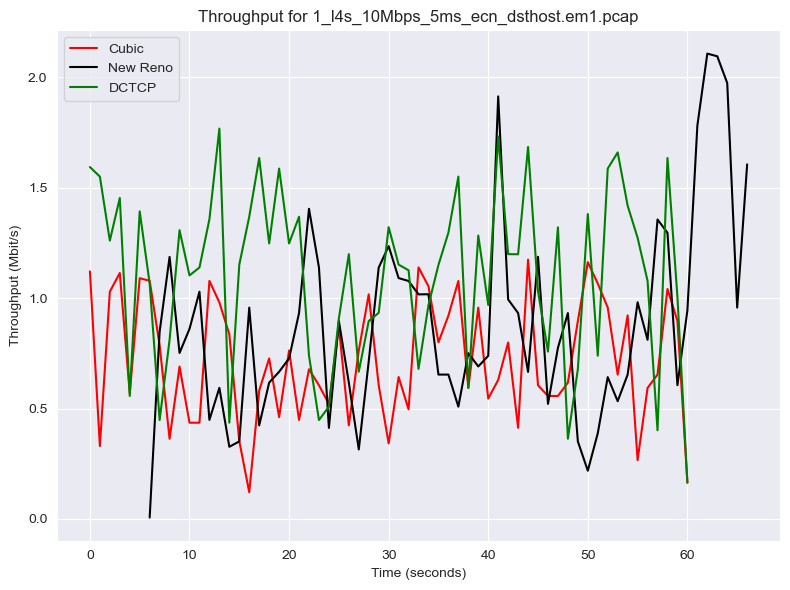

Total throughput for 1_l4s_10Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 5002592, 5102: 5691941, 5103: 8909294}
Directory already exists: ./Data\Graphs


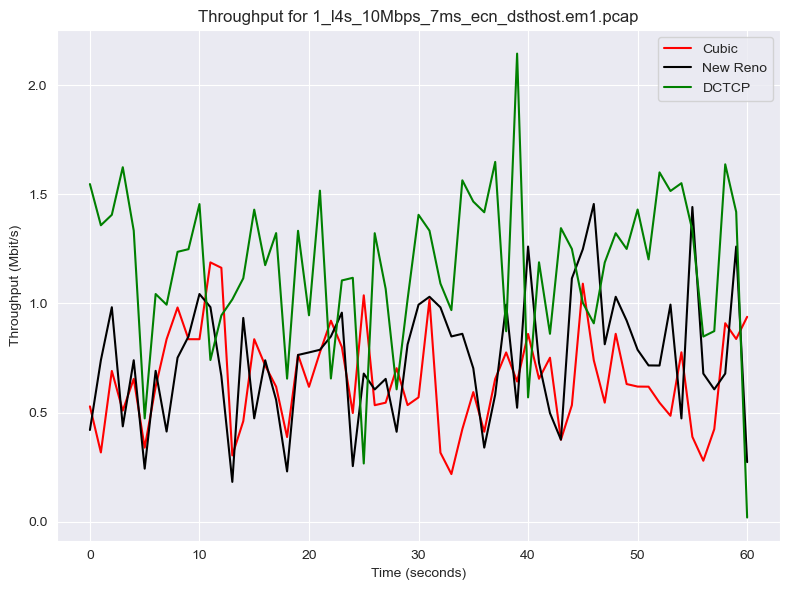

Total throughput for 1_l4s_20Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 7945339, 5102: 7998647, 5103: 11845790}
Directory already exists: ./Data\Graphs


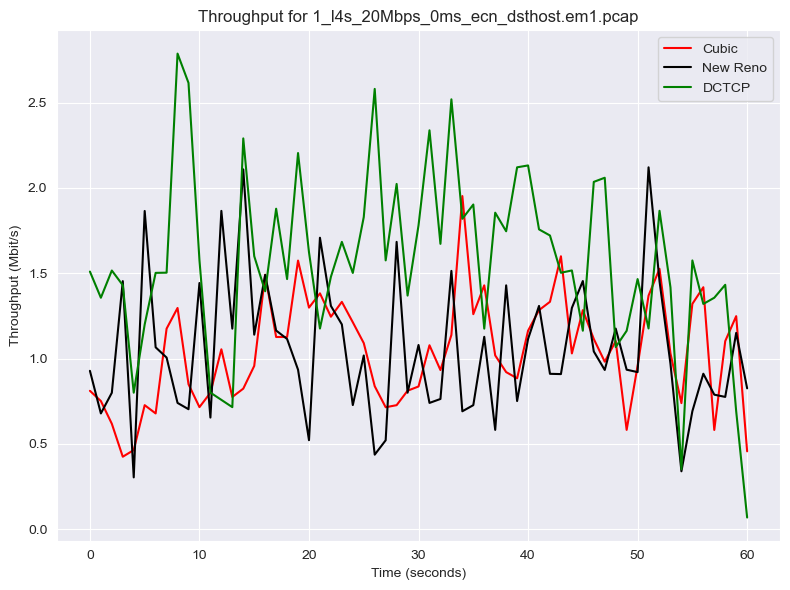

Total throughput for 1_l4s_20Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 19512909, 5102: 4825625, 5103: 7479217}
Directory already exists: ./Data\Graphs


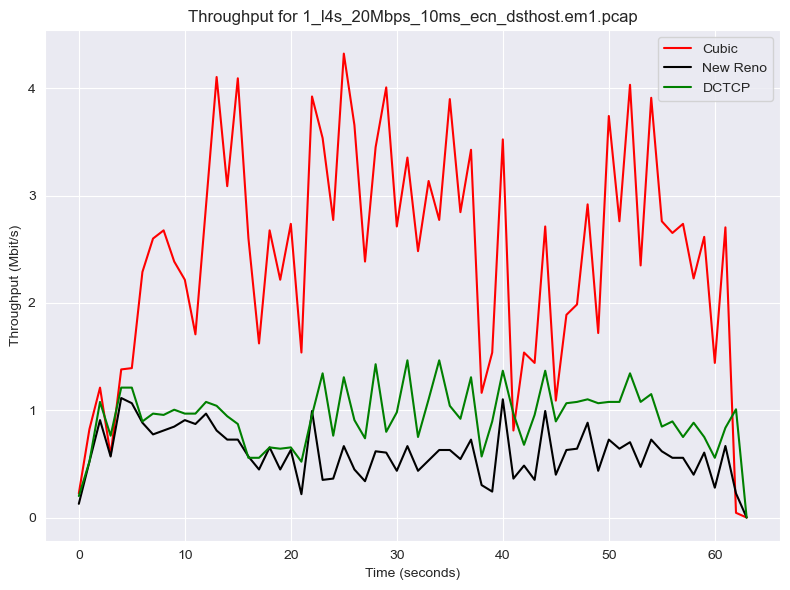

Total throughput for 1_l4s_20Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 7722744, 5102: 8907704, 5103: 12637093}
Directory already exists: ./Data\Graphs


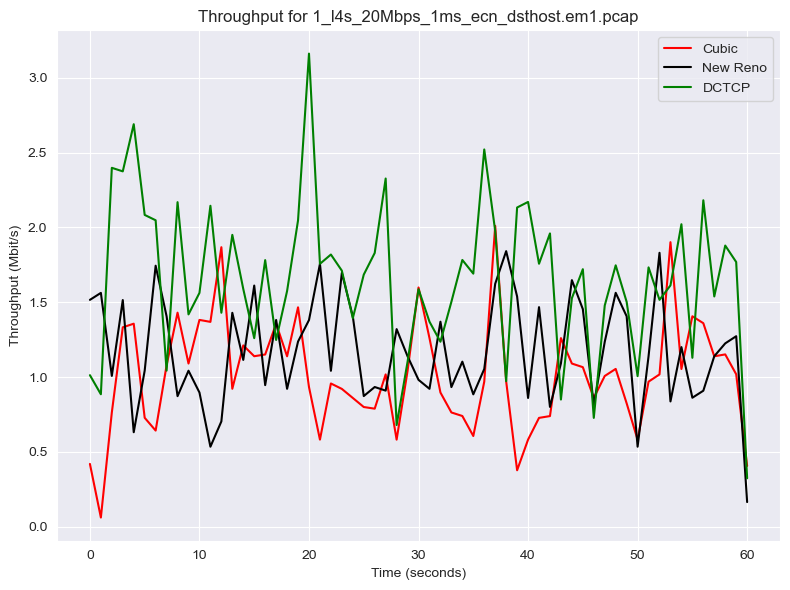

Total throughput for 1_l4s_20Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 30596744, 5102: 9772473, 5103: 4556344}
Directory already exists: ./Data\Graphs


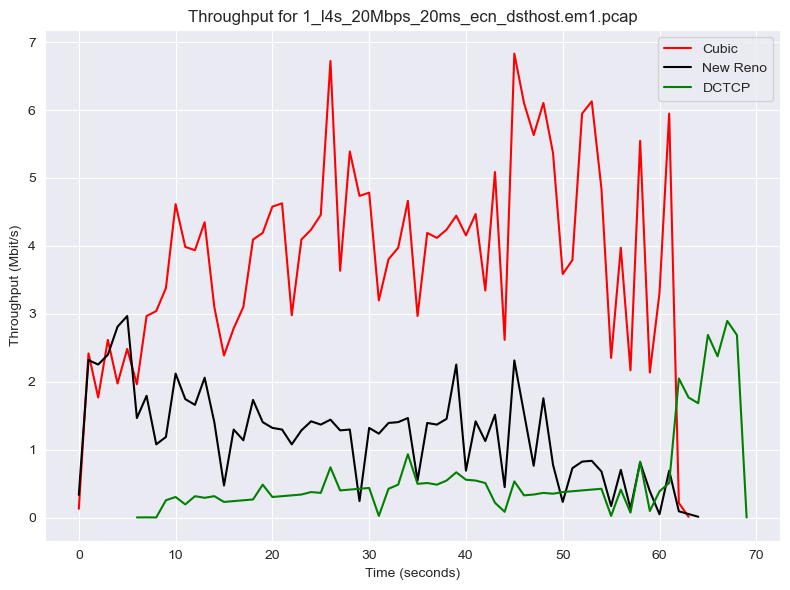

Total throughput for 1_l4s_20Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 8506358, 5102: 8107887, 5103: 12170754}
Directory already exists: ./Data\Graphs


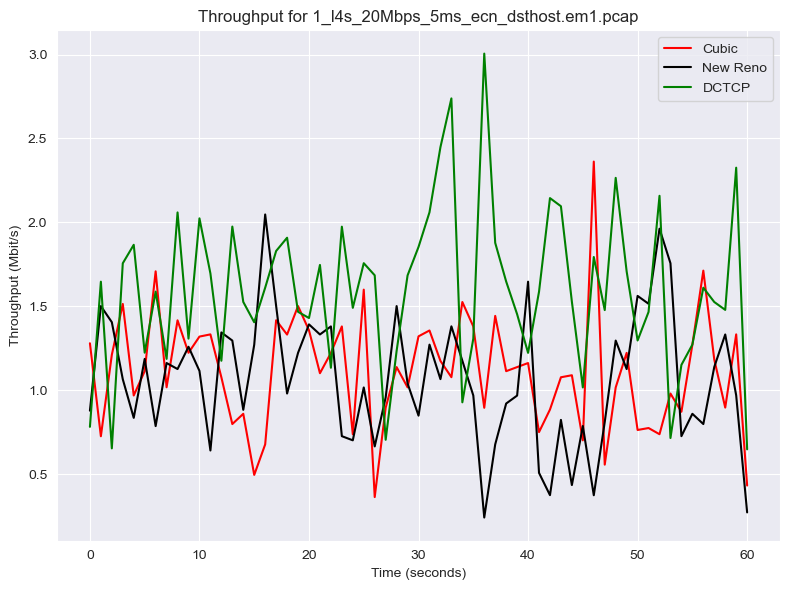

Total throughput for 1_l4s_20Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 7490916, 5102: 6978332, 5103: 11164487}
Directory already exists: ./Data\Graphs


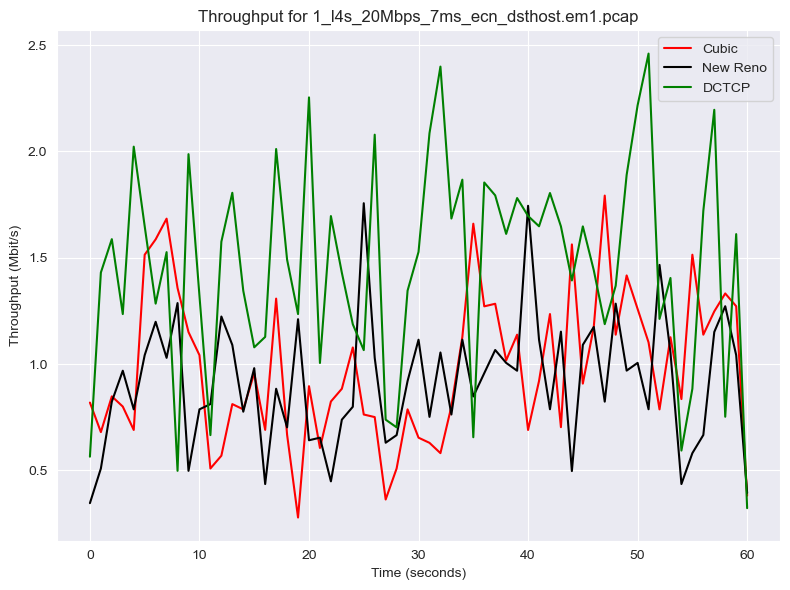

Total throughput for 1_l4s_5Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 3915214, 5102: 3759842, 5103: 5789819}
Directory already exists: ./Data\Graphs


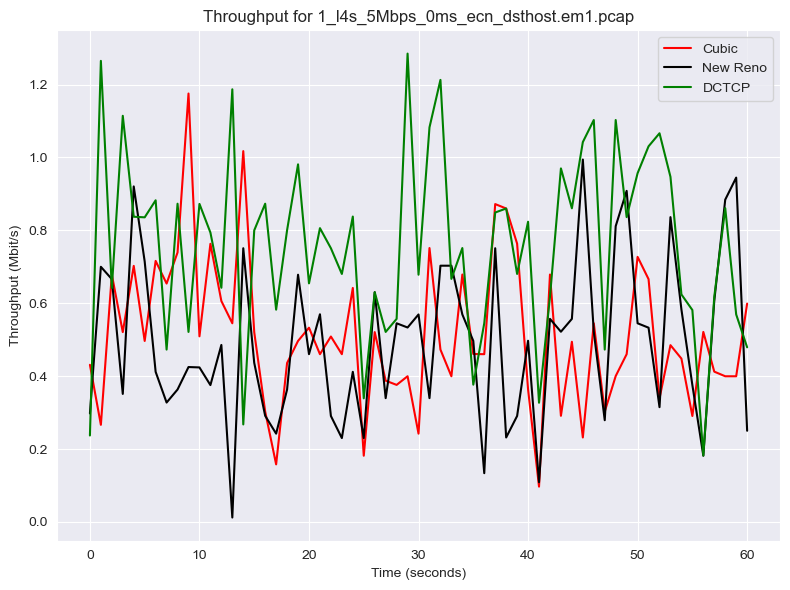

Total throughput for 1_l4s_5Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 5861414, 5102: 3102608, 5103: 4547914}
Directory already exists: ./Data\Graphs


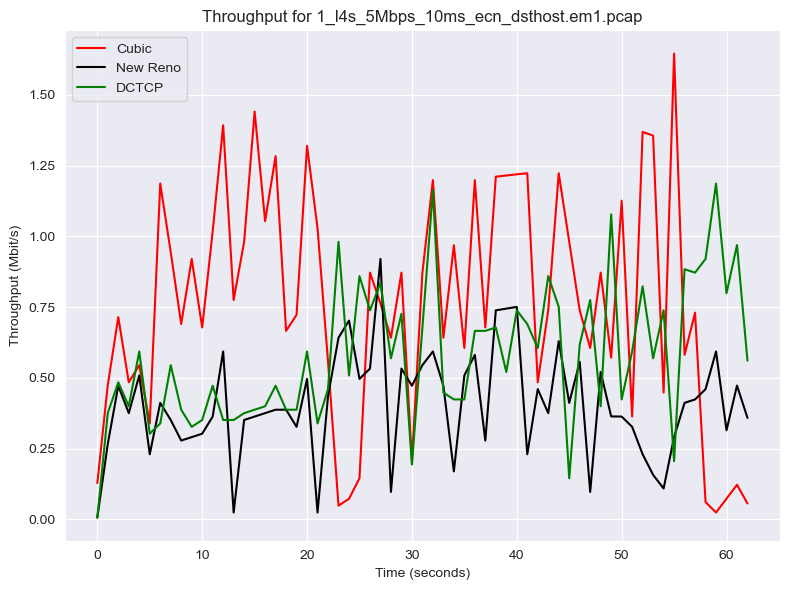

Total throughput for 1_l4s_5Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 3447305, 5102: 3015858, 5103: 4857369}
Directory already exists: ./Data\Graphs


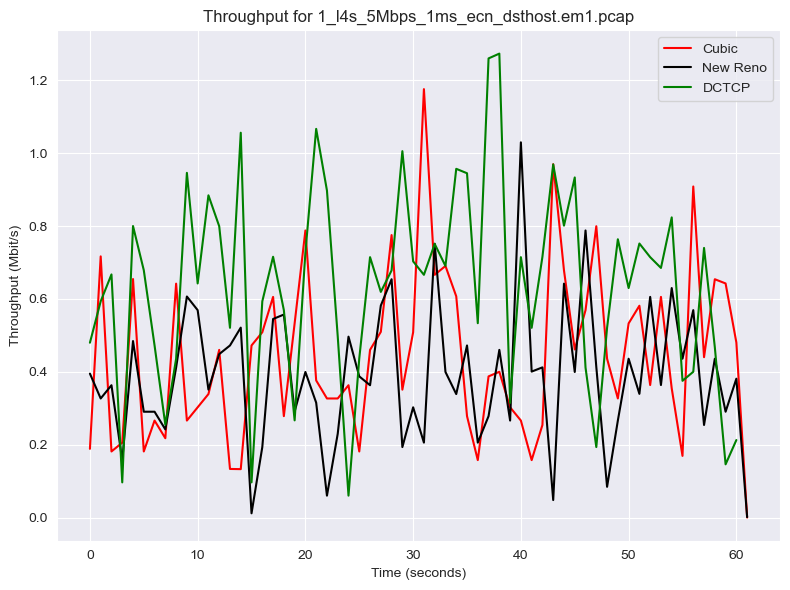

Total throughput for 1_l4s_5Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 7983291, 5102: 3137466, 5103: 4300978}
Directory already exists: ./Data\Graphs


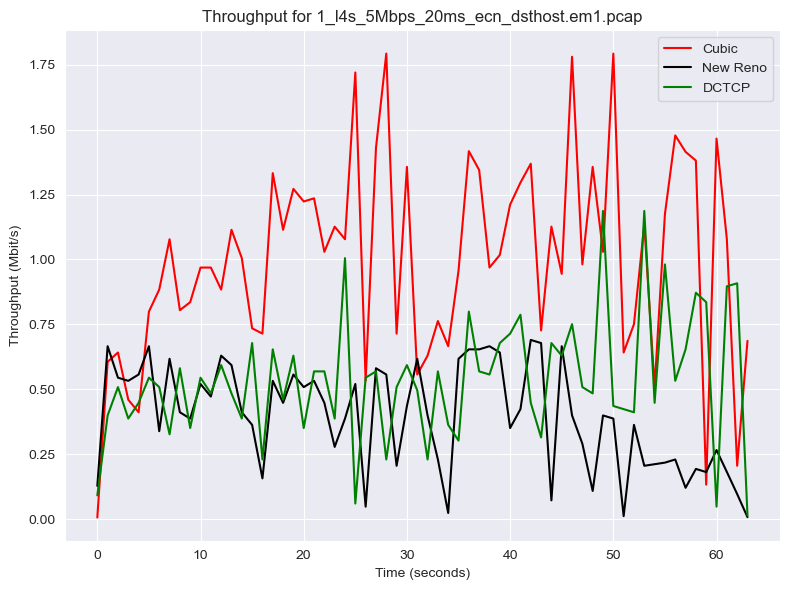

Total throughput for 1_l4s_5Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 3768933, 5102: 3786028, 5103: 6074020}
Directory already exists: ./Data\Graphs


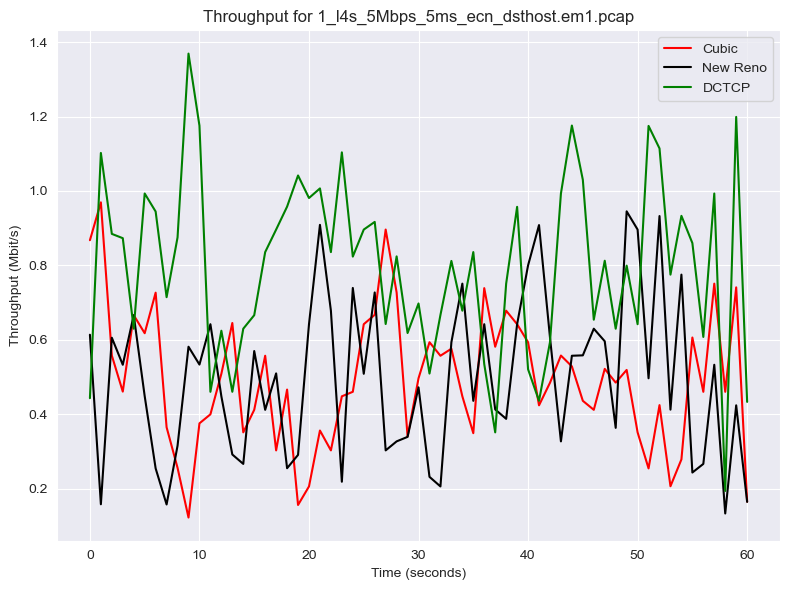

Total throughput for 1_l4s_5Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 5048854, 5102: 3727972, 5103: 5989440}
Directory already exists: ./Data\Graphs


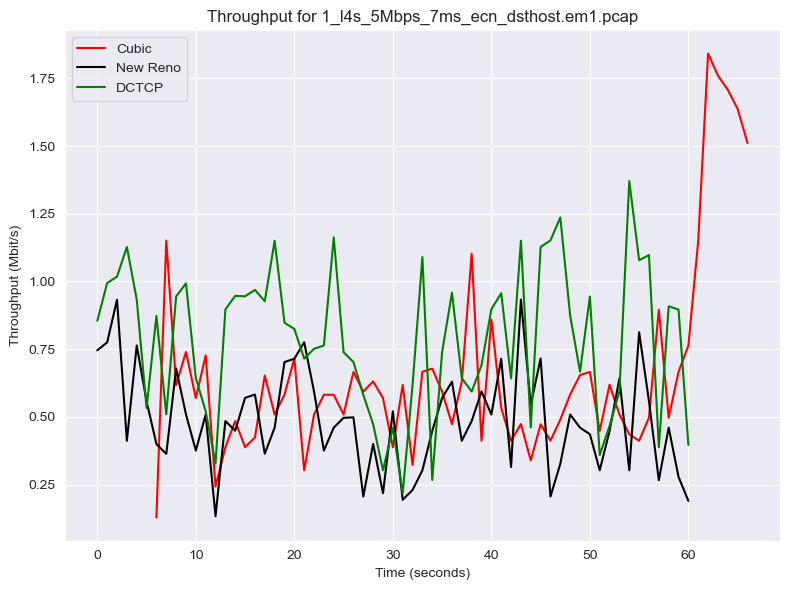

Total throughput for 1_l4s_8Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 5401522, 5102: 5885946, 5103: 8335849}
Directory already exists: ./Data\Graphs


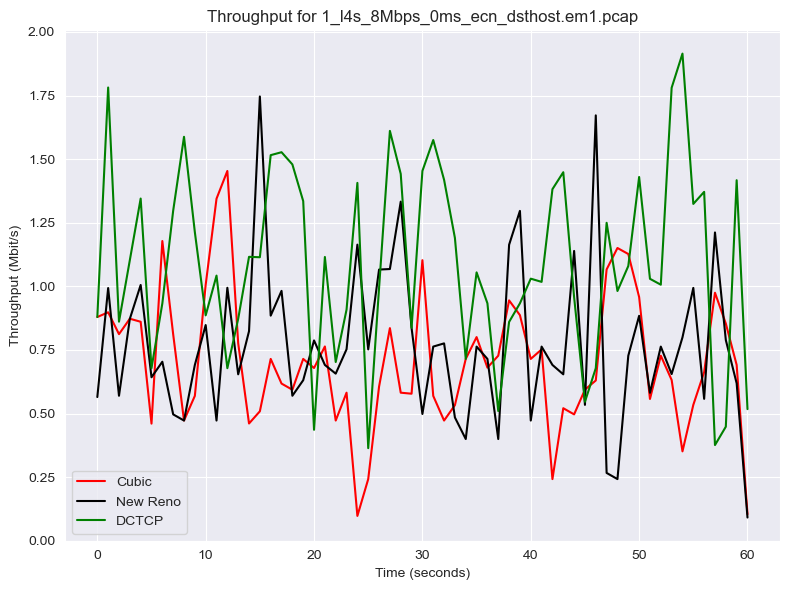

Total throughput for 1_l4s_8Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 10870974, 5102: 5015723, 5103: 5615993}
Directory already exists: ./Data\Graphs


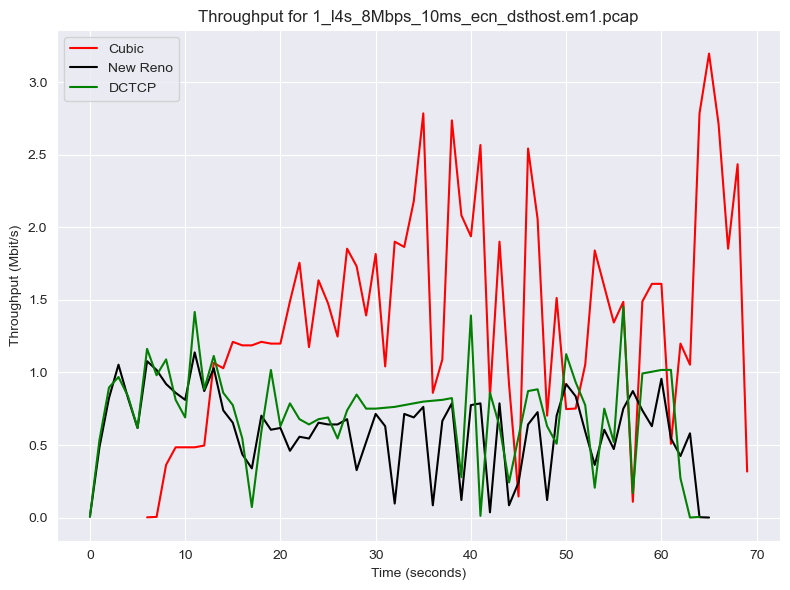

Total throughput for 1_l4s_8Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 5164924, 5102: 5277585, 5103: 8071562}
Directory already exists: ./Data\Graphs


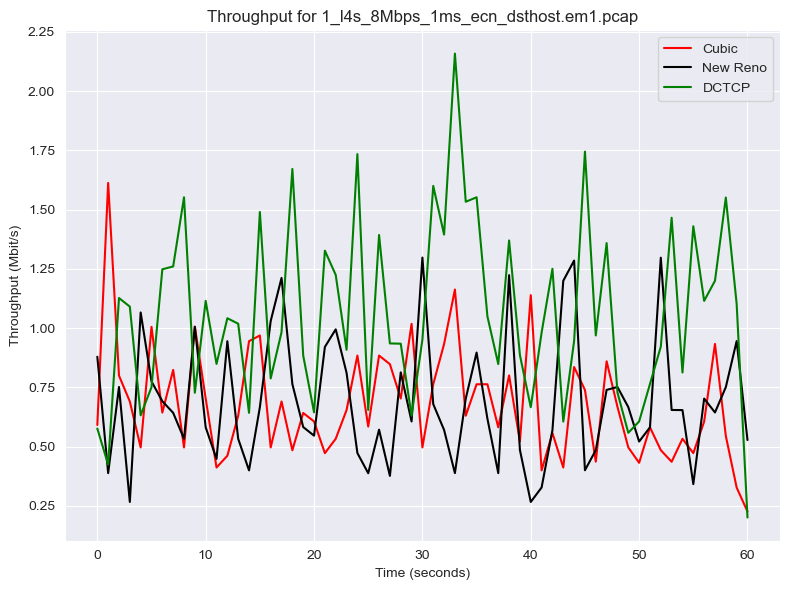

Total throughput for 1_l4s_8Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 13490623, 5102: 3558435, 5103: 4596362}
Directory already exists: ./Data\Graphs


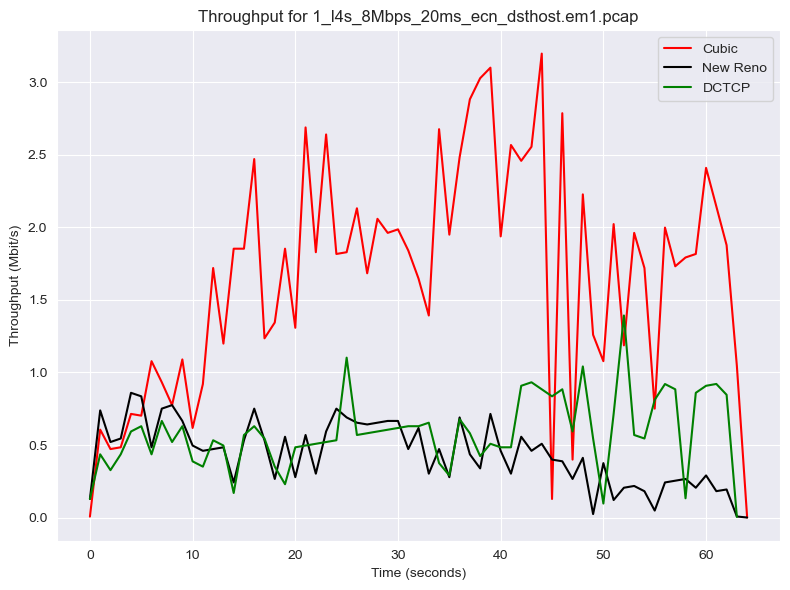

Total throughput for 1_l4s_8Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 5109294, 5102: 5626933, 5103: 7811203}
Directory already exists: ./Data\Graphs


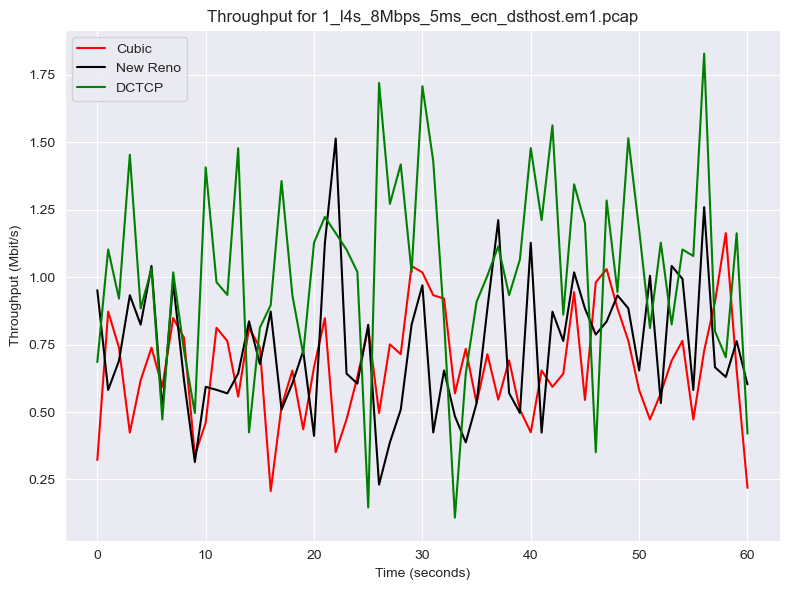

Total throughput for 1_l4s_8Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 5260150, 5102: 5661210, 5103: 8726264}
Directory already exists: ./Data\Graphs


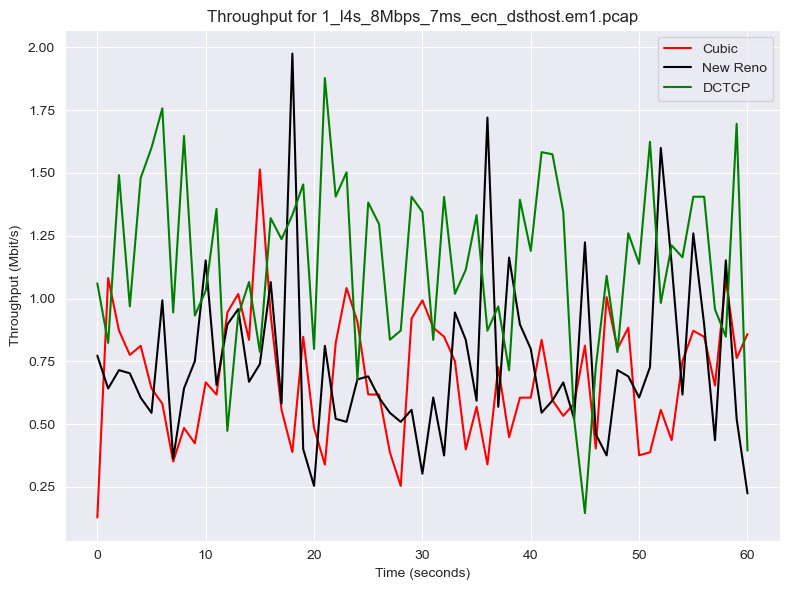

Total throughput for 2_fq_codel_10Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 12259429, 5102: 11233447, 5103: 12901379}
Directory already exists: ./Data\Graphs


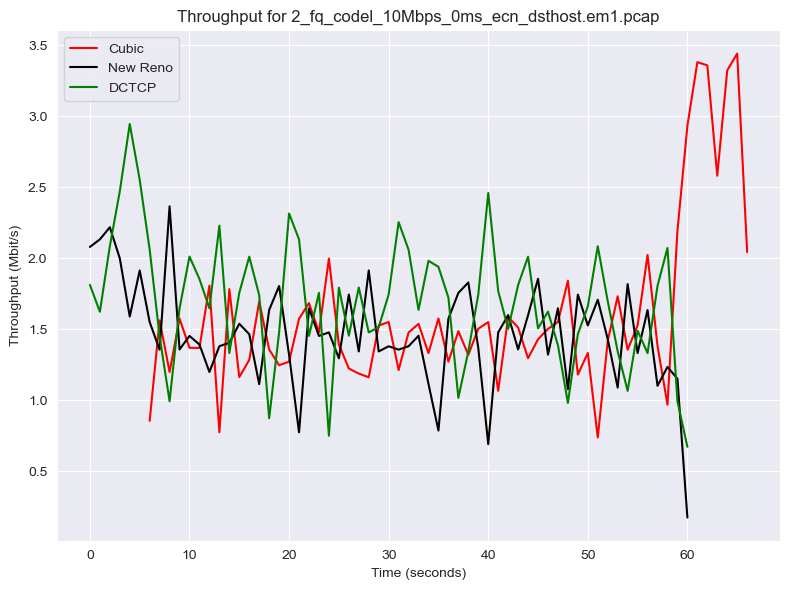

Total throughput for 2_fq_codel_10Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 9446027, 5102: 10983304, 5103: 12826845}
Directory already exists: ./Data\Graphs


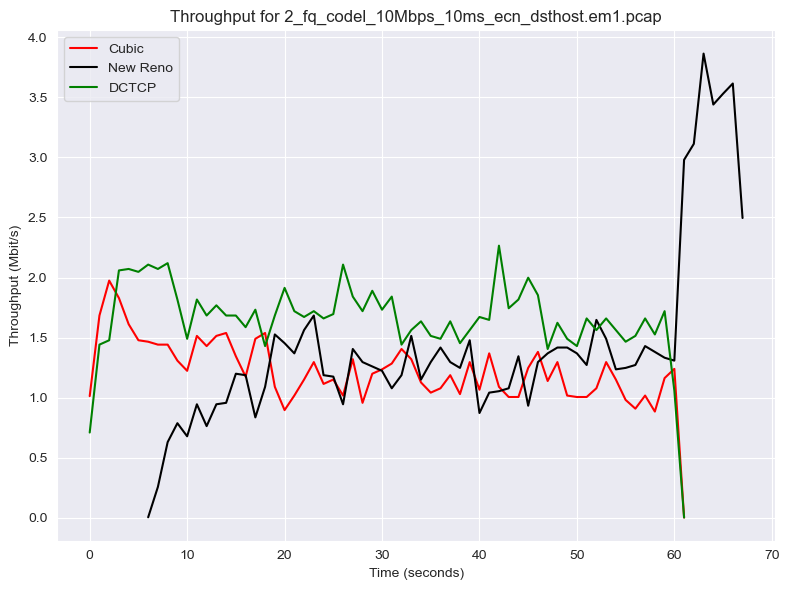

Total throughput for 2_fq_codel_10Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 11420720, 5102: 11201227, 5103: 12910229}
Directory already exists: ./Data\Graphs


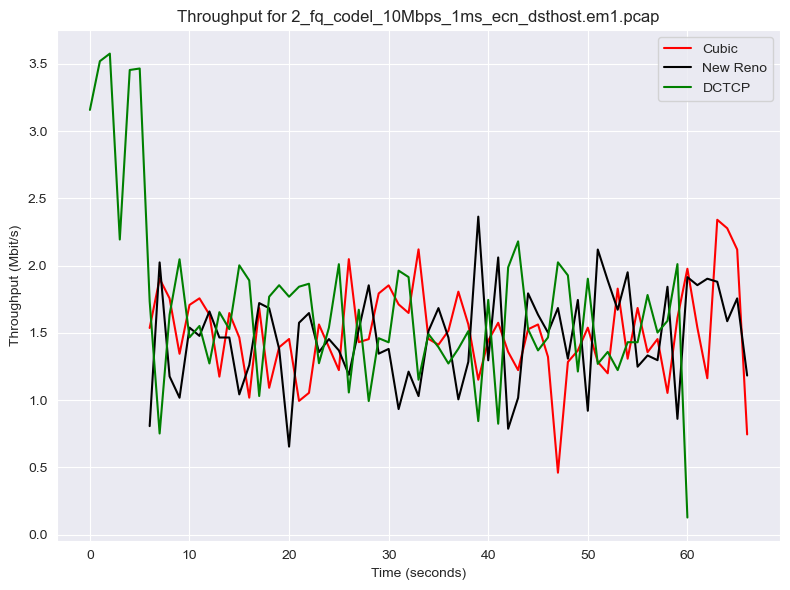

Total throughput for 2_fq_codel_10Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 11441123, 5102: 5695897, 5103: 17397596}
Directory already exists: ./Data\Graphs


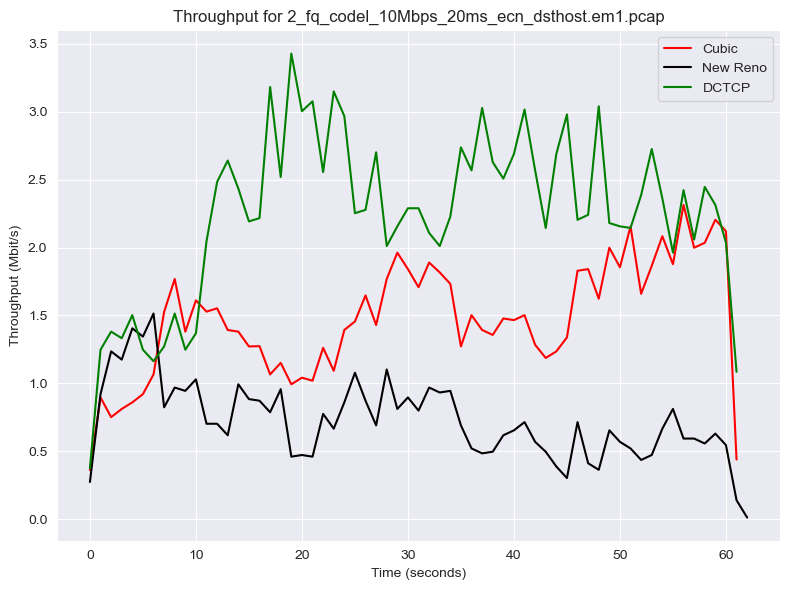

Total throughput for 2_fq_codel_10Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 10398897, 5102: 10820849, 5103: 12216399}
Directory already exists: ./Data\Graphs


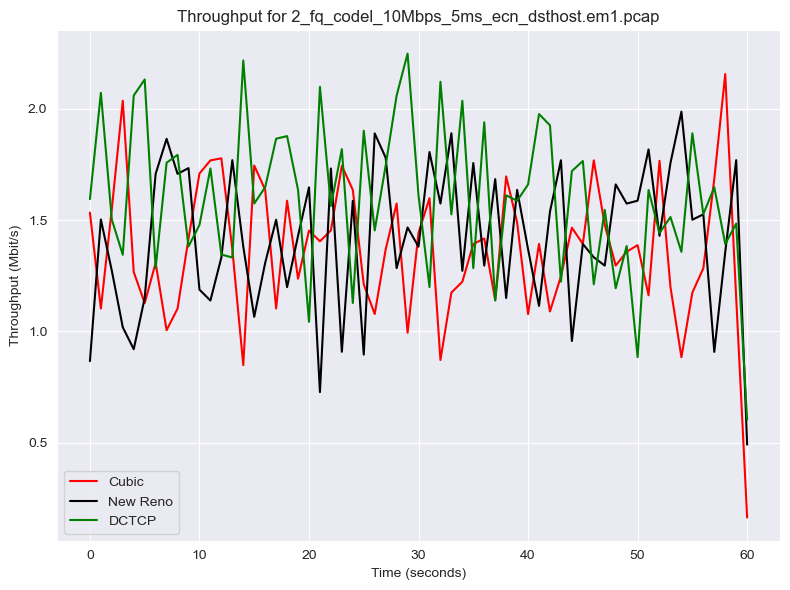

Total throughput for 2_fq_codel_10Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 10488809, 5102: 10656770, 5103: 11618511}
Directory already exists: ./Data\Graphs


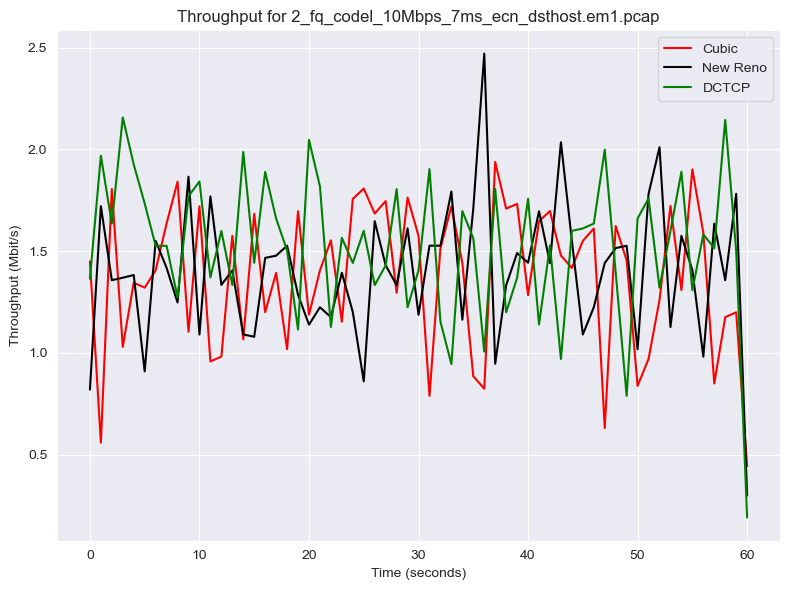

Total throughput for 2_fq_codel_20Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 12707817, 5102: 13494306, 5103: 17668923}
Directory already exists: ./Data\Graphs


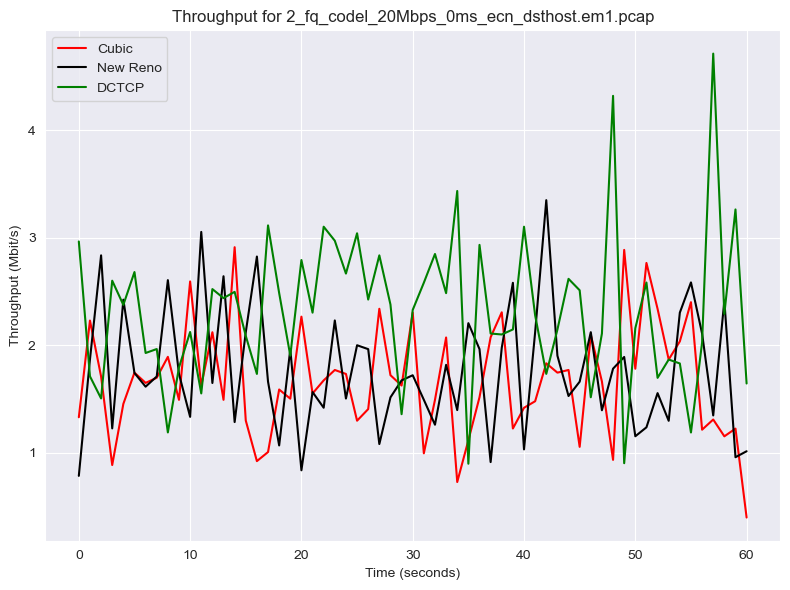

Total throughput for 2_fq_codel_20Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 10400773, 5102: 9069823, 5103: 13649356}
Directory already exists: ./Data\Graphs


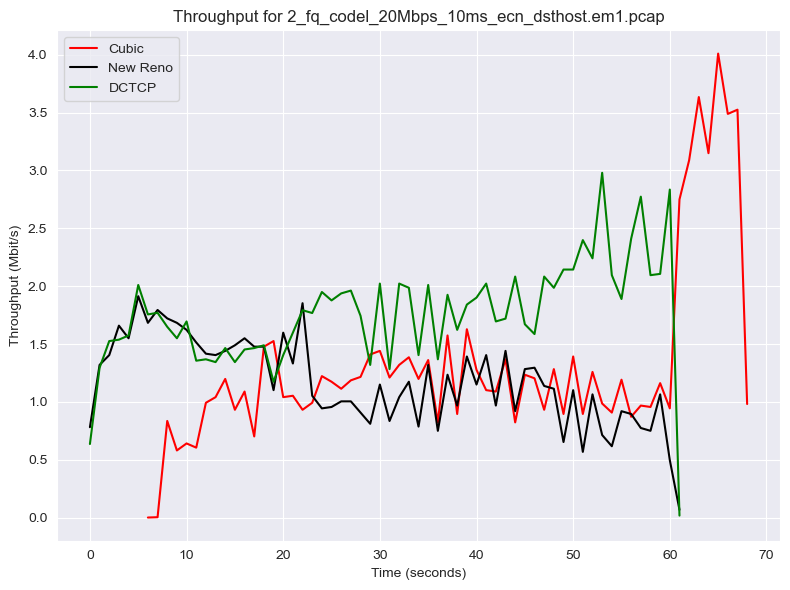

Total throughput for 2_fq_codel_20Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 13371790, 5102: 14250571, 5103: 17653555}
Directory already exists: ./Data\Graphs


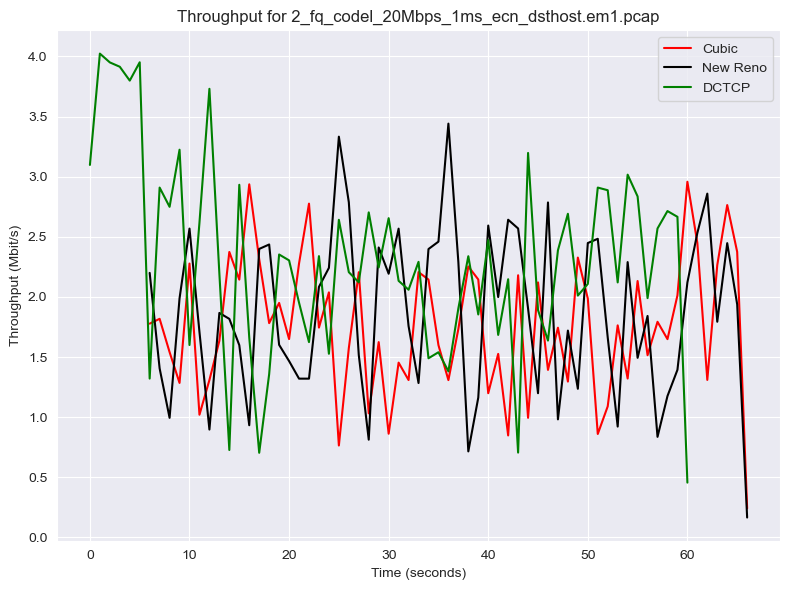

Total throughput for 2_fq_codel_20Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 14894243, 5102: 6520844, 5103: 8266994}
Directory already exists: ./Data\Graphs


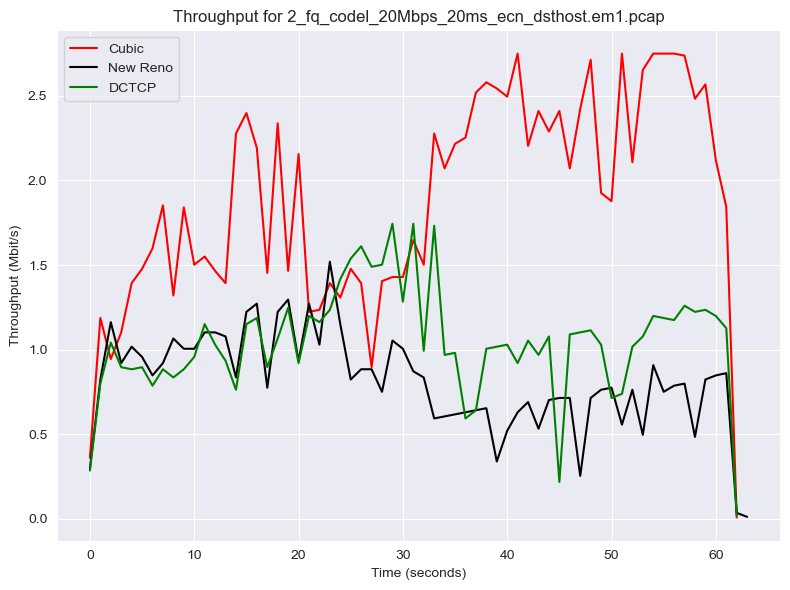

Total throughput for 2_fq_codel_20Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 15304651, 5102: 13489863, 5103: 16183567}
Directory already exists: ./Data\Graphs


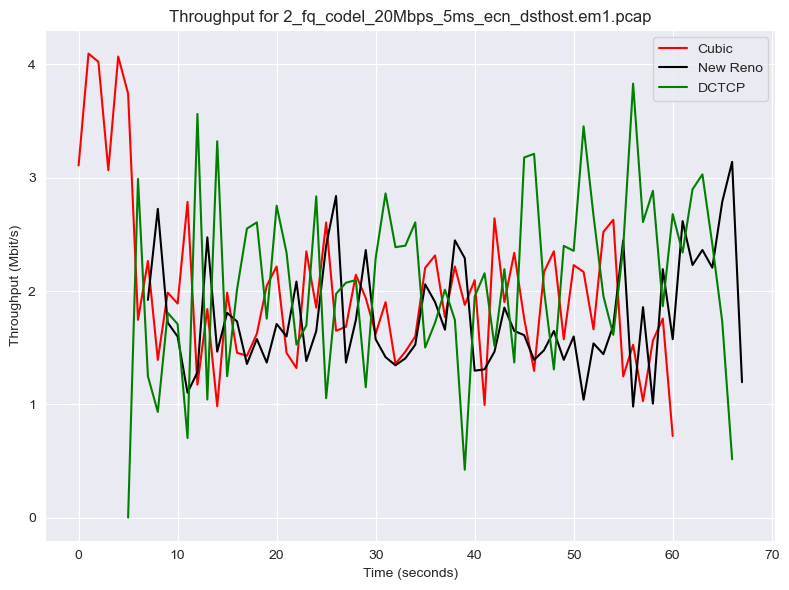

Total throughput for 2_fq_codel_20Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 13833960, 5102: 15338281, 5103: 17542395}
Directory already exists: ./Data\Graphs


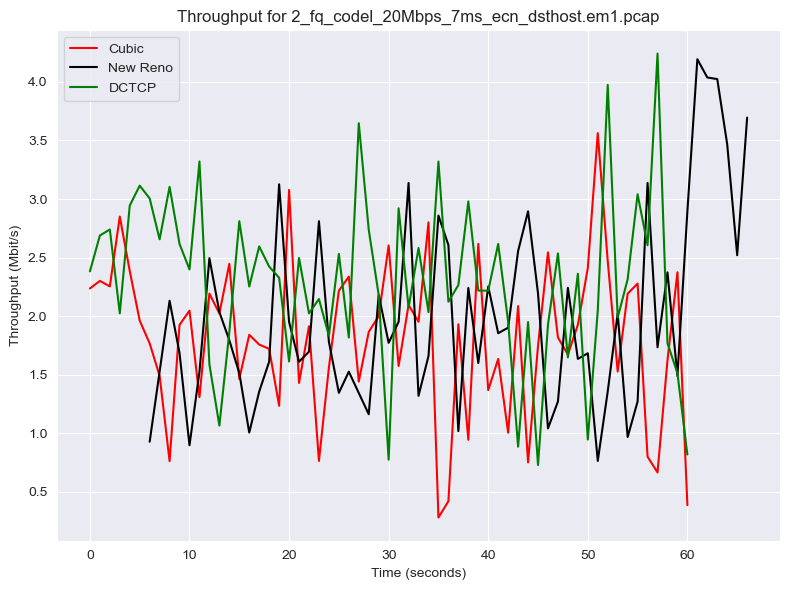

Total throughput for 2_fq_codel_5Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 6963746, 5102: 6271150, 5103: 7277076}
Directory already exists: ./Data\Graphs


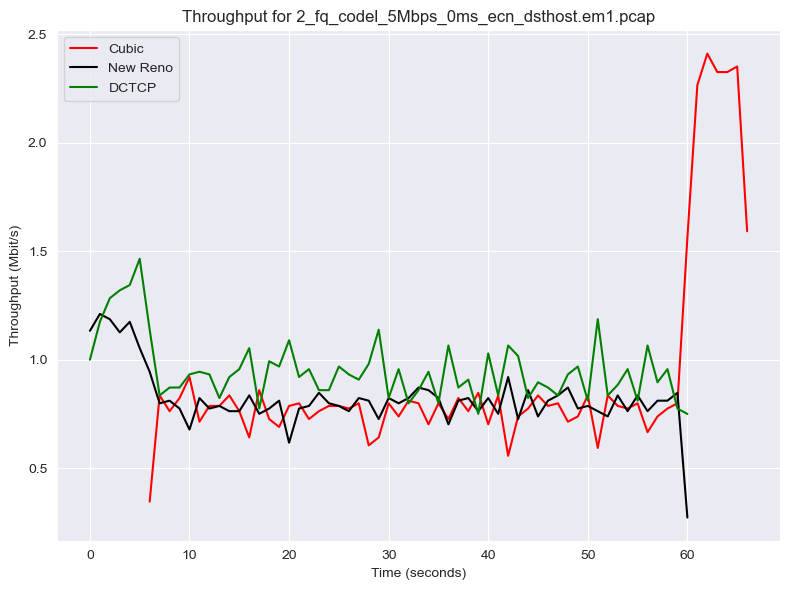

Total throughput for 2_fq_codel_5Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 6928949, 5102: 5768565, 5103: 7309817}
Directory already exists: ./Data\Graphs


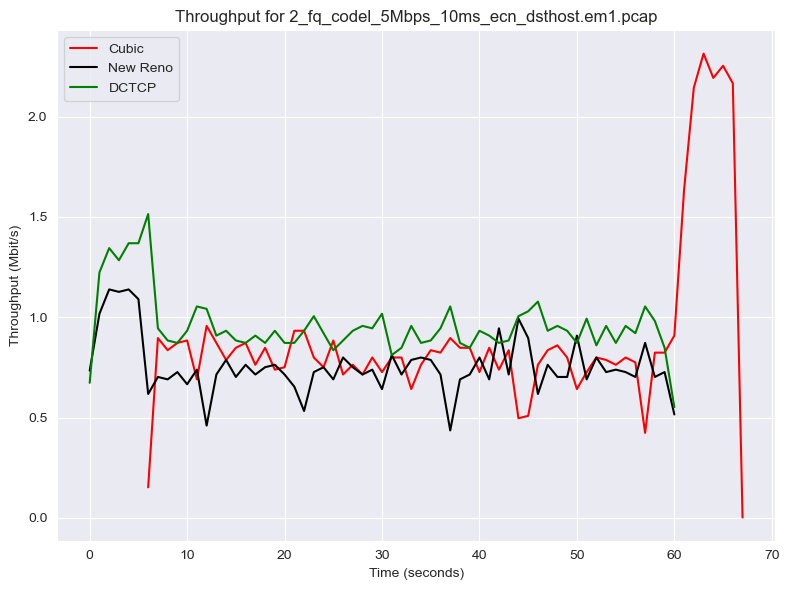

Total throughput for 2_fq_codel_5Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 5963291, 5102: 5969930, 5103: 6745010}
Directory already exists: ./Data\Graphs


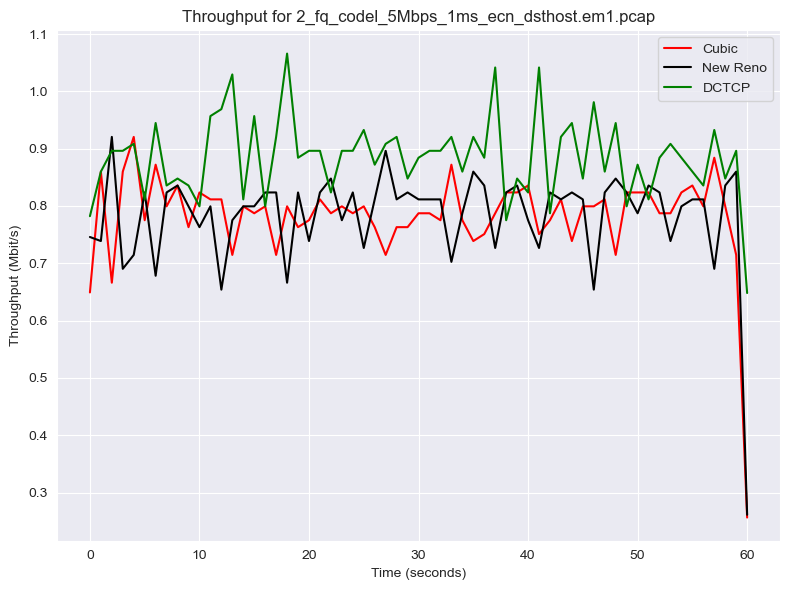

Total throughput for 2_fq_codel_5Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 6013787, 5102: 5824586, 5103: 8446255}
Directory already exists: ./Data\Graphs


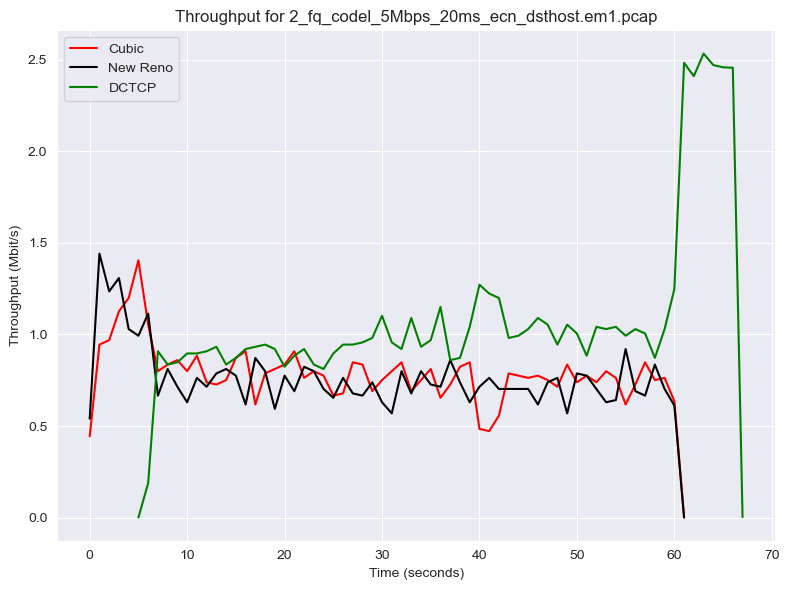

Total throughput for 2_fq_codel_5Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 7859990, 5102: 7656909, 5103: 6110728}
Directory already exists: ./Data\Graphs


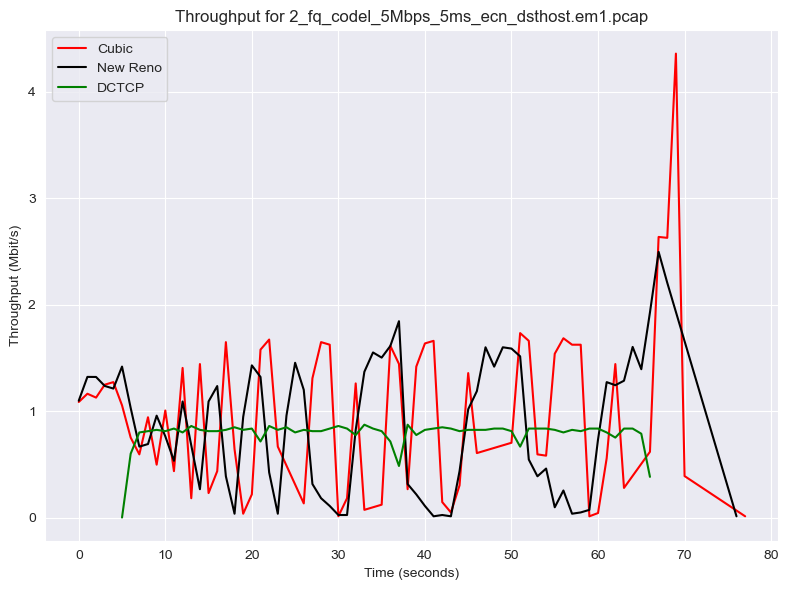

Total throughput for 2_fq_codel_5Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 6118255, 5102: 5758034, 5103: 6815685}
Directory already exists: ./Data\Graphs


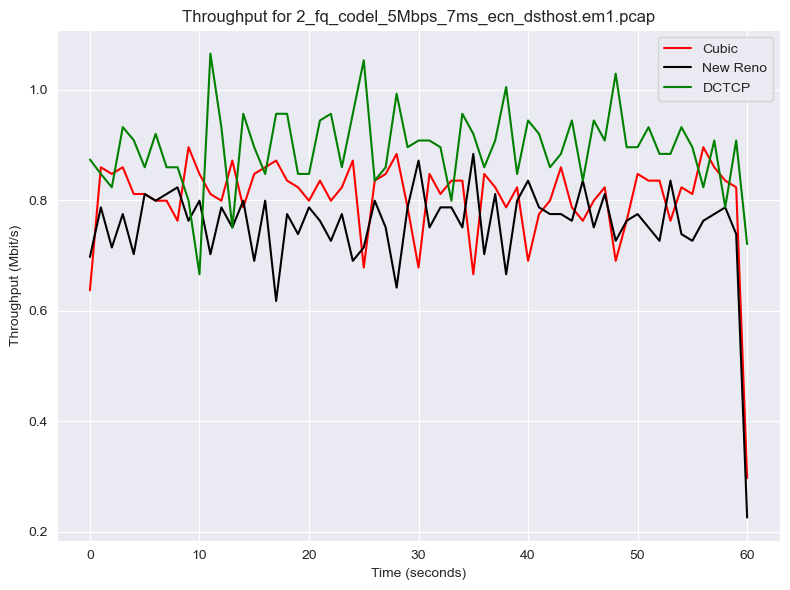

Total throughput for 2_fq_codel_8Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 11118642, 5102: 9425225, 5103: 11851184}
Directory already exists: ./Data\Graphs


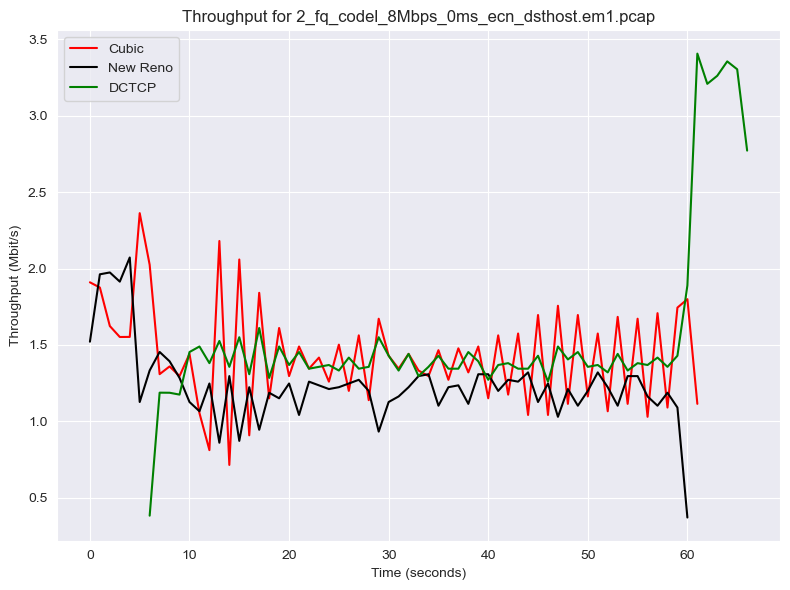

Total throughput for 2_fq_codel_8Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 9843700, 5102: 6168197, 5103: 13281711}
Directory already exists: ./Data\Graphs


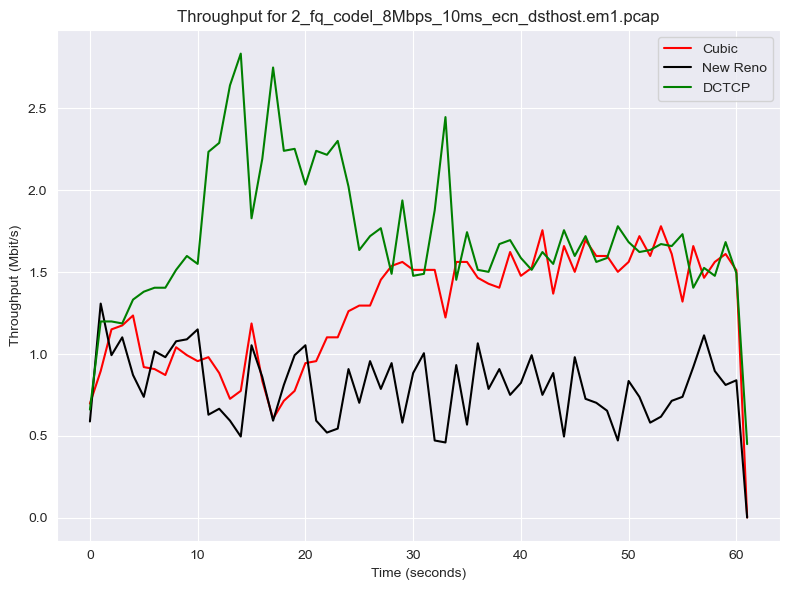

Total throughput for 2_fq_codel_8Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 10591262, 5102: 10158965, 5103: 10604588}
Directory already exists: ./Data\Graphs


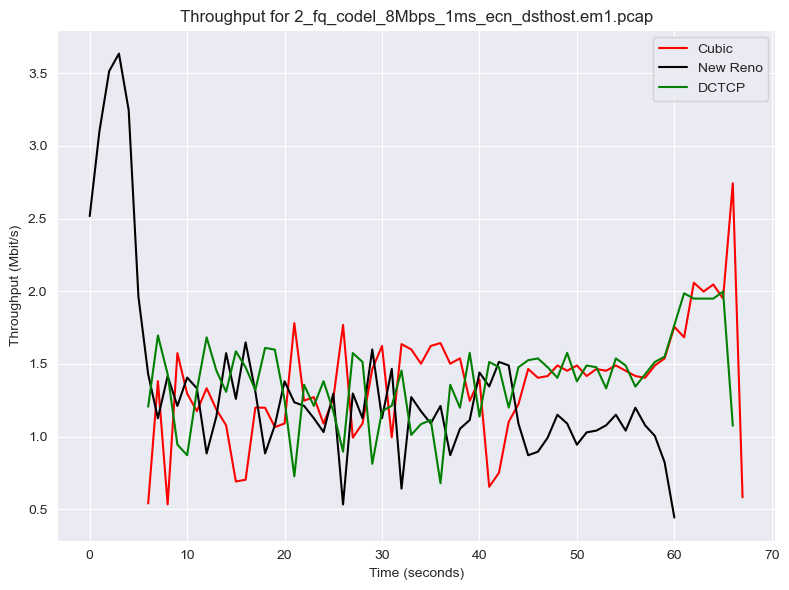

Total throughput for 2_fq_codel_8Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 7935395, 5102: 5545991, 5103: 17592905}
Directory already exists: ./Data\Graphs


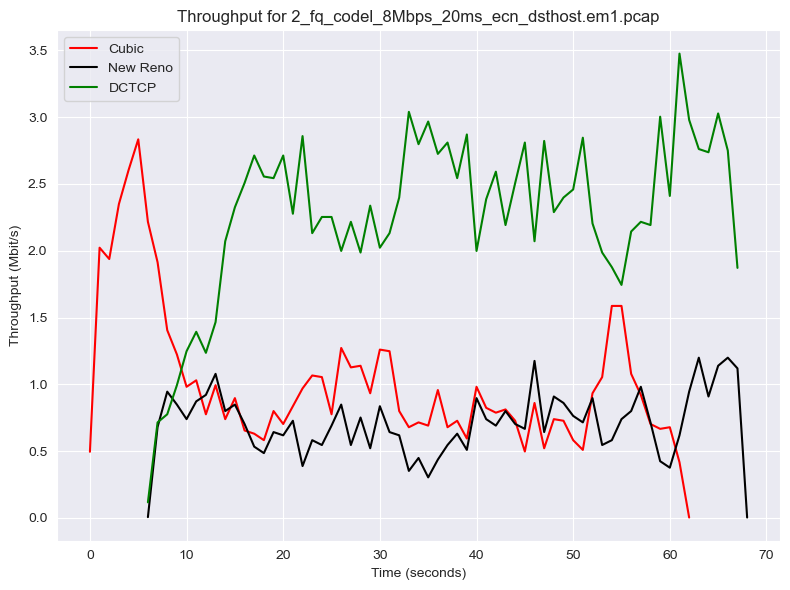

Total throughput for 2_fq_codel_8Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 9936351, 5102: 9552766, 5103: 10634389}
Directory already exists: ./Data\Graphs


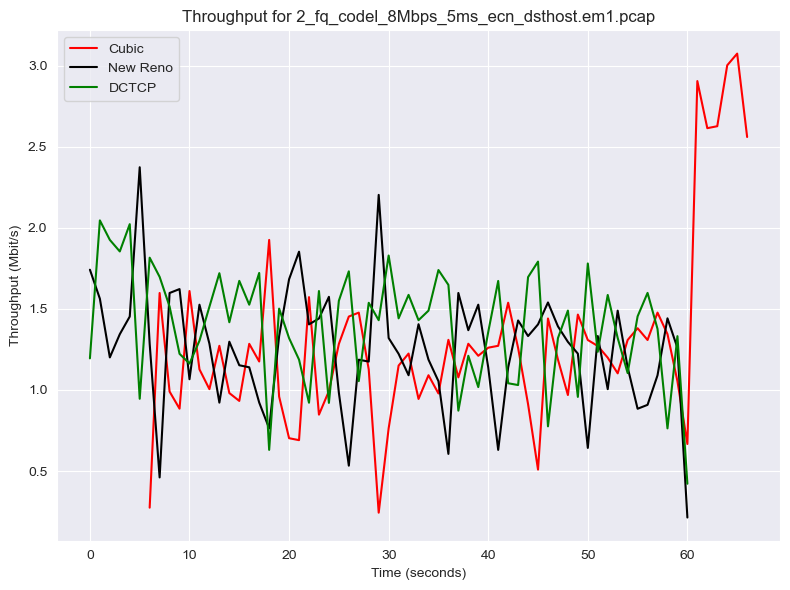

Total throughput for 2_fq_codel_8Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 10540975, 5102: 9906351, 5103: 10095537}
Directory already exists: ./Data\Graphs


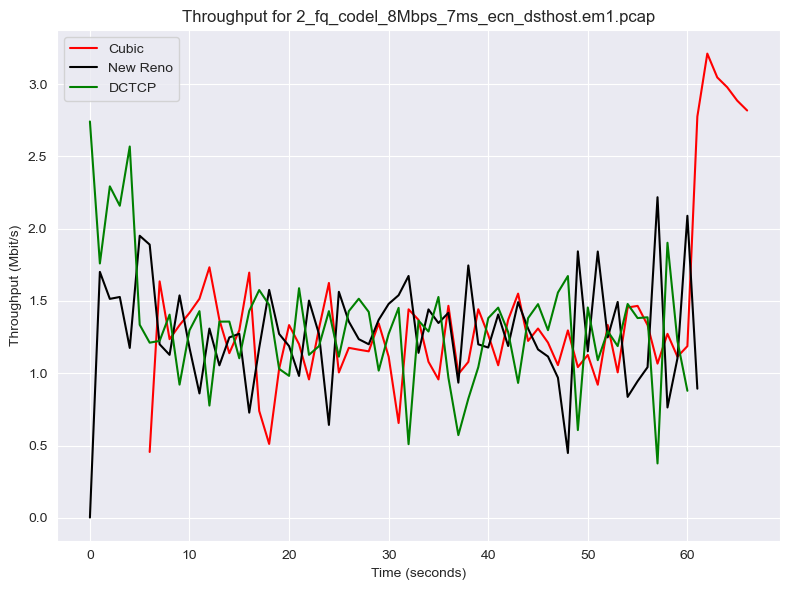

Total throughput for 2_fq_pie_10Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 6692350, 5102: 6697880, 5103: 6837426}
Directory already exists: ./Data\Graphs


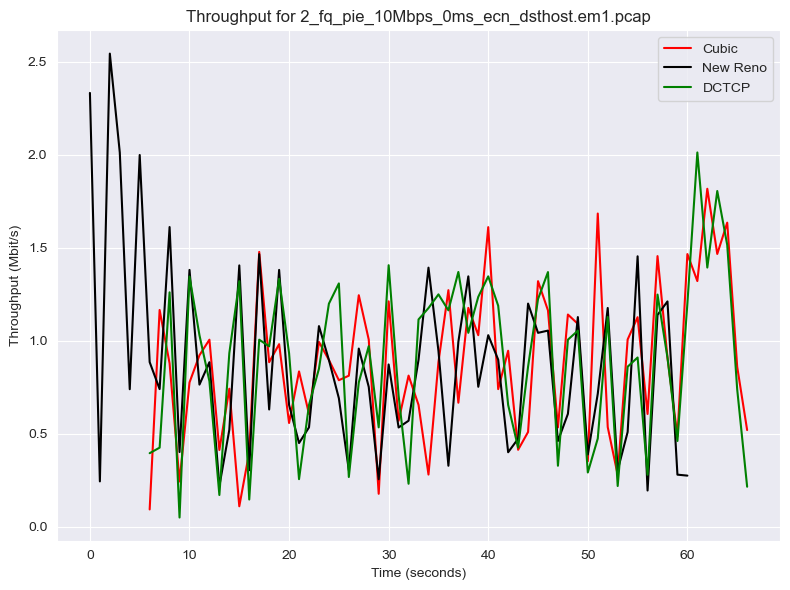

Total throughput for 2_fq_pie_10Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 10351601, 5102: 5526092, 5103: 8710355}
Directory already exists: ./Data\Graphs


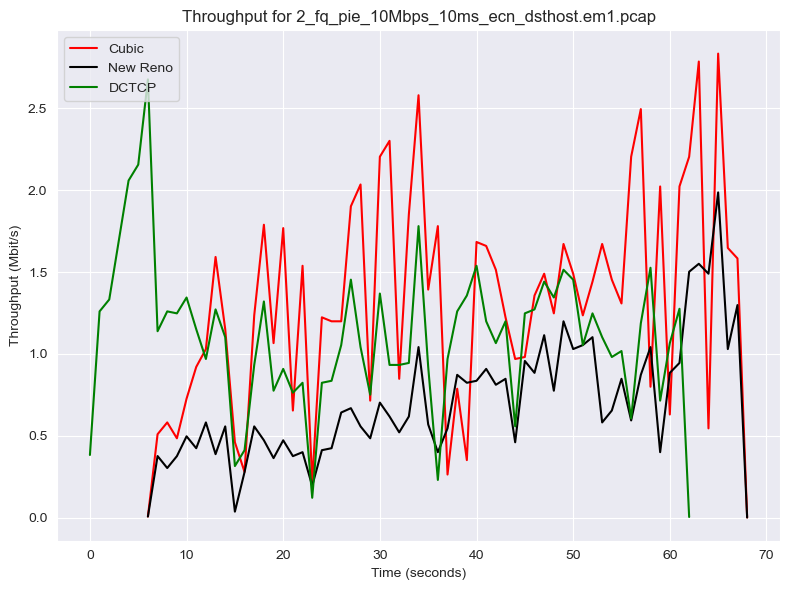

Total throughput for 2_fq_pie_10Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 6768509, 5102: 6253725, 5103: 6438603}
Directory already exists: ./Data\Graphs


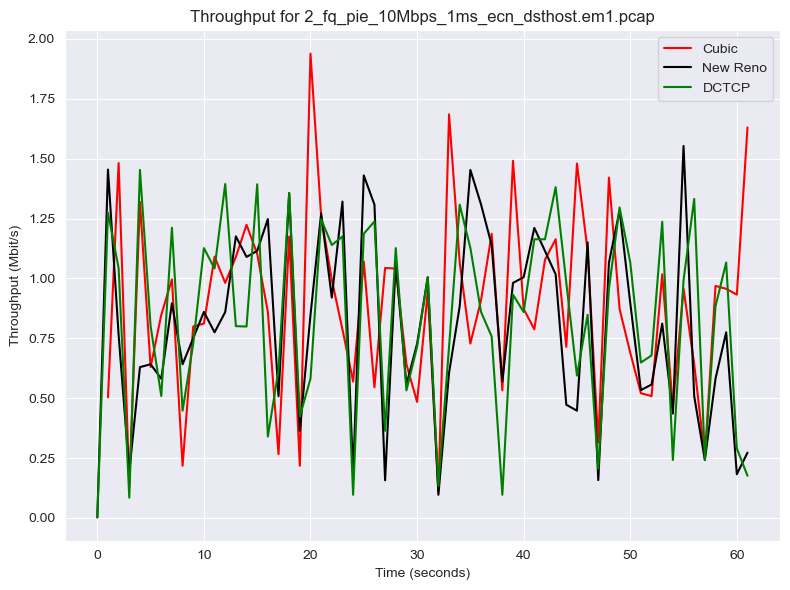

Total throughput for 2_fq_pie_10Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 11885198, 5102: 5859905, 5103: 5619154}
Directory already exists: ./Data\Graphs


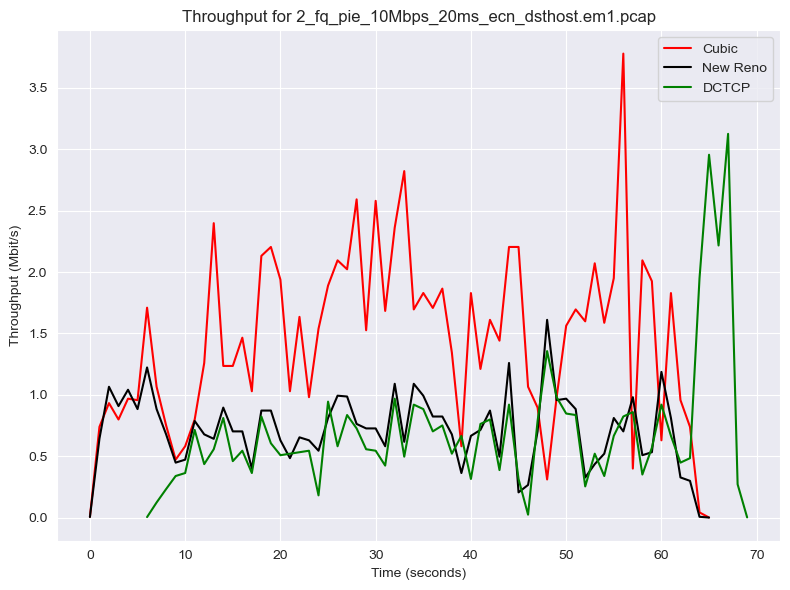

Total throughput for 2_fq_pie_10Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 7197197, 5102: 6500306, 5103: 7224370}
Directory already exists: ./Data\Graphs


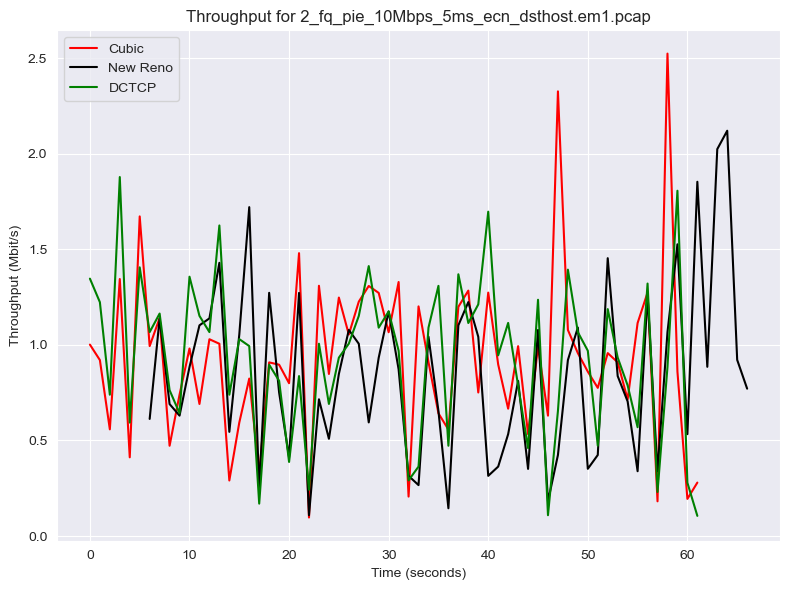

Total throughput for 2_fq_pie_10Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 6702123, 5102: 6272218, 5103: 6760444}
Directory already exists: ./Data\Graphs


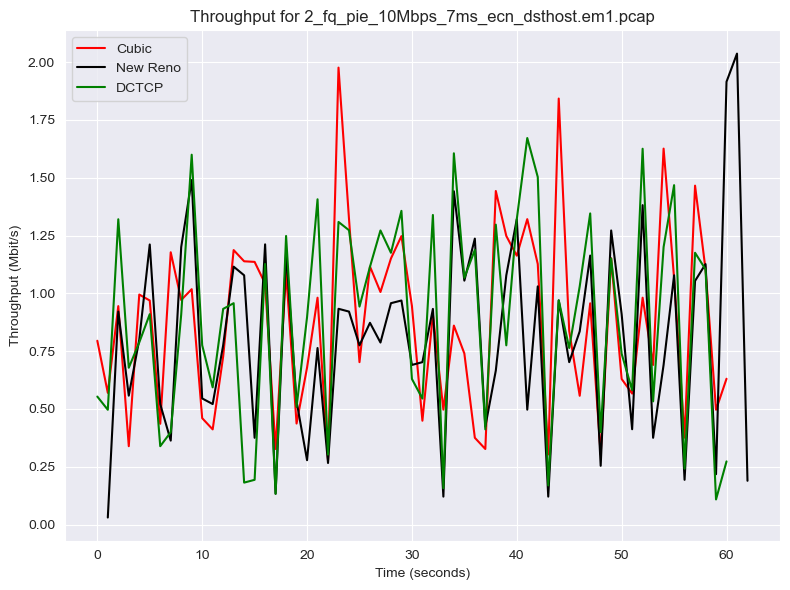

Total throughput for 2_fq_pie_20Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 7711822, 5102: 6459810, 5103: 7829817}
Directory already exists: ./Data\Graphs


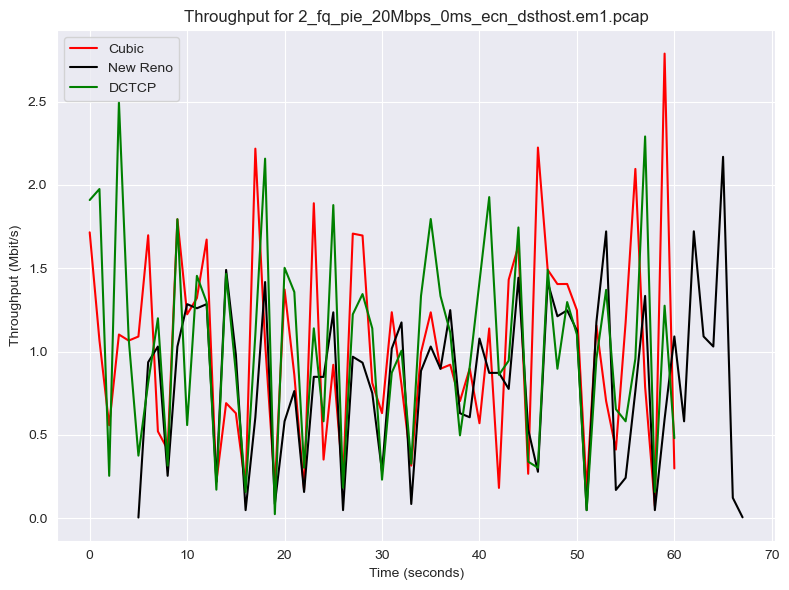

Total throughput for 2_fq_pie_20Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 5532598, 5102: 5144015, 5103: 7431034}
Directory already exists: ./Data\Graphs


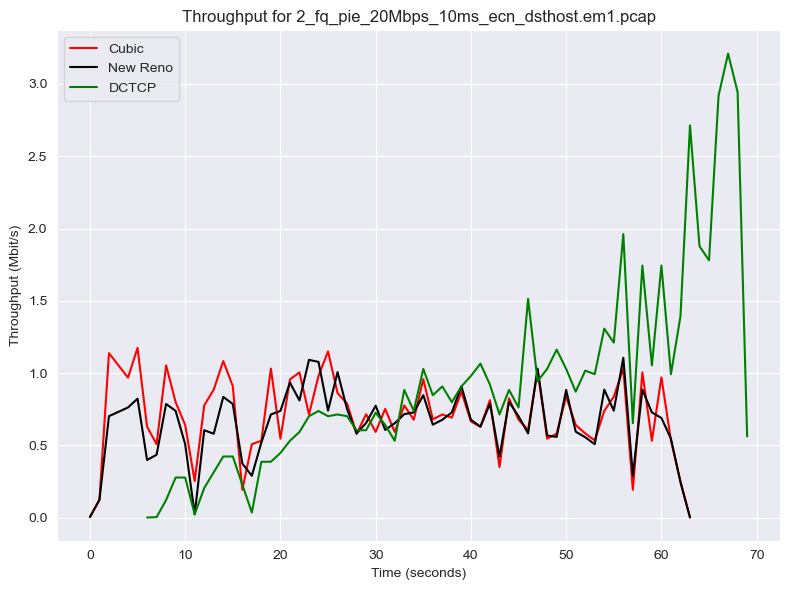

Total throughput for 2_fq_pie_20Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 6642070, 5102: 6833489, 5103: 8041208}
Directory already exists: ./Data\Graphs


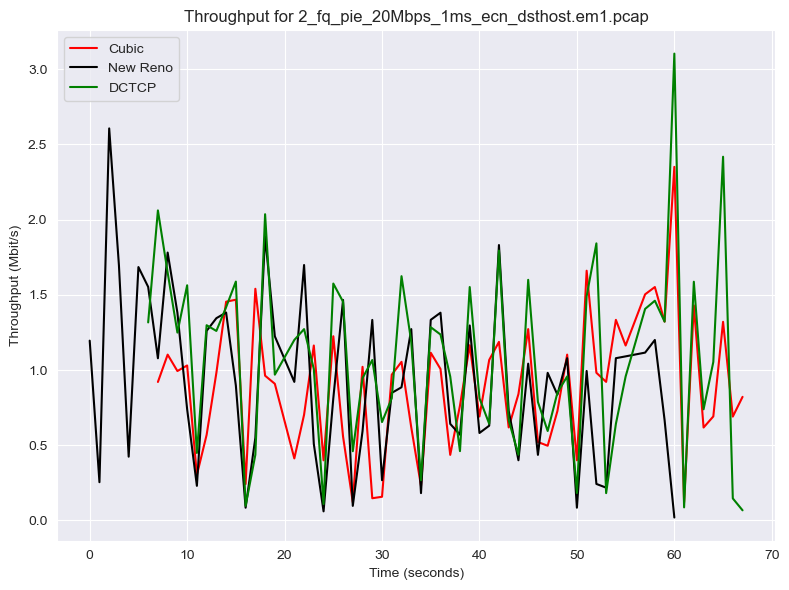

Total throughput for 2_fq_pie_20Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 4641124, 5102: 4073734, 5103: 5586937}
Directory already exists: ./Data\Graphs


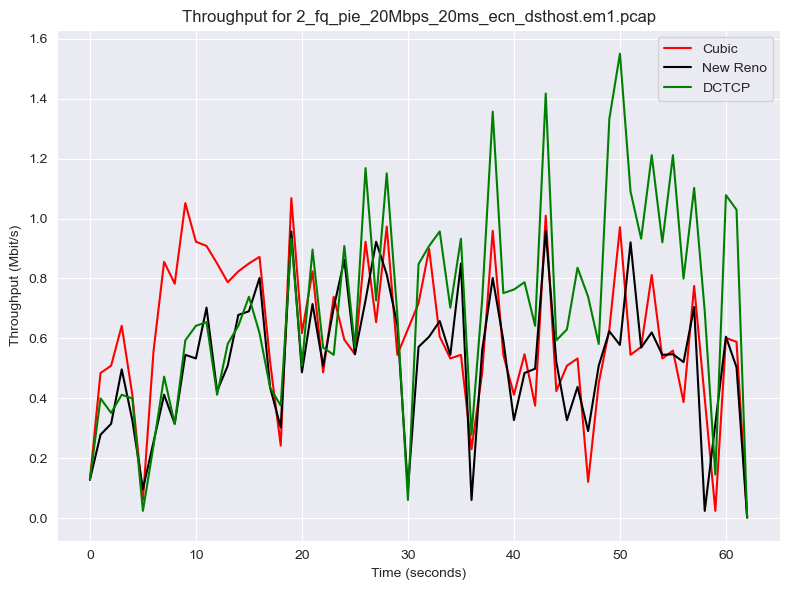

Total throughput for 2_fq_pie_20Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 7381287, 5102: 7602686, 5103: 8191032}
Directory already exists: ./Data\Graphs


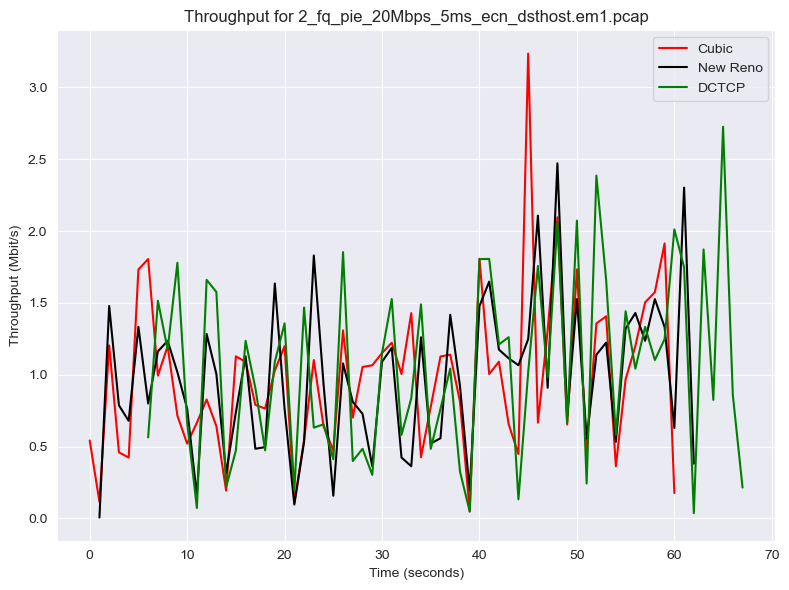

Total throughput for 2_fq_pie_20Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 6828417, 5102: 6405642, 5103: 6772763}
Directory already exists: ./Data\Graphs


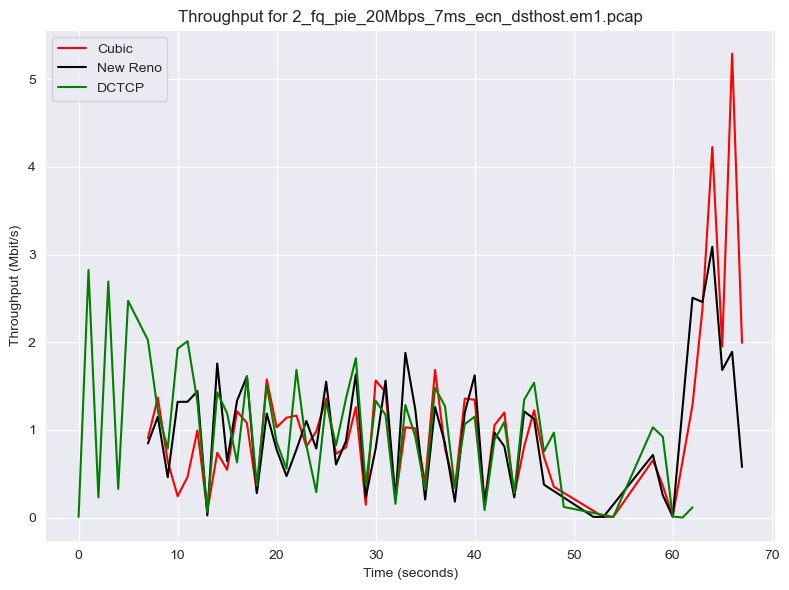

Total throughput for 2_fq_pie_5Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 5422473, 5102: 4976678, 5103: 5391192}
Directory already exists: ./Data\Graphs


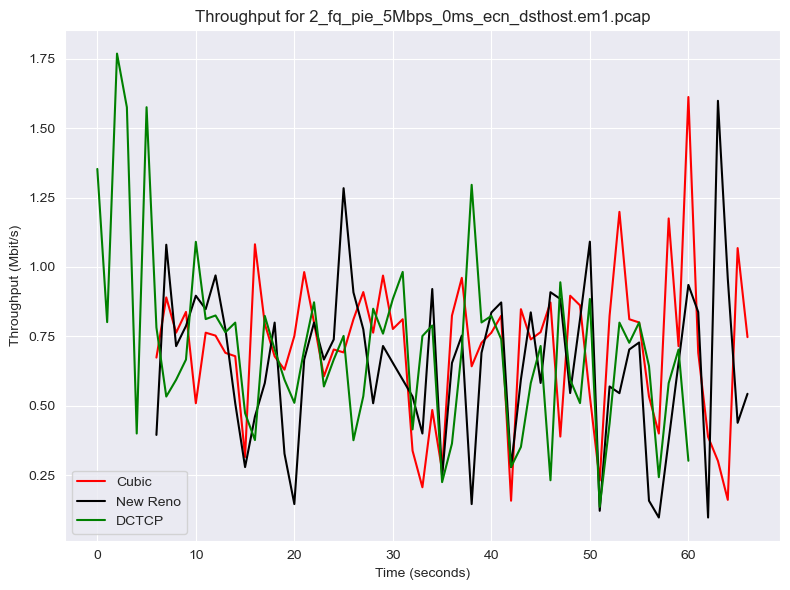

Total throughput for 2_fq_pie_5Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 6529757, 5102: 5091047, 5103: 5783770}
Directory already exists: ./Data\Graphs


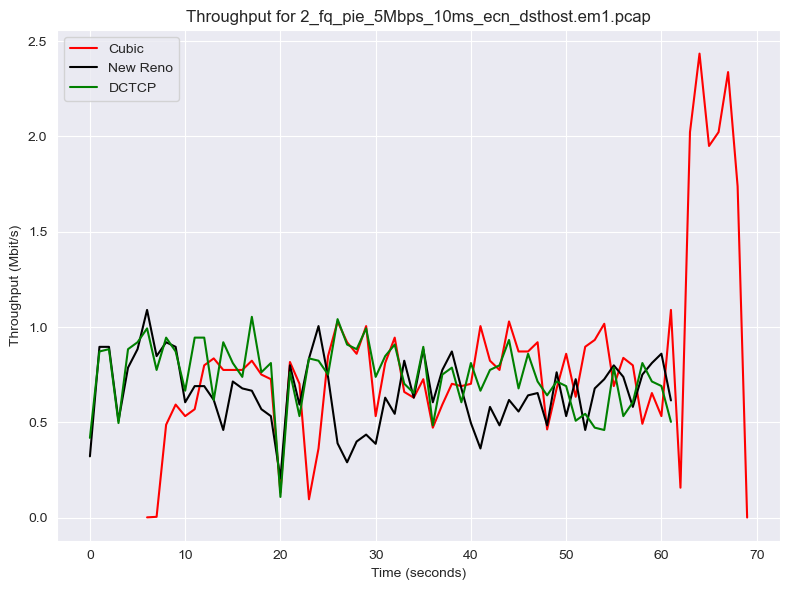

Total throughput for 2_fq_pie_5Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 4743398, 5102: 4553174, 5103: 4924044}
Directory already exists: ./Data\Graphs


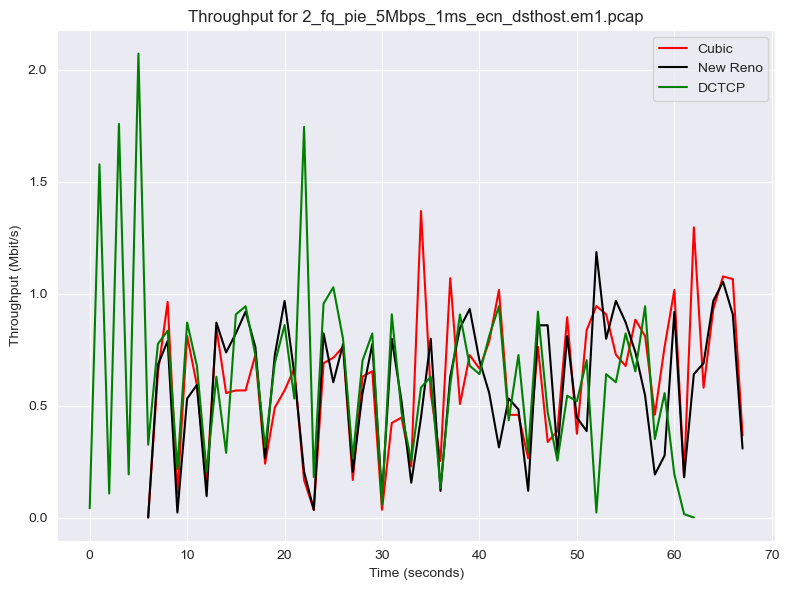

Total throughput for 2_fq_pie_5Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 6725442, 5102: 4960454, 5103: 5087374}
Directory already exists: ./Data\Graphs


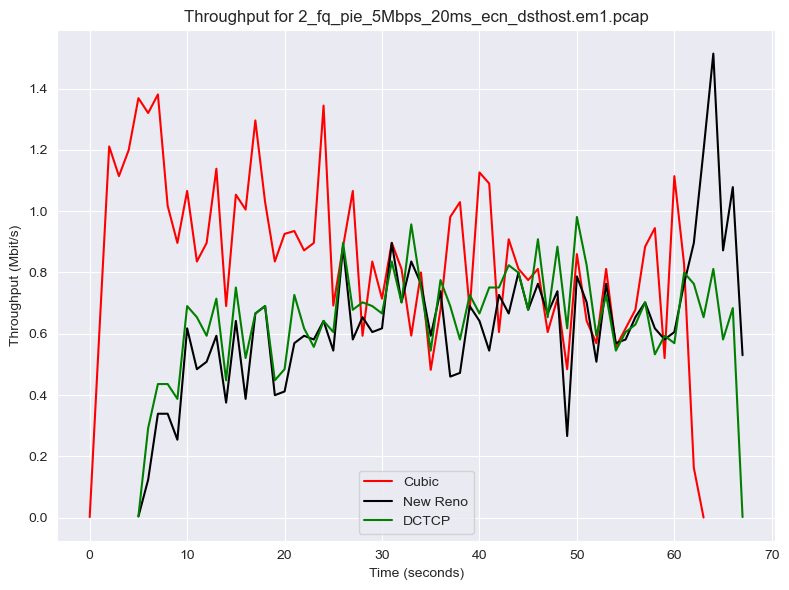

Total throughput for 2_fq_pie_5Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 4410375, 5102: 4408277, 5103: 4423312}
Directory already exists: ./Data\Graphs


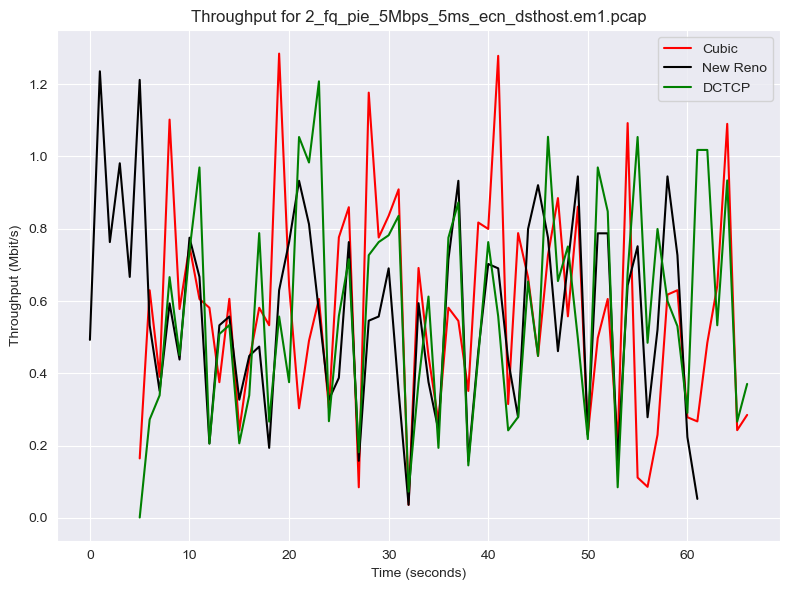

Total throughput for 2_fq_pie_5Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 5250657, 5102: 4467657, 5103: 4724292}
Directory already exists: ./Data\Graphs


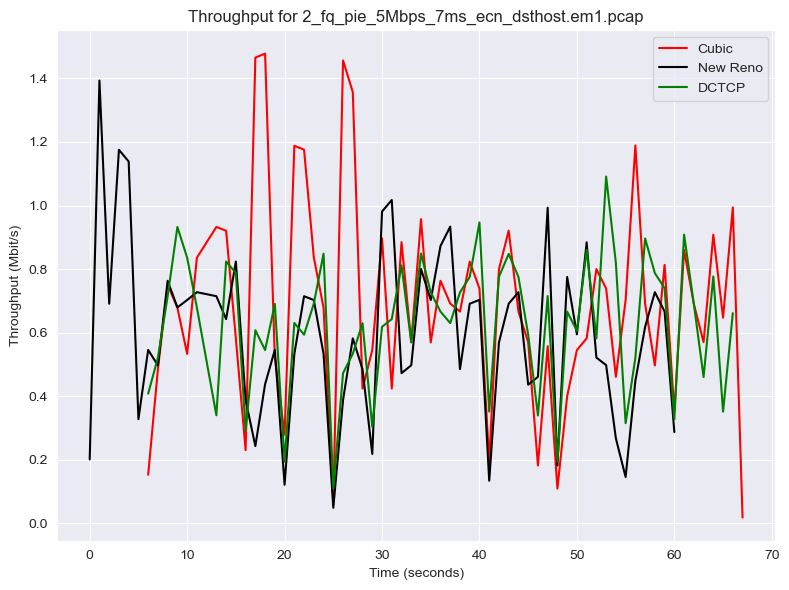

Total throughput for 2_fq_pie_8Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 6702448, 5102: 6147527, 5103: 5963990}
Directory already exists: ./Data\Graphs


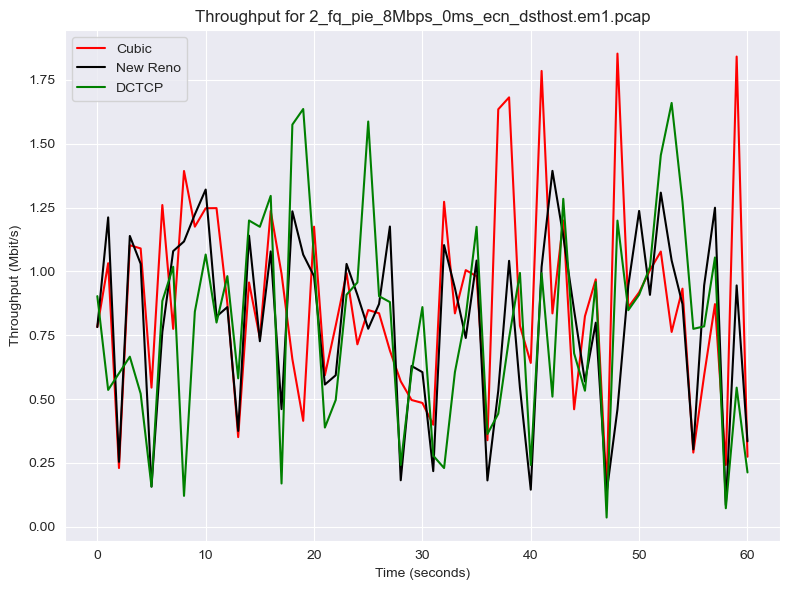

Total throughput for 2_fq_pie_8Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 9071826, 5102: 4271971, 5103: 4864312}
Directory already exists: ./Data\Graphs


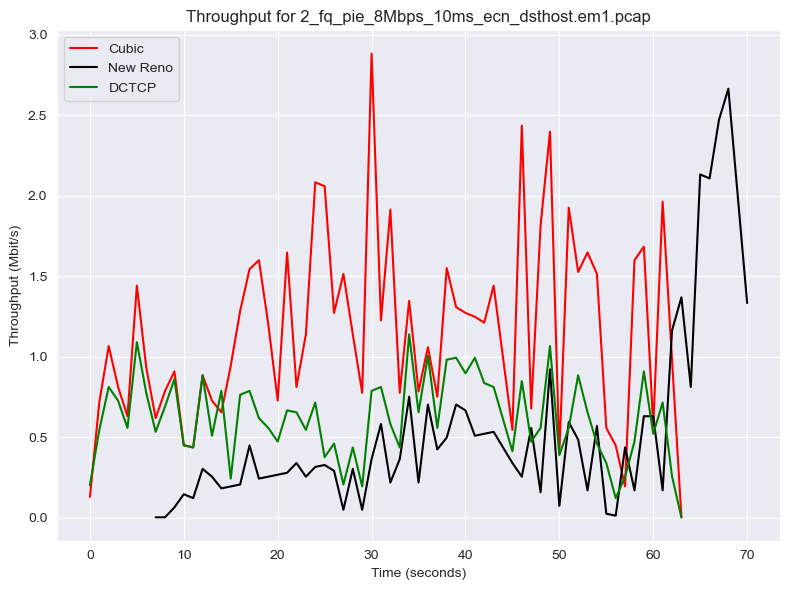

Total throughput for 2_fq_pie_8Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 5883864, 5102: 5774782, 5103: 5838539}
Directory already exists: ./Data\Graphs


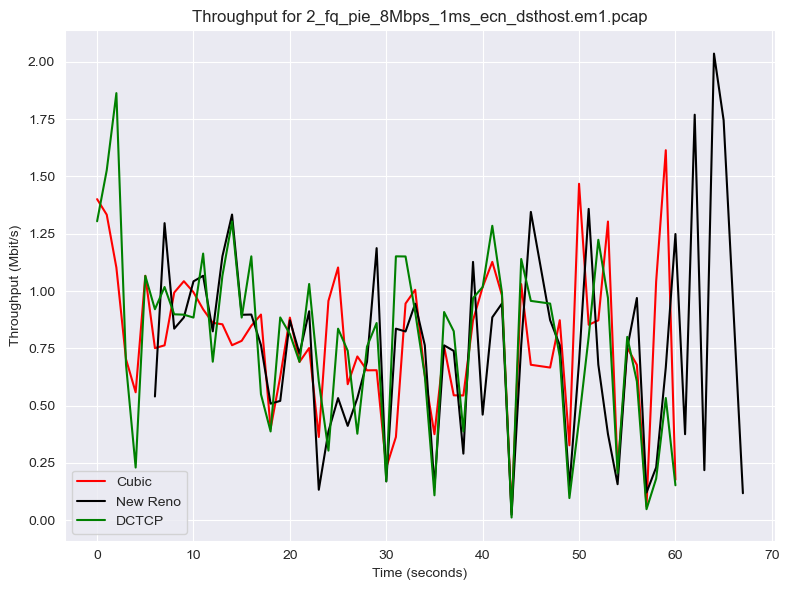

Total throughput for 2_fq_pie_8Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 11295900, 5102: 3022448, 5103: 3321309}
Directory already exists: ./Data\Graphs


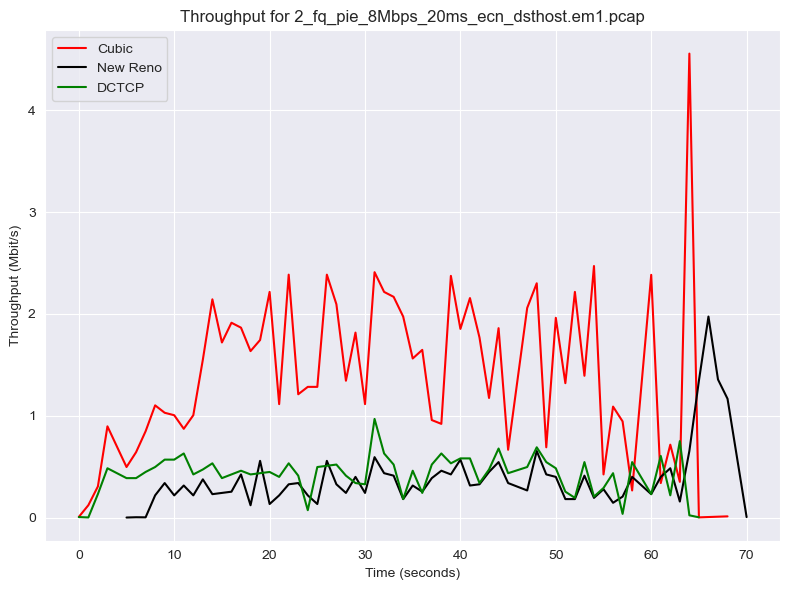

Total throughput for 2_fq_pie_8Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 5443464, 5102: 4912172, 5103: 5071954}
Directory already exists: ./Data\Graphs


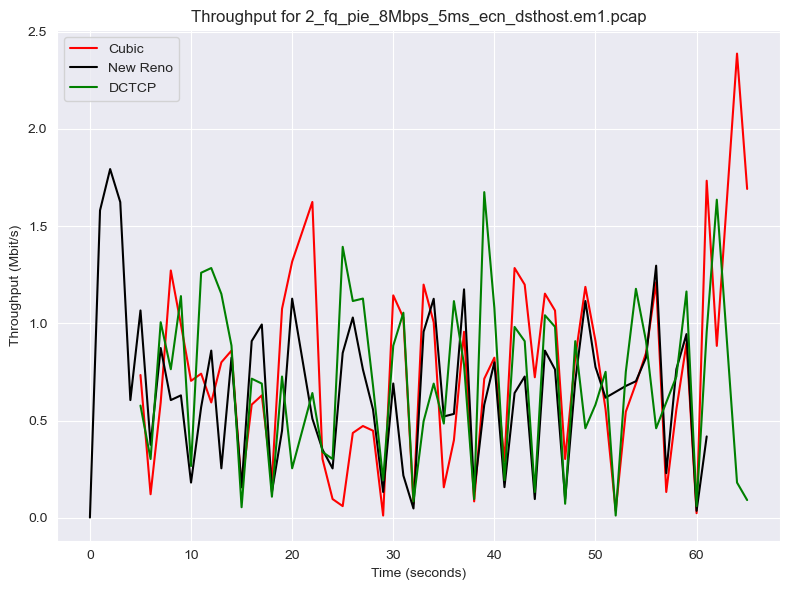

Total throughput for 2_fq_pie_8Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 5709788, 5102: 4930629, 5103: 5842121}
Directory already exists: ./Data\Graphs


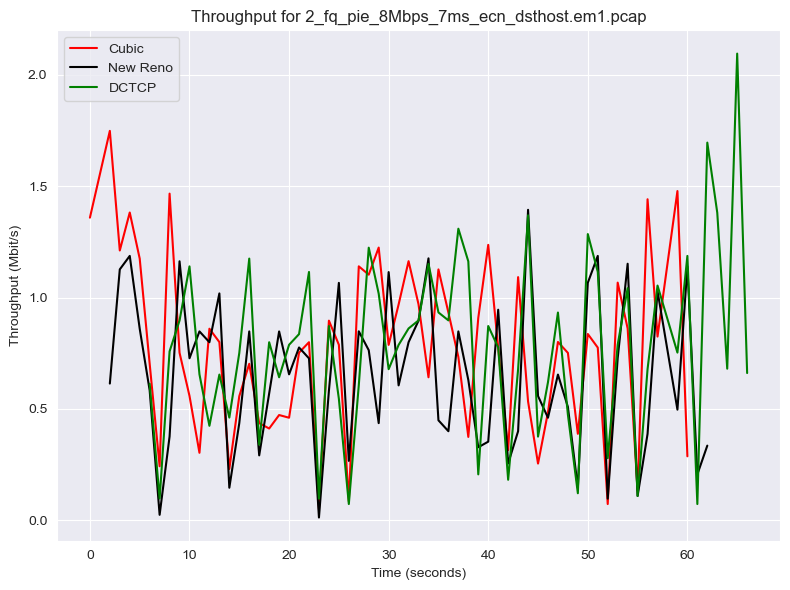

Total throughput for 2_l4s_10Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 8107035, 5102: 6925146, 5103: 11207797}
Directory already exists: ./Data\Graphs


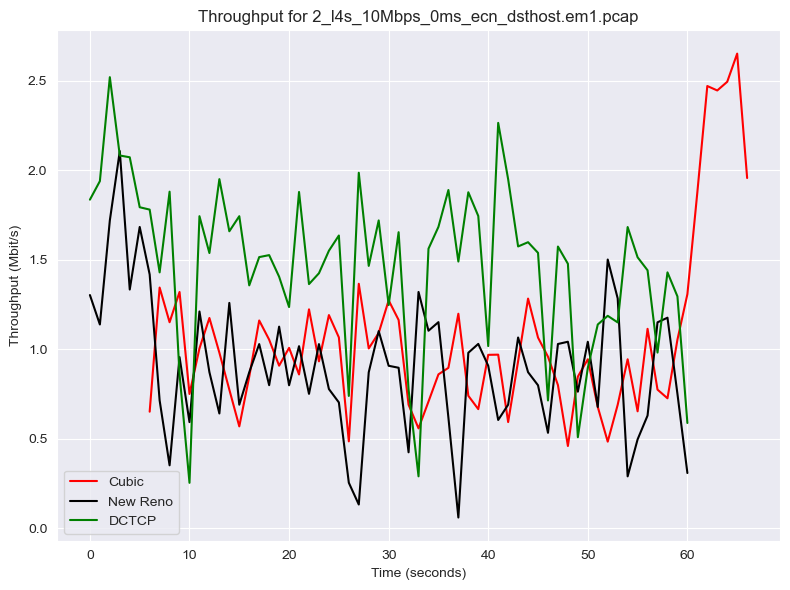

Total throughput for 2_l4s_10Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 13062657, 5102: 6377410, 5103: 7353674}
Directory already exists: ./Data\Graphs


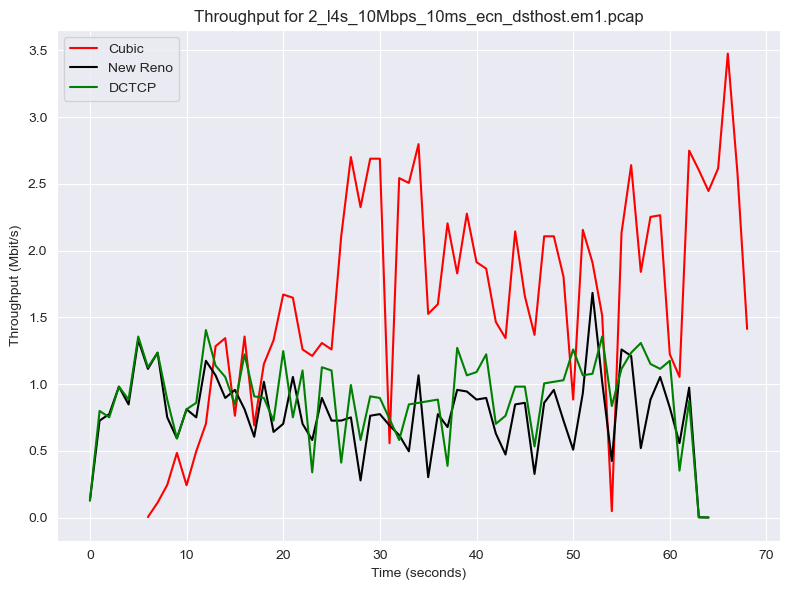

Total throughput for 2_l4s_10Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 7074710, 5102: 7511191, 5103: 10754234}
Directory already exists: ./Data\Graphs


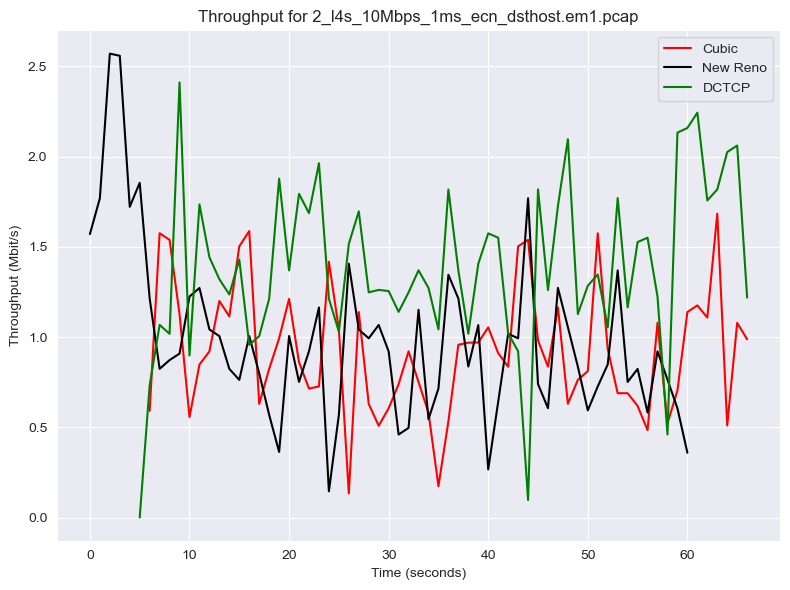

Total throughput for 2_l4s_10Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 15596480, 5102: 4145935, 5103: 5854463}
Directory already exists: ./Data\Graphs


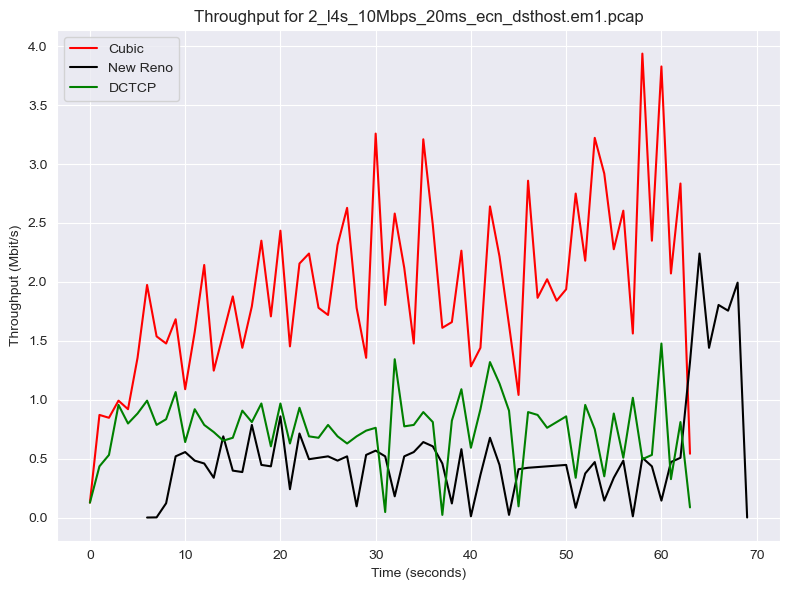

Total throughput for 2_l4s_10Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 6295352, 5102: 7776862, 5103: 10468945}
Directory already exists: ./Data\Graphs


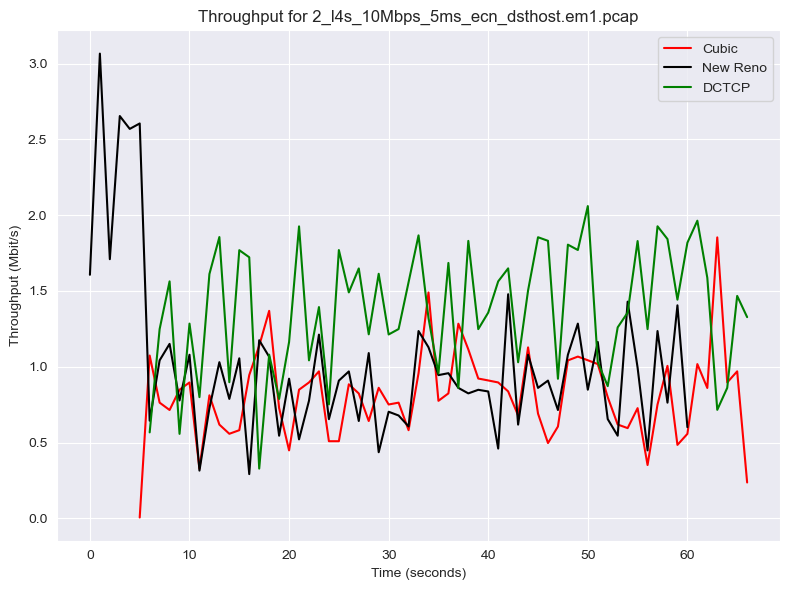

Total throughput for 2_l4s_10Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 6699647, 5102: 7640672, 5103: 11553108}
Directory already exists: ./Data\Graphs


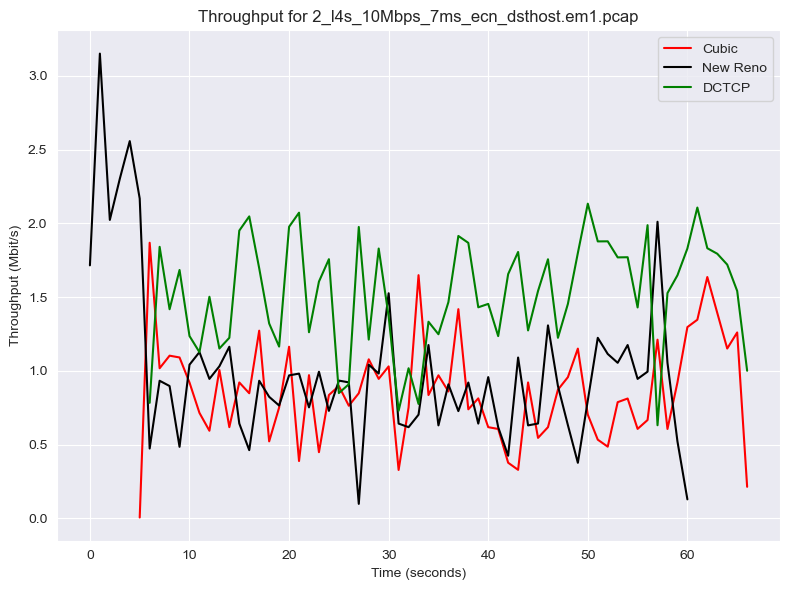

Total throughput for 2_l4s_20Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 9673654, 5102: 9527202, 5103: 14368620}
Directory already exists: ./Data\Graphs


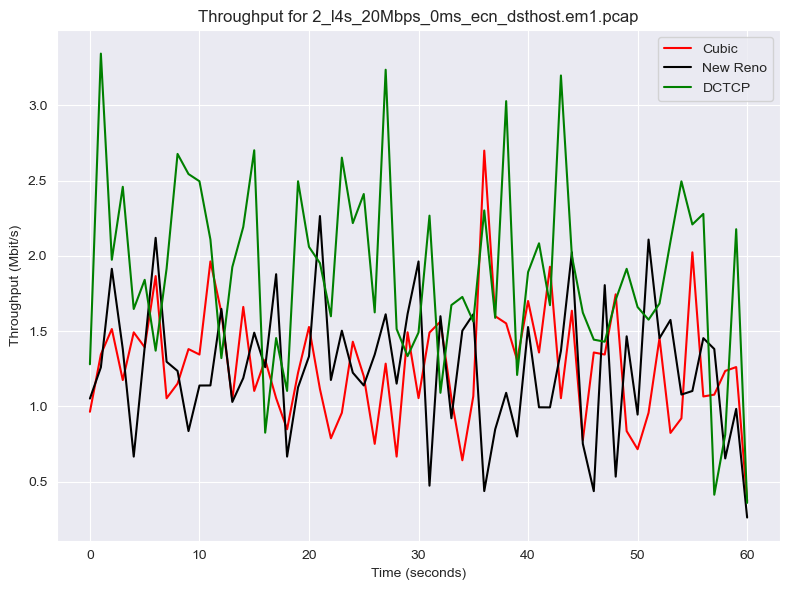

Total throughput for 2_l4s_20Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 20071042, 5102: 6070642, 5103: 6868738}
Directory already exists: ./Data\Graphs


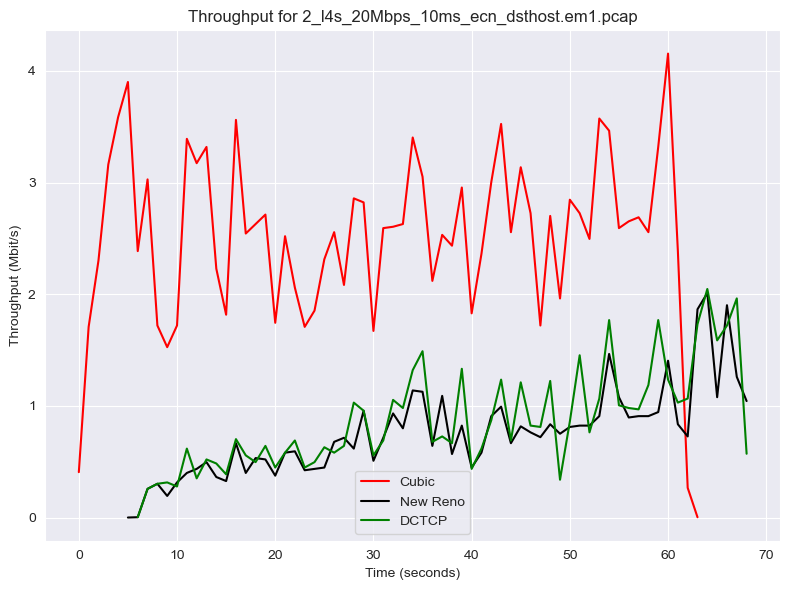

Total throughput for 2_l4s_20Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 9374031, 5102: 9197192, 5103: 13972527}
Directory already exists: ./Data\Graphs


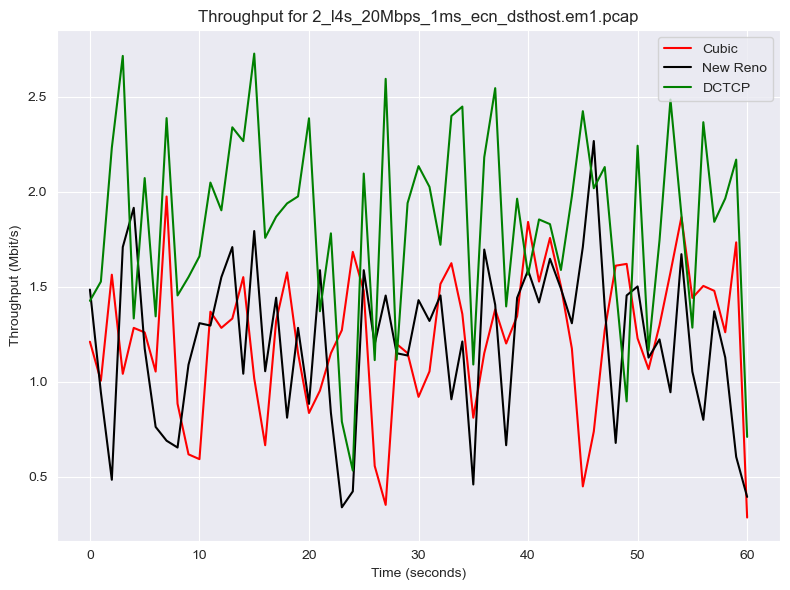

Total throughput for 2_l4s_20Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 22812271, 5102: 4710556, 5103: 4951132}
Directory already exists: ./Data\Graphs


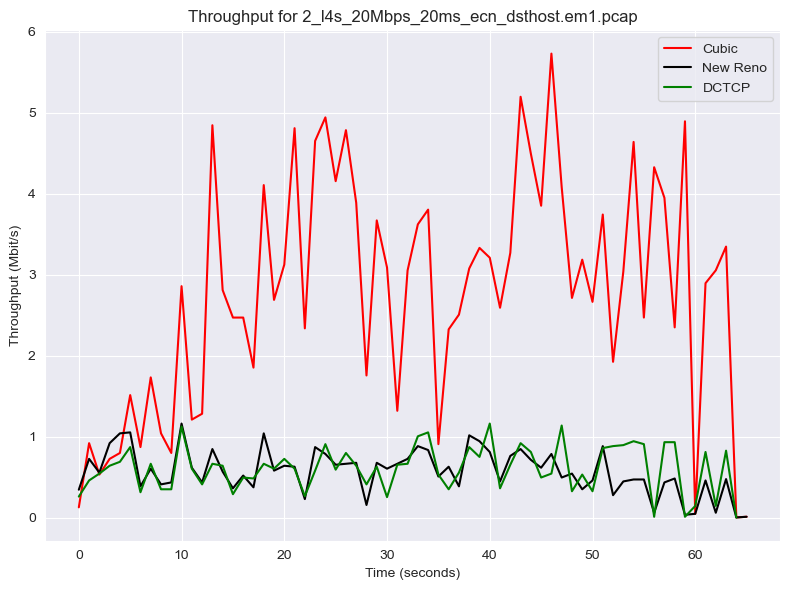

Total throughput for 2_l4s_20Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 9577079, 5102: 9821145, 5103: 14053534}
Directory already exists: ./Data\Graphs


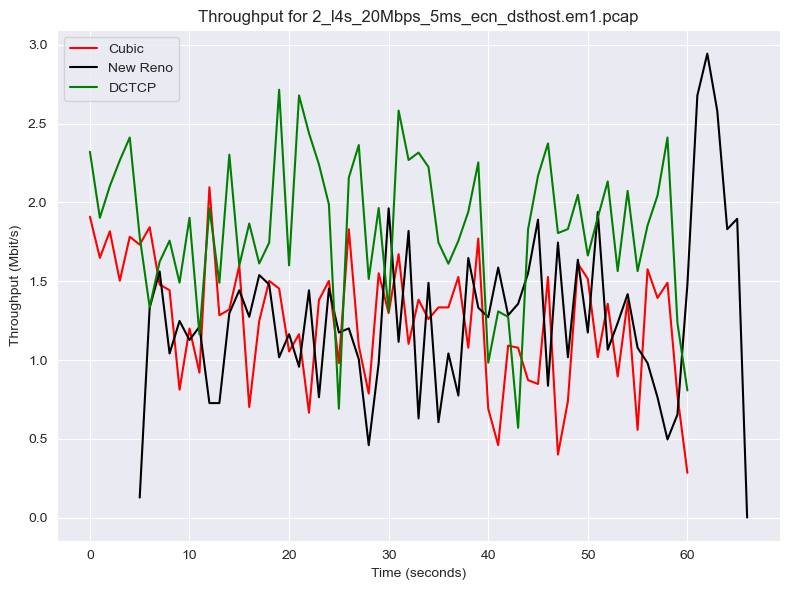

Total throughput for 2_l4s_20Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 7410664, 5102: 7965445, 5103: 11089583}
Directory already exists: ./Data\Graphs


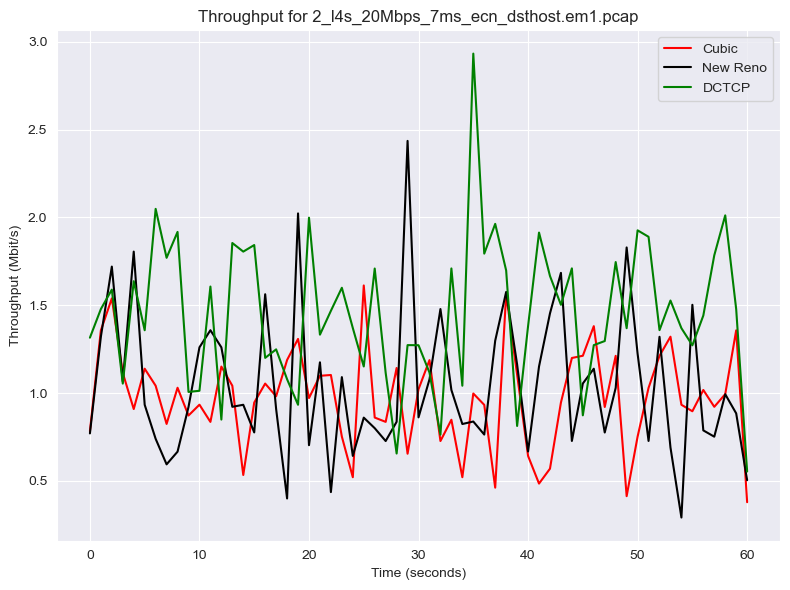

Total throughput for 2_l4s_5Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 4624242, 5102: 5134983, 5103: 6113317}
Directory already exists: ./Data\Graphs


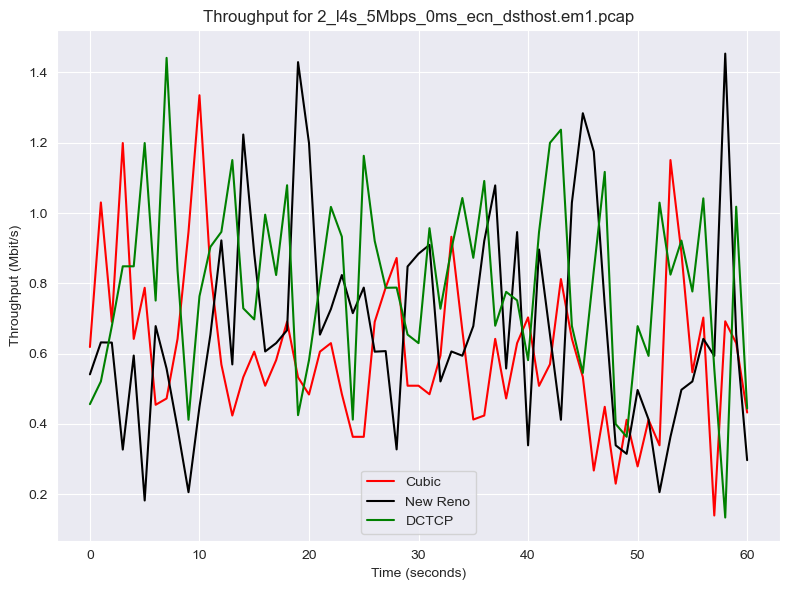

Total throughput for 2_l4s_5Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 9150279, 5102: 2503267, 5103: 5698319}
Directory already exists: ./Data\Graphs


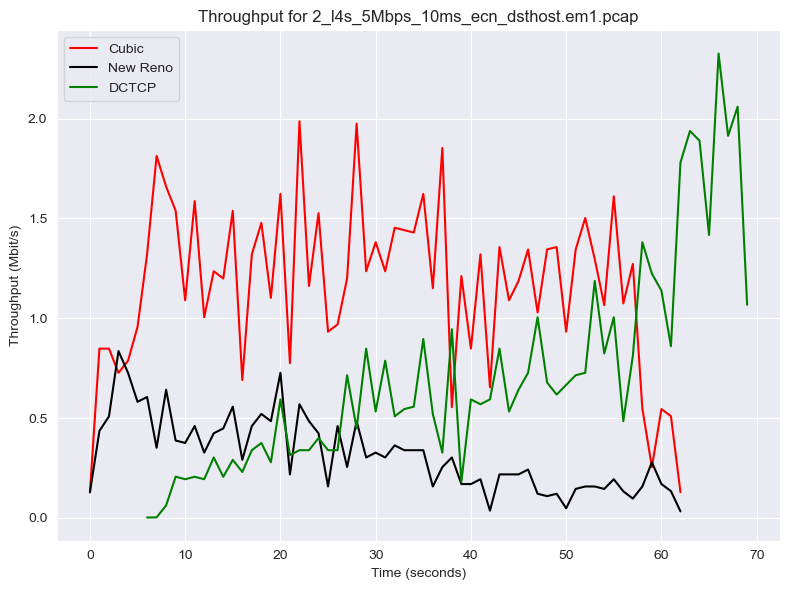

Total throughput for 2_l4s_5Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 4122530, 5102: 5121944, 5103: 7227921}
Directory already exists: ./Data\Graphs


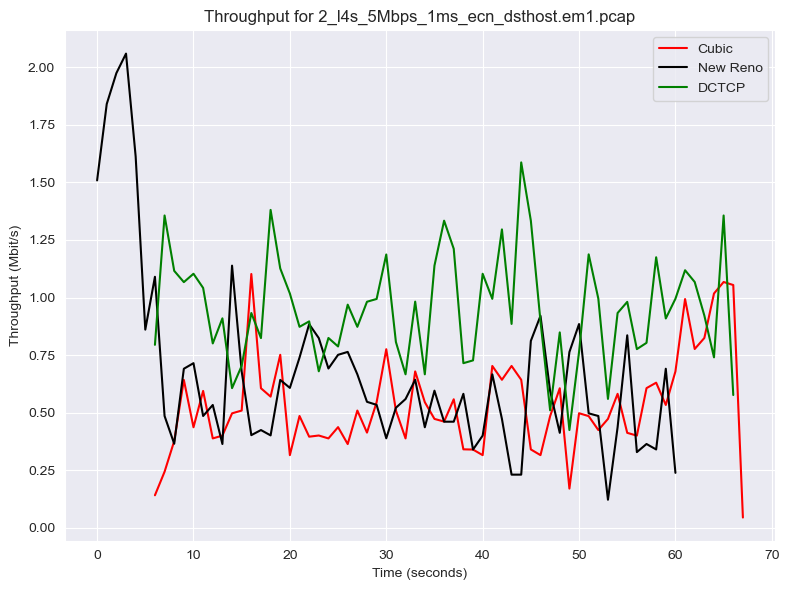

Total throughput for 2_l4s_5Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 8836631, 5102: 2088874, 5103: 6100047}
Directory already exists: ./Data\Graphs


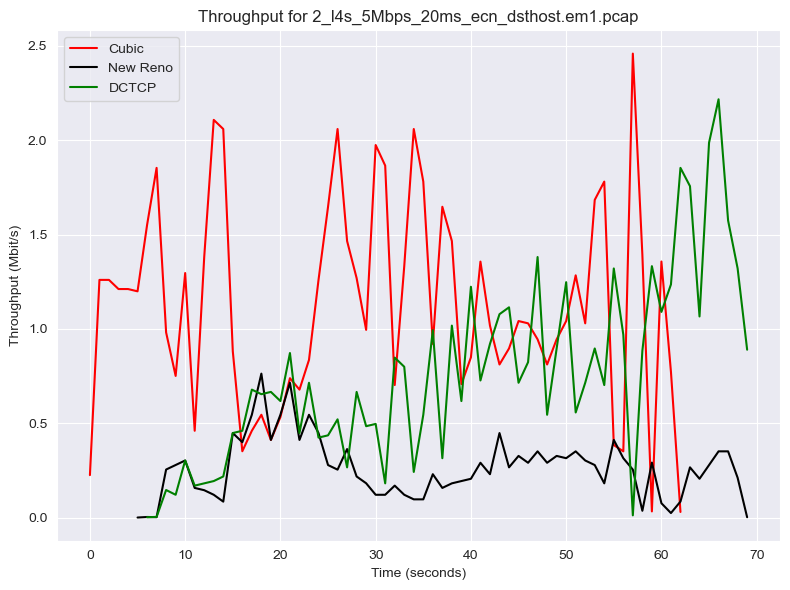

Total throughput for 2_l4s_5Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 4543465, 5102: 4597319, 5103: 6624530}
Directory already exists: ./Data\Graphs


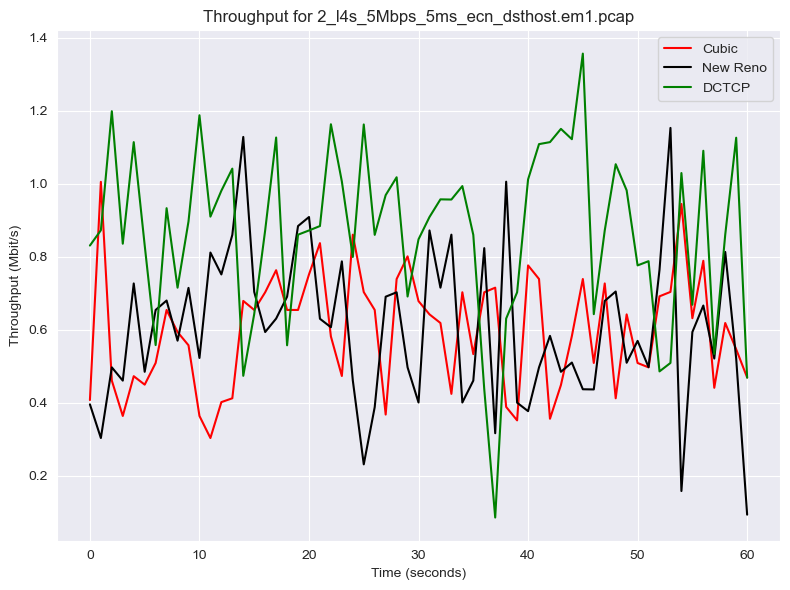

Total throughput for 2_l4s_5Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 4460524, 5102: 5121640, 5103: 6690028}
Directory already exists: ./Data\Graphs


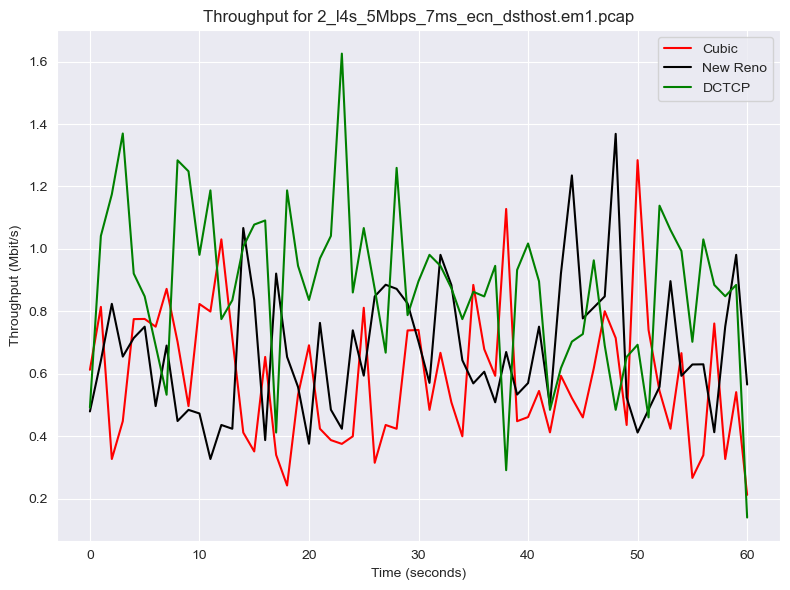

Total throughput for 2_l4s_8Mbps_0ms_ecn_dsthost.em1.pcap_throughput: {5101: 6276843, 5102: 5860926, 5103: 9733670}
Directory already exists: ./Data\Graphs


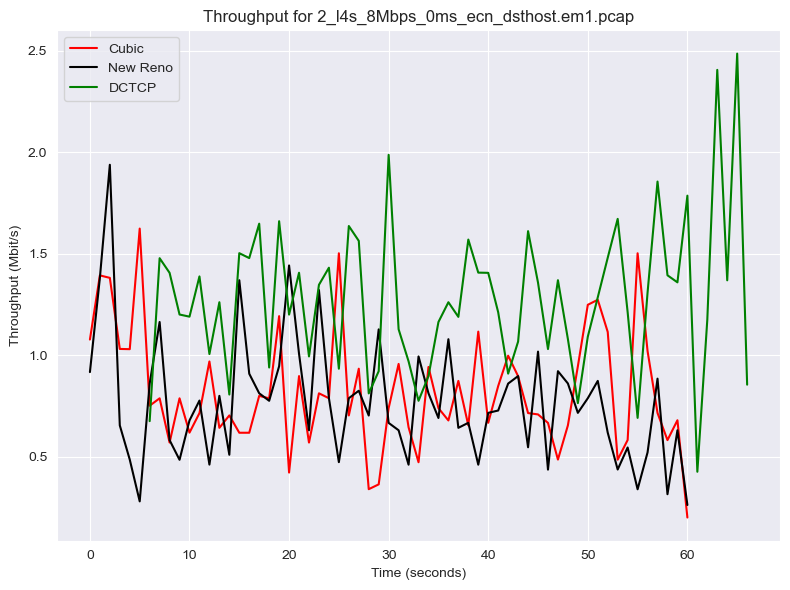

Total throughput for 2_l4s_8Mbps_10ms_ecn_dsthost.em1.pcap_throughput: {5101: 8939091, 5102: 7662650, 5103: 8001304}
Directory already exists: ./Data\Graphs


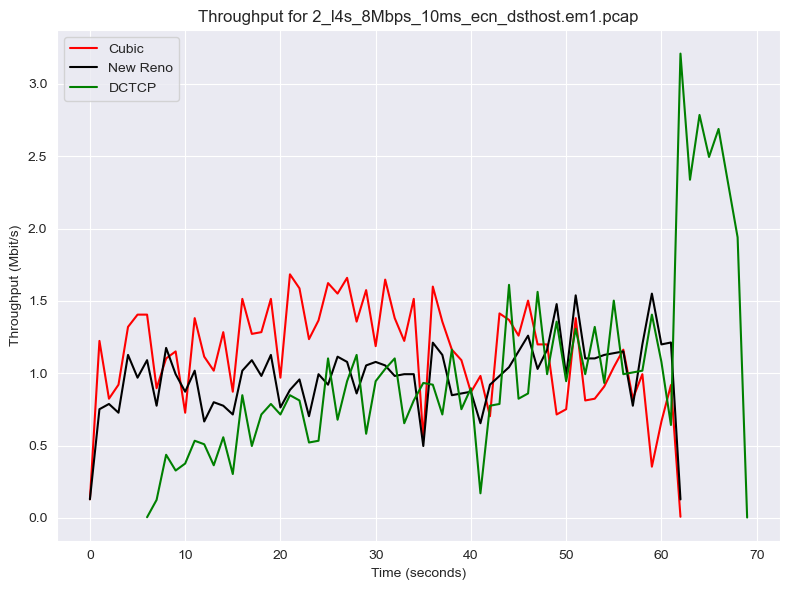

Total throughput for 2_l4s_8Mbps_1ms_ecn_dsthost.em1.pcap_throughput: {5101: 6935567, 5102: 6414028, 5103: 9417929}
Directory already exists: ./Data\Graphs


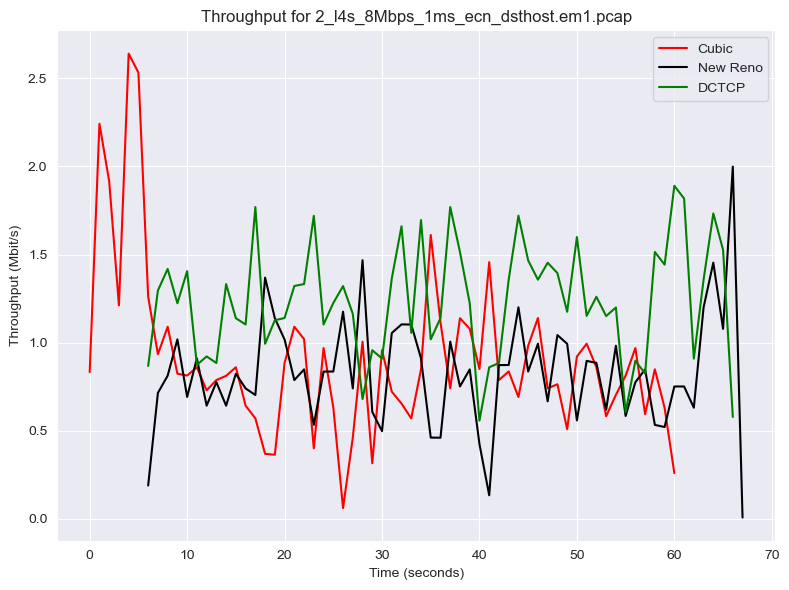

Total throughput for 2_l4s_8Mbps_20ms_ecn_dsthost.em1.pcap_throughput: {5101: 14196686, 5102: 3348412, 5103: 5768710}
Directory already exists: ./Data\Graphs


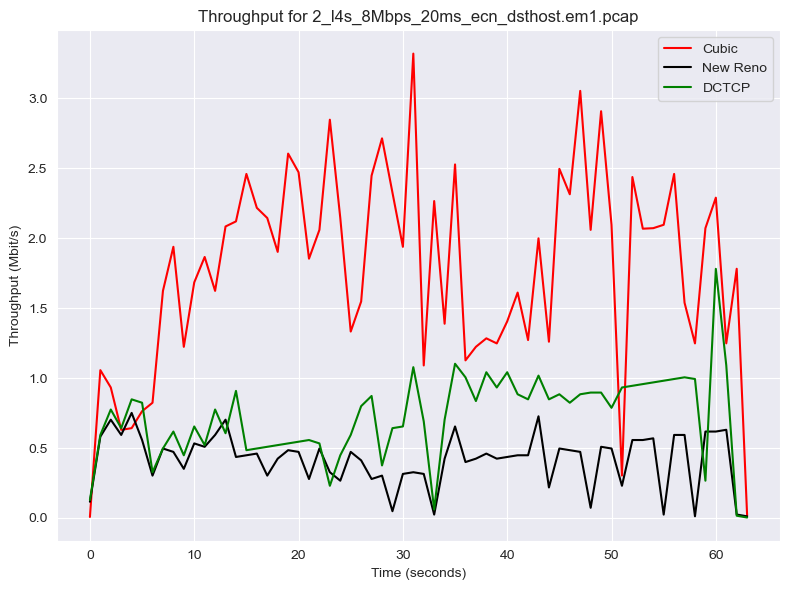

Total throughput for 2_l4s_8Mbps_5ms_ecn_dsthost.em1.pcap_throughput: {5101: 6168113, 5102: 6719921, 5103: 9061452}
Directory already exists: ./Data\Graphs


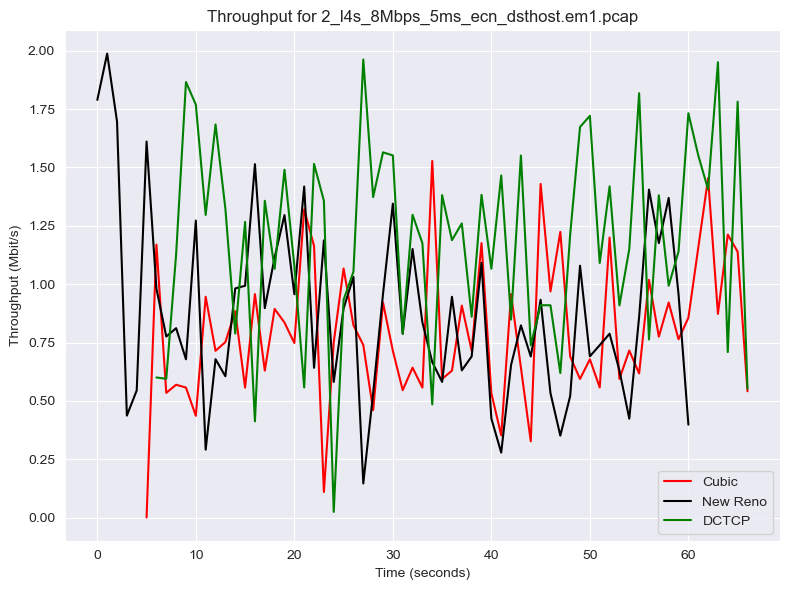

Total throughput for 2_l4s_8Mbps_7ms_ecn_dsthost.em1.pcap_throughput: {5101: 6589822, 5102: 7361189, 5103: 9824191}
Directory already exists: ./Data\Graphs


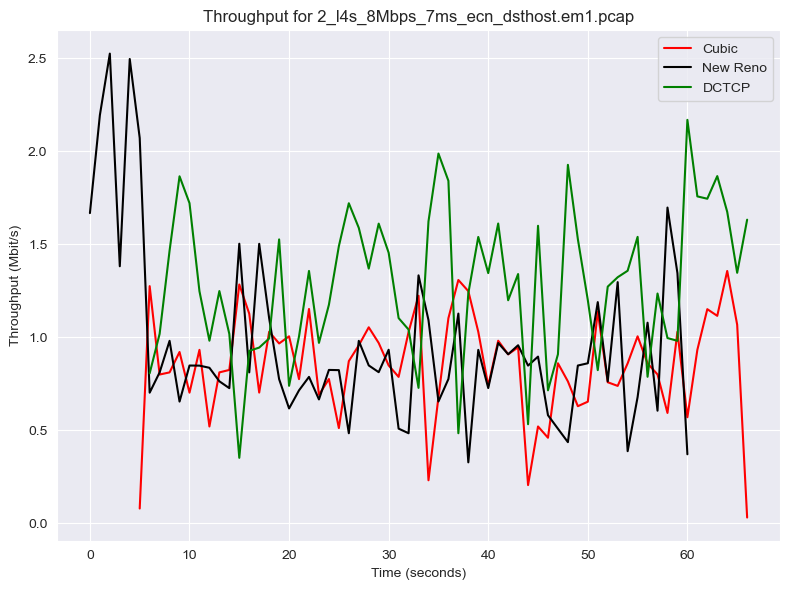

In [3]:
# Plot throughput for each pcap file
for filename, filepath in zip(filenames, filepaths):
    plot_throughput_with_siftr(
        file_path=filepath,
        ycolumn="Throughput (Mbit/s)",
        title=f"Throughput for {filename}",
        xlabel="Time (seconds)",
        ylabel="Throughput (Mbit/s)",
        filename=f"{filename}_throughput",
        graph_directory=graph_directory
    )